In [3]:
%config IPCompleter.greedy=True

<a name="Librerias"></a>
<div class ="alert alert-info">
<b> Librerias </b>

In [4]:
import io
import os

import vaex

import pandas as pd
import numpy as np

import pandas.io.sql
import pyodbc

import findspark
findspark.init() 

import databricks.koalas as ks
from pyspark.sql import SparkSession

import dask as d
import dask.dataframe as dd
import dask.array as da

#from pyspark.sql import SparkSession
#SPARK_KOALAS_AUTOPATCH=false

from datetime import datetime
from datetime import date #importamos date

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.dates import AutoDateLocator, AutoDateFormatter, date2num
import matplotlib.dates as mdates

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from mpl_toolkits.mplot3d import Axes3D

import warnings
warnings.filterwarnings('ignore')

#import lux
import pandas_profiling
from pandas_profiling import ProfileReport

#import researchpy as rp
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn import preprocessing
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.cluster import KMeans 

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import  accuracy_score, roc_curve, auc, silhouette_score, recall_score, precision_score, confusion_matrix, make_scorer
#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
#from sklearn.grid_search import GridSearchCV, ParameterGrid
from sklearn.model_selection import learning_curve, GridSearchCV


from collections import Counter
from scipy.stats import kstest
from xgboost import XGBClassifier

import unittest
from click.testing import CliRunner

#from monotonic_binning.monotonic_woe_binning import Binning
#from woe_iv import woe_iv
#from woe_iv import cli

In [5]:
os.getcwd()

'C:\\Users\\dscriollo\\Documents\\Notebooks\\Score_DaniloCriollo'

In [6]:
from os import listdir
from os.path import isfile, join
#path = 'C:\\Users\\Danilo Santiago\\OneDrive - Escuela Politécnica Nacional\\Documentos\\BanEcuador\\Score_DaniloCriollo'
path = 'C:\\Users\\dscriollo\\Documents\\Notebooks\\Score_DaniloCriollo'
#path = r'C:\\Users\\dscriollo\\Documents\\Notebooks\\Score_DaniloCriollo'
os.listdir(path)

['.ipynb_checkpoints',
 'ANALISIS CALIDAD DE DATOS.docx',
 'AVANCES SCORE DE CREDITO_012020.docx',
 'Base_24316.txt',
 'Base_Score_Test.rar',
 'Base_Score_Test2.rar',
 'Base_Score_Test2.txt',
 'Base_Score_Test_31082021.txt',
 'base_scoring.csv',
 'base_scoring.rar',
 'base_scoring.txt',
 'base_scoring_1.csv',
 'base_scoring_2.csv',
 'base_scoring_3.csv',
 'base_scoring_poa.csv',
 'base_scoring_poa.zip',
 'dask-worker-space',
 'desktop.ini',
 'Formulario Solicitud de asignación de usuario para aplicativos y BDD.pdf',
 'info_cliente_micro.xlsx',
 'modelos',
 'SCORE_MICRO_BANECUADOR_OFICINA.ipynb',
 'Score_Test_corte_07_2021.ipynb',
 'T2962-MGFARF-Montalvan-Credit.pdf',
 'Time Series Prophet.ipynb',
 'Untitled1.ipynb',
 'z_merged_output.txt',
 '~$ALISIS CALIDAD DE DATOS.docx']


# CARGAR DATOS
<a name="Cargar Datos"></a>
<div class ="alert alert-info">
<b> Conexion al Servidor de BanEcuador </b>

In [6]:
#%%timeit 
#cnxn = pyodbc.connect('DSN=riesgos_prod;User=dscriollo;Password=dscriollo2020')
#df_cliente= pandas.io.sql.read_sql("select ente, fecha_crea_cliente, fecha_corte, cl_calif_act from riesgos.informacion_clientes where fecha_corte = '2020-12-31' and cedula_ruc in (select ca_num_cedruc from riesgos.his_anexcain_v  where ca_fecha_proceso = '2020-12-31' and ca_estado <> 3  and ca_cla_cartera in ('M','MR','ME','MN'))", cnxn)

## De TXT a CSV 

In [7]:
#df = pd.read_csv('base_scoring.txt', sep='~', header='infer',  encoding = 'ISO-8859-1', error_bad_lines=True, low_memory=False)
#df.head(2)

In [8]:
#df.to_csv('base_scoring.csv', sep ="~", index = None, header = True)

In [9]:
#df_cliente = df_cliente.iloc[1:,:]
pd.set_option('display.max_columns', 500)
pd.set_option('max_colwidth', 1000)

## Cargar CSV 

In [10]:
df_cliente = pd.read_csv('base_scoring.csv', sep = "~")
df_cliente.head(2)

,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistóricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Nro_op,bandera_Demanda_Judicial
0,2018-04-30 00:00:00.000,3100638,1826988,510035898,426122,100006550,PERALTA JIMBO ROBERTO CESAR,1934-12-14 00:00:00.000,84.0,M,001MCRE,36.2,PECUARIO,2016-05-03 00:00:00.000

In [11]:
df_cliente.shape

(669000, 205)

## Lista de Variables

In [12]:
df_cliente.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 669000 entries, 0 to 668999
Data columns (total 205 columns):
 #    Column                                       Dtype  
---   ------                                       -----  
 0    fecha_corte                                  object 
 1    op_operacion                                 int64  
 2    nro_tramite                                  int64  
 3    nro_operacion                                int64  
 4    ente                                         int64  
 5    cedula                                       int64  
 6    nombre_cliente                               object 
 7    fecha_nacimiento                             object 
 8    edad                                         float64
 9    tipo_credito                                 object 
 10   tipo_operacion                               object 
 11   op_sector_bnf                                object 
 12   des_op_sector_bnf                            object 
 13

<a name="RENOMBRAR"></a>
<div class ="alert alert-info">
<b> RENOMBRAR </b>

In [13]:
df_cliente = df_cliente.rename(columns={"mayorplazovencidohistóricototal":"mayorplazovencidohistoricototal"})
df_cliente = df_cliente.rename(columns={"Nro_op":"Ciclo"})

# Calidad de Datos

## Verificar IDS

 '''ids = ente , cedula , nro_operacion'''

In [14]:
# ente.1 cruza la infromaciopn sociodemografica
df_ids = df_cliente.loc[:,['ente','ente.1','cedula','cedula_ruc','op_operacion','nro_operacion', 'nro_tramite','p_pasaporte','nombre_cliente' ]  ]
df_ids = df_ids.sort_values(by = 'ente.1', ascending=False,  na_position='first')
df_ids.head(2)

,ente,ente.1,cedula,cedula_ruc,op_operacion,nro_operacion,nro_tramite,p_pasaporte,nombre_cliente
53875,2040768,NaN,401014691,NaN,2288026,160036636,1414453,NaN,MORENO VALLEJOS GERMAN BAYARDO
53988,2225352,NaN,401027313,NaN,2357897,180039276,1449797,NaN,MUESES PERENGUES RAUL BUENAVENTURA


In [15]:
#filtro = [555247,668443,1198866,2225352,2040768]
#filtro = ['401014691','401027313','401769393','1002174108','1203073554']
print("Conteo de Valores - Null values:\n", df_ids.isnull().sum()) 

Conteo de Valores - Null values:
 ente                   0
ente.1                 7
cedula                 0
cedula_ruc             7
op_operacion           0
nro_operacion          0
nro_tramite            0
p_pasaporte       669000
nombre_cliente         0
dtype: int64


In [16]:
#df_cliente = df_cliente[(df_cliente['cedula_ruc'].isnull())]
#df_cliente.head(26)

In [17]:
df_cliente['cedula'].isna().sum()

0

In [18]:
df_cliente = df_cliente[~(df_cliente['cedula_ruc'].isnull())]
df_cliente.head(2)

,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Ciclo,bandera_Demanda_Judicial
0,2018-04-30 00:00:00.000,3100638,1826988,510035898,426122,100006550,PERALTA JIMBO ROBERTO CESAR,1934-12-14 00:00:00.000,84.0,M,001MCRE,36.2,PECUARIO,2016-05-03 00:00:00.000,

## Registros Duplicados

In [19]:
df_cliente.duplicated().sum()

0

In [20]:
#df_cliente.loc[df_cliente['ente'].idxmax()]
df_cliente_duplicate = df_cliente.loc[(df_cliente['ente'] == 572686) , :]
df_cliente_duplicate.head(3)

,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Ciclo,bandera_Demanda_Judicial
415544,2016-03-31 00:00:00.000,582551,381930,194681145608,572686,1301497341,MACIAS CEDEO CARLOS ALBERTO,1942-11-29 00:00:00.000,74.0,M,001M,33.1,AGRICOLA,2008-04-17 00:00:00.

In [21]:
df_cliente_duplicate.shape

(2, 205)

## Seleccionar clientes con el peor credito

In [22]:
df_cliente_sorted = df_cliente.sort_values(by = ['ente','atraso_maximo'])
df_cliente_sorted.head(2)

,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Ciclo,bandera_Demanda_Judicial
207627,2015-07-31 00:00:00.000,428707,388574,214671815708,10,912460110,HIDALGO ORTEGA CECILIA DEL ROCIO,1967-12-19 00:00:00.000,48.0,M,001M,67.3,HABILIDADES ESPECIALES,2008-1

In [23]:
# Se escoge el credito que presente mas mora, no el credito mas reciente
df_cliente_unique = df_cliente_sorted.drop_duplicates(subset = "ente", inplace = False, keep = 'last')
df_cliente_unique.head(2)

,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Ciclo,bandera_Demanda_Judicial
207627,2015-07-31 00:00:00.000,428707,388574,214671815708,10,912460110,HIDALGO ORTEGA CECILIA DEL ROCIO,1967-12-19 00:00:00.000,48.0,M,001M,67.3,HABILIDADES ESPECIALES,2008-1

In [24]:
df_cliente = df_cliente_unique
df_cliente.shape

(426508, 205)

In [25]:
duplicate = df_cliente.duplicated()
print(duplicate.sum())
df_cliente[duplicate]

0


,fecha_corte,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,fecha_nacimiento,edad,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_contabilizacion,mes_contabilizacion,fecha_vencimiento,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,fecha_nacimiento.1,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,meses_residencia,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,des_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_ingreso,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,fecha_corte.1,cl_calif_act,Ciclo,bandera_Demanda_Judicial


## Población de Variables <a name="PoblacionVariables"></a>
<div class ="alert alert-info">
<b> Poblacion de Variables </b>

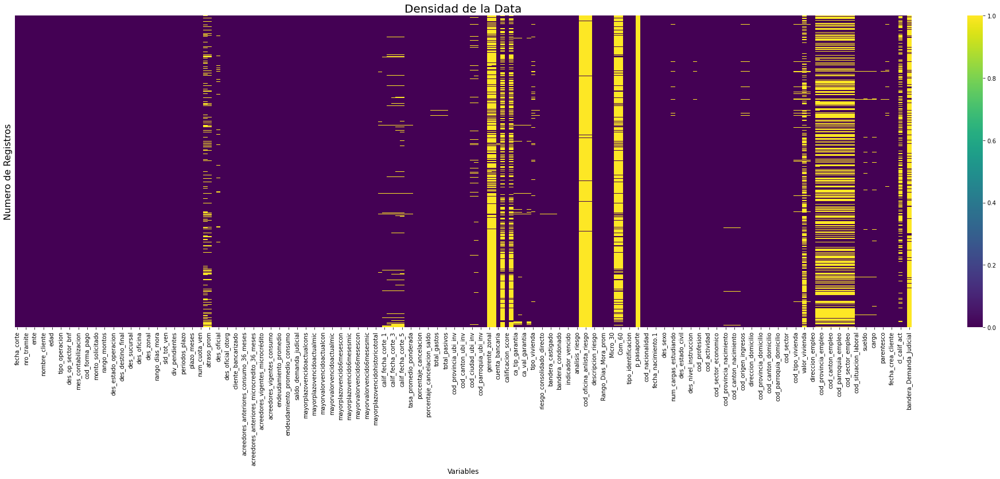

In [26]:
plt.figure(figsize=(35,10))
sns.heatmap(df_cliente.isnull(),yticklabels=False,cbar=True,cmap='viridis')
plt.xlabel("Variables", size=12)
plt.ylabel("Numero de Registros", size=16)
plt.title("Densidad de la Data", size=20)
plt.show()

ValueError: The number of FixedLocator locations (0), usually from a call to set_ticks, does not match the number of ticklabels (205).

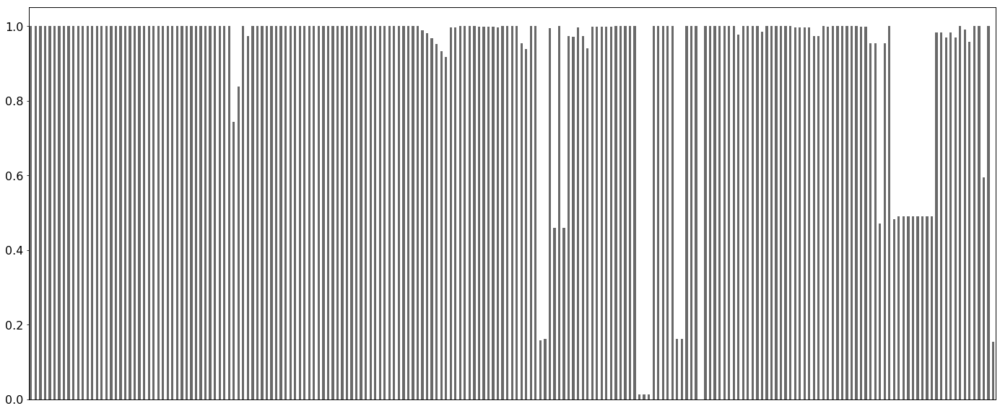

In [27]:
import missingno as msno
%matplotlib inline
#msno.matrix(df_cliente)
msno.bar(df_cliente)
#msno.heatmap(df_cliente)

## Valores Nulos <a name="ValoresNulos"></a>
<div class ="alert alert-info">
<b> Valores Nulos </b>

In [ ]:
df_null = list(zip(np.array(list(df_cliente)),np.array(df_cliente.isnull().sum())))
df_null = pd.DataFrame(df_null,  columns =['Var_Cliente','Num_Nulos']).sort_values('Num_Nulos', ascending = False)

In [ ]:
df_null= round(df_null.assign(Nulos_Percen = (df_null.Num_Nulos/len(df_cliente))),3)
df_null= df_null.sort_values(by=['Nulos_Percen'], ascending=False)
format_dict = {'Nulos_Percen': '{:.2%}'}
df_null.style.format(format_dict).hide_index()
#df_null.query('Nulos_Percen > 15' )

## Borrar Variables IDS <a name="String"></a>
<div class ="alert alert-info">
<b> VARIABLES IDS  </b>

In [ ]:
df_cliente.drop(['ente.1','cedula_ruc','op_operacion','nro_tramite','p_pasaporte' ] , axis = 1, inplace = True)

## Borrar Variables Cod<a name="String"></a>
<div class ="alert alert-info">
<b> VARIABLES STRING </b>

In [ ]:
#df_cliente.info(verbose= True)

In [ ]:
df_cliente.drop(['cod_forma_pago', 'cod_estado_operacion', 'cod_destino_final', 'cod_sucursal', 'cod_oficina', 'cod_zonal', 'cod_oficial', 'cod_oficial_otorg', 'cod_provincia_ubi_inv', 'cod_canton_ubi_inv', 'cod_ciudad_ubi_inv', 'cod_parroquia_ubi_inv', 'codigo_analista_riesgo', 'cod_oficina_anlista_riesgo', 'cod_nacionalidad', 'cod_sexo', 'cod_estado_civil', 'cod_nivel_instruccion', 'cod_profesion', 'cod_actividad', 'cod_sector_economico', 'cod_provincia_nacimiento', 'cod_canton_nacimiento', 'cod_origen_ingresos', 'cod_provincia_domicilio', 'cod_canton_domicilio', 'cod_parroquia_domicilio', 'cod_sector', 'cod_tipo_vivienda', 'cod_provincia_empleo', 'cod_canton_empleo', 'cod_parroquia_empleo', 'cod_sector_empleo', 'cod_situacion_laboral'], axis = 1, inplace = True)

## Borrar Variables Repetidas  <a name="VariablesRepetidas"></a>
<div class ="alert alert-info">
<b> Variables Repetidas </b>

In [ ]:
df_cliente['tipo_vivienda'].unique() 
#"tipo_credito"  analisis_riesgo

In [ ]:
#df_cliente.astype(str).groupby('tipo_vivienda', sort=True)['tipo_vivienda'].count()

In [ ]:
#df_cliente.astype(str).groupby('tipo_vivienda.1', sort=True)['tipo_vivienda.1'].count()

In [ ]:
f, axes = plt.subplots(figsize=(8, 4), ncols=2)
sns.despine(left=True)

x1 = ['PROPIA NO HIPOTECADA', 'VIVE CON FAMILIARES','ARRENDADA', 'PROPIA HIPOTECADA','PRESTADA','nan']
y1 = [282213,255104,50086,41873,10267,29457]
g1 = sns.barplot(x1, y1, ax=axes[0])
axes[0].set_xticklabels(labels=x1, rotation=90)

x2 = ['PROPIA NO HIPOTECADA','VIVE CON FAMILIARES','ARRENDADA', 'PROPIA HIPOTECADA', 'PRESTADA','nan']
y2 = [292106,253703,50541,41509,10302,20839]
g2 = sns.barplot(x2, y2, ax=axes[1])
axes[1].set_xticklabels(labels=x2, rotation=90)

plt.show()

In [ ]:
pd.crosstab(df_cliente['tipo_vivienda'],df_cliente['tipo_vivienda.1'],margins=True, margins_name="Total")

In [ ]:
#import sidetable
#df_cliente.stb.freq(['tipo_vivienda','tipo_vivienda.1'])

In [ ]:
df_cliente.drop(['tipo_vivienda'], axis = 1, inplace = True)
df_cliente.rename(columns = {'tipo_vivienda.1':'tipo_vivienda'}, inplace = True)

In [ ]:
#df_cliente.astype(str).groupby('des_sector', sort=True)['des_sector'].count()

In [ ]:
#df_cliente.astype(str).groupby('des_sector_empleo', sort=True)['des_sector'].count()

In [ ]:
pd.crosstab(df_cliente['des_sector'],df_cliente['des_sector_empleo'],margins=True, margins_name="Total")

In [ ]:
f, axes = plt.subplots(figsize=(8, 4), ncols=2)
sns.despine(left=True)

x1 = ['SECTOR RURAL', 'SECTOR URBANO','nan']
y1 = [334436,334050,478]
g1 = sns.barplot(x1, y1, ax=axes[0])
axes[0].set_xticklabels(labels=x1, rotation=90)

x2 = ['SECTOR RURAL', 'SECTOR URBANO','nan']
y2 = [228589,120192,320183]
g2 = sns.barplot(x2, y2, ax=axes[1])
axes[1].set_xticklabels(labels=x2, rotation=90)

plt.show()

In [ ]:
#import sidetable
#df_cliente.stb.freq(['cl_calif_act','calificacion_score'])

In [28]:
df_cliente.drop(['des_sector_empleo'], axis = 1, inplace = True)
#df_cliente.rename(columns = {'des_sector_empleo':'des_sector'}, inplace = True)

In [29]:
#df_cliente.astype(str).groupby('cl_calif_act', sort=True)['cl_calif_act'].count()

In [30]:
#df_cliente.astype(str).groupby('calificacion_score', sort=True)['calificacion_score'].count()

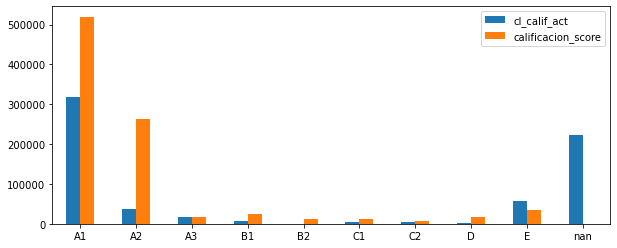

In [31]:
cl_calif_act = [316897, 37367, 16051, 6631, 459, 4384, 3907,3209,56335,223760]
calificacion_score = [519550, 262558, 16368, 23787, 11316, 12661,7624,16340, 35099, 0]
index = ['A1', 'A2', 'A3','B1', 'B2', 'C1', 'C2','D', 'E', 'nan']
df_cal = pd.DataFrame({'cl_calif_act': cl_calif_act,
                   'calificacion_score': calificacion_score}, index=index)
ax = df_cal.plot.bar(rot=0, figsize=(10,4))

In [32]:
pd.crosstab(df_cliente['cl_calif_act'],df_cliente['calificacion_score'],margins=True, margins_name="Total")

calificacion_score,A1,A2,A3,B1,B2,C1,C2,D,E,Total
cl_calif_act,,,,,,,,,,
A1,168614,2518,1500,1309,911,676,510,628,1297,177963
A2,18828,349,289,281,248,234,148,149,463,20989
A3,8000,123,102,117,74,61,62,61,194,8794
B1,3440,54,36,31,28,32,10,24,65,3720
B2,258,1,3,1,1,3,2,4,5,278
C1,2408,14,14,19,11,14,10,13,32,2535
C2,2331,24,6,17,9,14,6,5,32,2444
D,1839,12,10,11,16,18,6,6,24,1942
E,34111,308,114,174,92,93,40,114,195,35241


In [33]:
df_cliente.drop(['cl_calif_act'], axis = 1, inplace = True)

In [34]:
df_cliente.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426508 entries, 207627 to 263800
Data columns (total 203 columns):
 #    Column                                       Dtype  
---   ------                                       -----  
 0    fecha_corte                                  object 
 1    op_operacion                                 int64  
 2    nro_tramite                                  int64  
 3    nro_operacion                                int64  
 4    ente                                         int64  
 5    cedula                                       int64  
 6    nombre_cliente                               object 
 7    fecha_nacimiento                             object 
 8    edad                                         float64
 9    tipo_credito                                 object 
 10   tipo_operacion                               object 
 11   op_sector_bnf                                object 
 12   des_op_sector_bnf                            object

##  Borrar Variables Temporales<a name="Temporales"></a>
<div class ="alert alert-info">
<b> VARIABLES TEMPORALES </b>

In [35]:
df_cliente.rename(columns = {'fecha_contabilizacion':'fecha_originacion'}, inplace = True) 

In [36]:
#df_cliente.rename(columns = {'mes':'mes_contabilizacion'}, inplace = True) 

In [37]:
df_cliente['fecha_corte'] = pd.to_datetime(df_cliente['fecha_corte'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_corte.1'] = pd.to_datetime(df_cliente['fecha_corte.1'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_nacimiento'] = pd.to_datetime(df_cliente['fecha_nacimiento'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_nacimiento.1'] = pd.to_datetime(df_cliente['fecha_nacimiento.1'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_vencimiento'] = pd.to_datetime(df_cliente['fecha_vencimiento'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_ingreso'] = pd.to_datetime(df_cliente['fecha_ingreso'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_crea_cliente'] = pd.to_datetime(df_cliente['fecha_crea_cliente'], format="%Y-%m-%d",  errors='coerce')
df_cliente['fecha_originacion'] = pd.to_datetime(df_cliente['fecha_originacion'], format="%Y-%m-%d",  errors='coerce')
#df_cliente.rename(columns = {'fecha_contabilizacion':'fecha_originacion'}, inplace = True) 

In [38]:
df_cliente['anio'] = pd.to_datetime(df_cliente['fecha_originacion'], format="%y",  errors='coerce')
df_cliente['mes'] = pd.to_datetime(df_cliente['fecha_originacion'], format="%m",  errors='coerce')
df_cliente['AnioMes'] = pd.to_datetime(df_cliente['fecha_originacion']).apply(lambda x: '{year}-{month}'.format(year=x.year, month=x.month))
df_cliente['AnioMes'] = pd.to_datetime(df_cliente['AnioMes'], format="%Y-%m",  errors='coerce')

In [39]:
df_cliente["edad_uno"] = df_cliente["fecha_nacimiento.1"].apply(lambda x : (datetime.now().year - x.year))
df_cliente["edad_dos"] = df_cliente["fecha_nacimiento"].apply(lambda x : (datetime.now().year - x.year))

<Figure size 576x396 with 0 Axes>

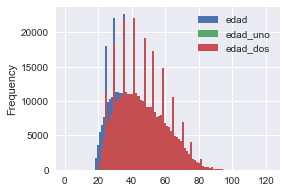

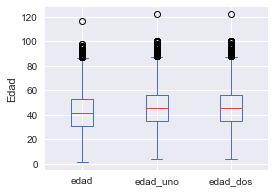

In [40]:

#print(plt.style.available)
plt.style.use(['seaborn'])
fig = plt.figure() 
#ax1 = plt.subplot(1,2,1)
df_cliente[['edad','edad_uno','edad_dos']].plot(kind='hist', bins = 100, figsize=(4,3))
#ax2 = plt.subplot(1,2,2) 
df_cliente[['edad','edad_uno','edad_dos']].plot(kind='box', layout=(1,3), figsize=(4,3))
plt.ylabel('Edad')
plt.show()

In [41]:
#df_cliente["fecha_ingreso"] = pd.to_datetime(df_cliente["fecha_ingreso"])
#df_cliente["fecha_crea_cliente"] = pd.to_datetime(df_cliente["fecha_crea_cliente"])

df_cliente["antiguedad_lab"] = df_cliente["fecha_ingreso"].apply(lambda x : (datetime.now().year - x.year))
df_cliente["antiguedad_cli"] = df_cliente["fecha_crea_cliente"].apply(lambda x : (datetime.now().year - x.year))

In [42]:
df_cliente = np.round(df_cliente.assign(antiguedad_reside_mes = lambda x: (x['meses_residencia']/12)))

<AxesSubplot:>

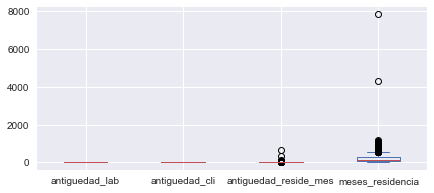

In [43]:
df_cliente[['antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes','meses_residencia']].plot(kind='box', layout=(1,4), figsize=(7,3))

<AxesSubplot:>

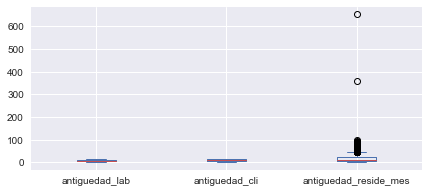

In [44]:
df_cliente[['antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes']].plot(kind='box', layout=(1,4), figsize=(7,3))

In [45]:
#df_cliente["antiguedad_cred"] = df_cliente_date["fecha_vencimiento"].apply(lambda x : (datetime.now().year - x.year))

In [46]:
#df_cliente['plazo_dias'] = abs(df_cliente['fecha_vencimiento'] - df_cliente['fecha_originacion'])

In [47]:
#df_cliente.rename(columns = {'meses_residencia':'antiguedad_reside_mes'}, inplace = True) 
df_cliente.rename(columns = {'fecha_contabilizacion':'fecha_originacion'}, inplace = True) 

In [48]:
df_cliente.drop(['fecha_corte','fecha_nacimiento','fecha_nacimiento.1','fecha_vencimiento','fecha_ingreso','fecha_corte.1', 'edad', 'edad_dos','meses_residencia'], axis = 1, inplace = True)

In [49]:
df_cliente = df_cliente.rename(columns={"edad_uno":"Edad"})

In [50]:
df_cliente.head(3)

,op_operacion,nro_tramite,nro_operacion,ente,cedula,nombre_cliente,tipo_credito,tipo_operacion,op_sector_bnf,des_op_sector_bnf,fecha_originacion,mes_contabilizacion,cod_forma_pago,des_forma_pago,monto_solicitado,monto_aprobado,rango_montos,cod_estado_operacion,des_estado_operacion,cod_destino_final,des_destino_final,cod_sucursal,des_sucursal,cod_oficina,des_oficina,cod_zonal,des_zonal,dias_ven_cap,rango_dias_mora,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_dias,plazo_meses,rango_plazos_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,des_oficial,cod_oficial_otorg,des_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_anteriores_consumo_36_meses,acreedores_anteriores_comercial_36_meses,acreedores_anteriores_microcredito_36_meses,acreedores_vigentes,acreedores_vigentes_microcrédito,acreedores_vigentes_comercial,acreedores_vigentes_consumo,saldo_total_deuda_actual_ifis,endeudamiento_promedio,endeudamiento_promedio_microcredito,endeudamiento_promedio_consumo,endeudamiento_promedio_comercial,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualcons,mayorplazovencidoactualcom,mayorplazovencidoactualmic,mayorplazovencidoactualtotal,mayorvalorvencidoactualcon,mayorvalorvencidoactualcom,mayorvalorvencidoactualmic,mayorvalorvencidoactualtotal,mayorplazovencido6mesescon,mayorplazovencido6mesescom,mayorplazovencido6mesesmic,mayorplazovencido6mesestotal,mayorvalorvencido6mesescon,mayorvalorvencido6mesescom,mayorvalorvencido6mesesmic,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,calif_fecha_corte,calif_fecha_corte_1,calif_fecha_corte_2,calif_fecha_corte_3,calif_fecha_corte_4,calif_fecha_corte_5,tasa_pact_otorg,tasa_promedio_ponderada,plazo_promedio_ponderado,porcentaje_cancelacion,rango_porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,telefonos_registrados,cod_provincia_ubi_inv,des_provincia_ubi_inv,cod_canton_ubi_inv,des_canton_ubi_inv,cod_ciudad_ubi_inv,des_ciudad_ubi_inv,cod_parroquia_ubi_inv,des_parroquia_ubi_inv,gerente_zonal,gerente_sucursal,cuenta_bancaria,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia,ca_tip_garantia_categ,ca_val_garantia,ca_des_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,tr_truta,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,fabrica_riesgo,descripcion_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,Micro_30,Com_30,Com_60,ente.1,tipo_identificacion,cedula_ruc,p_pasaporte,nombre,cod_nacionalidad,des_nacionalidad,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,des_profesion,cod_actividad,des_actividad,cod_sector_economico,desc_sector_economico,cod_provincia_nacimiento,des_provincia_nacimiento,cod_canton_nacimiento,des_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,direccion_domicilio,referencia_domicilio,cod_provincia_domicilio,des_provincia_domicilio,cod_canton_domicilio,des_canton_domicilio,cod_parroquia_domicilio,des_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,direccion_empleo,referencia_empleo,cod_provincia_empleo,des_provincia_empleo,cod_canton_empleo,des_canton_empleo,cod_parroquia_empleo,des_parroquia_empleo,cod_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,cargo,referencia_personal,parentesco,email,fecha_crea_cliente,Ciclo,bandera_Demanda_Judicial,anio,mes,AnioMes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes
207627,428707,388574,214671815708,10,912460110,HIDALGO ORTEGA CECILIA DEL ROCIO,M,001M,67.3,HABILIDADES ESPECIALES,2008-12-09,12.0,ME,MENSUAL,2000.0,2000.0,0-3000,4,CASTIGADO,104080,OTROS GANADOS,21,DAULE,21,DAULE,19,ZONAL GUAYAQUIL,2399,+1080,0.0,1.0


## Borrar Variables Continuas

<a name="CONTINUAS"></a>
<div class ="alert alert-info">
<b> VARIABLES CONTINUAS </b>

In [51]:
df_cliente.drop(['monto_solicitado','acreedores_anteriores_consumo_36_meses','acreedores_anteriores_comercial_36_meses','acreedores_anteriores_microcredito_36_meses', 'acreedores_vigentes_microcrédito', 'acreedores_vigentes_comercial',
'acreedores_vigentes_consumo', 'endeudamiento_promedio_microcredito','endeudamiento_promedio_consumo', 'endeudamiento_promedio_comercial', 'mayorplazovencidoactualcons', 'mayorplazovencidoactualcom',
'mayorplazovencidoactualmic', 'mayorplazovencido6mesescon', 'mayorplazovencido6mesescom', 'mayorplazovencido6mesesmic', 'mayorvalorvencido6mesescon', 'mayorvalorvencido6mesescom','mayorvalorvencido6mesesmic', 
'mayorvalorvencidoactualcon','mayorvalorvencidoactualcom', 'mayorvalorvencidoactualmic', 'plazo_promedio_ponderado','tasa_pact_otorg','tasa_promedio_ponderada','plazo_dias','mes_contabilizacion','tr_truta'], axis = 1, inplace = True)

## Borrar Variables Categoricas

<a name="CATEGORICAS"></a>
<div class ="alert alert-info">
<b> VARIABLES CATEGORICAS </b>

In [52]:
df_cliente['desc_sector_economico'].value_counts()

HOGARES                             317150
OTROS                                92708
EMPRESAS                             12003
GOBIERNO CENTRAL                      2280
EMPRESAS PUBLICAS NO FINANCIERAS       714
GOBIERNOS PROVINCIALES Y LOCALES       613
OTRAS SOCIEDADES DE DEPOSITO           373
OTROS INTERMEDIARIOS FINANCIEROS       288
FONDOS DE LA SEGURIDAD SOCIAL          119
NO RESIDENTES                           91
OFF-SHORE                               74
BANCO CENTRAL                           39
MIES                                    28
AUXILIARES FINANCIEROS Y SEGUROS        24
BONO JOAQUIN GALLEGOS LARA               4
Name: desc_sector_economico, dtype: int64

In [53]:
df_cliente.drop(['tipo_credito', 'tipo_operacion', 'op_sector_bnf','des_sucursal', 'des_oficina', 'rango_montos', 'rango_dias_mora', 'rango_plazos_meses', 'des_oficial', 'des_oficial_otorg', 'calif_fecha_corte', 'calif_fecha_corte_1', 'calif_fecha_corte_2', 'calif_fecha_corte_3', 'calif_fecha_corte_4', 'calif_fecha_corte_5', 'rango_porcentaje_cancelacion', 'telefonos_registrados', 'des_provincia_ubi_inv', 'des_canton_ubi_inv', 'des_ciudad_ubi_inv', 'des_parroquia_ubi_inv', 'gerente_zonal', 'gerente_sucursal', 'cuenta_bancaria', 'fabrica_riesgo', 'descripcion_riesgo', 'Micro_30', 'Com_30', 'Com_60', 'tipo_identificacion', 'des_nacionalidad', 'des_provincia_nacimiento', 'des_canton_nacimiento', 'direccion_domicilio', 'referencia_domicilio', 'des_provincia_domicilio', 'des_canton_domicilio', 'des_parroquia_domicilio', 'des_provincia_empleo','des_canton_empleo','des_parroquia_empleo','direccion_empleo', 'referencia_empleo', 'cargo', 'referencia_personal', 'parentesco', 'email' ,'des_destino_final','ca_tip_garantia','ca_des_garantia','des_profesion','des_actividad','desc_sector_economico'], axis = 1, inplace = True)

In [54]:
df_cliente.drop(['nombre_cliente','nombre'], axis = 1 , inplace = True)

In [55]:
df_cliente.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426508 entries, 207627 to 263800
Data columns (total 118 columns):
 #    Column                           Dtype         
---   ------                           -----         
 0    op_operacion                     int64         
 1    nro_tramite                      int64         
 2    nro_operacion                    int64         
 3    ente                             int64         
 4    cedula                           int64         
 5    des_op_sector_bnf                object        
 6    fecha_originacion                datetime64[ns]
 7    cod_forma_pago                   object        
 8    des_forma_pago                   object        
 9    monto_aprobado                   float64       
 10   cod_estado_operacion             int64         
 11   des_estado_operacion             object        
 12   cod_destino_final                int64         
 13   cod_sucursal                     int64         
 14   cod_oficina  

## Algunas Correcciones  <a name="Modificar"></a>
<div class ="alert alert-info">
<b> Variables Modificadas </b>

In [56]:
categorizar =  {"analisis_riesgo":{1:"SI", 0:"NO"},
               "cliente_nuevo":{1:"SI", 0:"NO"},
               "cliente_bancarizado":{1:"SI", 0:"NO"},
               "bandera_castigado":{1:"SI", 0:"NO"},
               "bandera_reestructurado":{1:"SI", 0:"NO"},
               "bandera_condonado":{1:"SI", 0:"NO"},
               "cartera_heredada":{1:"SI", 0:"NO"},
               "indicador_vencido":{1:"SI", 0:"NO"},
               "peor_calificacion":{1:"A1", 2:"A2", 3:"A3",4:"B1",5:"B2", 6:"C1",7:"C2", 8:"D", 9:"E"}
               }
# bandera_Demanda_Judicial
df_cliente = df_cliente.replace(categorizar)

### Clientes Nuevos

In [57]:
#df_cliente.astype(str).groupby('cliente_nuevo', sort=True)['cliente_nuevo'].count()

In [58]:
# Corregir NaNs de Clientes Nuevos que tienen un credito, si tiene un credito ya es bancarizado
df_cliente_nuevo = df_cliente.loc[:,['fecha_originacion','antiguedad_cli', 'score_buro', 'cliente_nuevo','cliente_bancarizado','Ciclo', 'Micro_60']]
df_cliente_nuevo = df_cliente_nuevo.sort_values(by = 'cliente_nuevo', ascending=False,  na_position='first')
df_cliente_nuevo.head(10)

,fecha_originacion,antiguedad_cli,score_buro,cliente_nuevo,cliente_bancarizado,Ciclo,Micro_60
599688,2017-02-03,14,NaN,NaN,NaN,1,BUENO
472043,2014-12-19,14,NaN,NaN,NaN,1,BUENO
229364,2015-01-13,14,NaN,NaN,NaN,1,BUENO
377414,2020-02-21,14,NaN,NaN,NaN,1,BUENO
380618,2015-01-27,13,NaN,NaN,NaN,1,BUENO
69430,2017-01-16,14,NaN,NaN,NaN,1,BUENO
564659,2018-04-24,14,NaN,NaN,NaN,1,BUENO
347214,2014-12-22,14,NaN,NaN,NaN,1,BUENO
439745,2014-11-28,14,NaN,NaN,NaN,1,BUENO
412548,2015-02-09,13,NaN,NaN,NaN,1,BUENO


In [59]:
pd.crosstab(df_cliente['Ciclo'],df_cliente['cliente_nuevo'])

cliente_nuevo,NO,SI
Ciclo,,
1,269879,45
2,101498,0
3,35582,0
4,12310,0
5,4260,0
6,1685,0
7,681,0
8,313,0
9,90,0


In [60]:
# Se define Cliente Nuevo en funcion del Ciclo
#df_cliente['cliente_nuevo'] = df_cliente['cliente_nuevo'].apply(lambda x: 'SI' if x <= 1 else 'NO')
#df_cliente['cliente_nuevo'] = np.where(df_cliente['Ciclo'] <= 1 , 'SI', 'NO')
df_cliente.loc[df_cliente.Ciclo <=1,'cliente_nuevo']='SI'
df_cliente.loc[df_cliente.Ciclo > 1,'cliente_nuevo']='NO'

In [61]:
df_cliente_nuevo[df_cliente_nuevo['cliente_nuevo'].isna()]
df_cliente_nuevo[df_cliente_nuevo['cliente_nuevo'].isnull()]

,fecha_originacion,antiguedad_cli,score_buro,cliente_nuevo,cliente_bancarizado,Ciclo,Micro_60
599688,2017-02-03,14,NaN,NaN,NaN,1,BUENO
472043,2014-12-19,14,NaN,NaN,NaN,1,BUENO
229364,2015-01-13,14,NaN,NaN,NaN,1,BUENO
377414,2020-02-21,14,NaN,NaN,NaN,1,BUENO
380618,2015-01-27,13,NaN,NaN,NaN,1,BUENO
...,...,...,...,...,...,...,...
4227,2020-02-10,2,NaN,NaN,NaN,1,BUENO
317951,2020-07-21,2,NaN,NaN,NaN,1,BUENO
80953,2020-02-19,2,NaN,NaN,NaN,1,BUENO
27242,2020-03-13,2,NaN,NaN,NaN,1,BUENO


In [62]:
df_cliente_nuevo = df_cliente.loc[:,['fecha_originacion','antiguedad_cli', 'score_buro', 'cliente_nuevo','cliente_bancarizado','Ciclo', 'Micro_60']]
df_cliente_nuevo = df_cliente_nuevo.sort_values(by = 'cliente_nuevo', ascending=False,  na_position='first')
df_cliente_nuevo.head(10)

,fecha_originacion,antiguedad_cli,score_buro,cliente_nuevo,cliente_bancarizado,Ciclo,Micro_60
207627,2008-12-09,14,301.0,SI,NO,1,MALO
341339,2014-05-05,8,955.0,SI,SI,1,BUENO
586545,2014-04-01,8,55.0,SI,NO,1,MALO
617288,2014-03-17,8,813.0,SI,SI,1,BUENO
387504,2020-09-28,8,NaN,SI,SI,1,BUENO
216334,2015-01-30,8,774.0,SI,SI,1,BUENO
120882,2019-12-16,8,NaN,SI,SI,1,BUENO
162769,2019-09-04,8,NaN,SI,SI,1,MALO
315918,2014-04-01,8,958.0,SI,SI,1,BUENO
577636,2014-03-24,8,163.0,SI,SI,1,MALO


In [63]:
#df_cliente.astype(str).groupby('cliente_nuevo', sort=True)['cliente_nuevo'].count()

In [64]:
pd.crosstab(df_cliente['cliente_nuevo'], df_cliente['Micro_60'])

Micro_60,BUENO,MALO
cliente_nuevo,,
NO,108980,47485
SI,167028,103015


### Cliente Bancarizado

In [65]:
#df_cliente.astype(str).groupby('cliente_bancarizado', sort=True)['cliente_bancarizado'].count()

In [66]:
df_cliente_bancarizado = df_cliente.loc[:,['antiguedad_cli', 'score_buro', 'cliente_bancarizado','cliente_nuevo','Ciclo', 'Micro_60']]
df_cliente_bancarizado = df_cliente_bancarizado.sort_values(by = 'cliente_bancarizado', ascending=False,  na_position='first')
df_cliente_bancarizado.head(10)
#df_cliente_bancarizado.head(10)

,antiguedad_cli,score_buro,cliente_bancarizado,cliente_nuevo,Ciclo,Micro_60
599688,14,NaN,NaN,SI,1,BUENO
472043,14,NaN,NaN,SI,1,BUENO
229364,14,NaN,NaN,SI,1,BUENO
377414,14,NaN,NaN,SI,1,BUENO
380618,13,NaN,NaN,SI,1,BUENO
69430,14,NaN,NaN,SI,1,BUENO
564659,14,NaN,NaN,SI,1,BUENO
347214,14,NaN,NaN,SI,1,BUENO
439745,14,NaN,NaN,SI,1,BUENO
412548,13,NaN,NaN,SI,1,BUENO


In [67]:
df_cliente.loc[df_cliente.Ciclo >= 2,'cliente_bancarizado']='SI'
df_cliente.loc[df_cliente.score_buro > 0 ,'cliente_bancarizado']='SI'
df_cliente["cliente_bancarizado"].fillna("NO", inplace = True)
#df_cliente.loc[df_cliente.score_buro == 'nan' ,'cliente_bancarizado']='NO'

In [68]:
pd.crosstab(df_cliente['cliente_bancarizado'],df_cliente['Ciclo'])

Ciclo,1,2,3,4,5,6,7,8,9,10,11,12
cliente_bancarizado,,,,,,,,,,,,
NO,5442,0,0,0,0,0,0,0,0,0,0,0
SI,264601,101499,35582,12310,4260,1685,681,313,90,25,14,6


In [69]:
# Depurar los Clientes Bancarizados que tienen Nans, ya que tienen ciclo > 1 y Score en el Sistema > 0
df_cliente_bancarizado[df_cliente_bancarizado['cliente_bancarizado'].isnull()]
#df_cliente_bancarizado[df_cliente_bancarizado['cliente_bancarizado'].isna()]

,antiguedad_cli,score_buro,cliente_bancarizado,cliente_nuevo,Ciclo,Micro_60
599688,14,NaN,NaN,SI,1,BUENO
472043,14,NaN,NaN,SI,1,BUENO
229364,14,NaN,NaN,SI,1,BUENO
377414,14,NaN,NaN,SI,1,BUENO
380618,13,NaN,NaN,SI,1,BUENO
...,...,...,...,...,...,...
4227,2,NaN,NaN,SI,1,BUENO
317951,2,NaN,NaN,SI,1,BUENO
80953,2,NaN,NaN,SI,1,BUENO
27242,2,NaN,NaN,SI,1,BUENO


In [70]:
df_cliente_bancarizado = df_cliente.loc[:,['fecha_originacion','antiguedad_cli', 'score_buro', 'cliente_nuevo','cliente_bancarizado','Ciclo', 'Micro_60']]
df_cliente_bancarizado = df_cliente_bancarizado.sort_values(by = 'cliente_bancarizado', ascending=False,  na_position='first')
df_cliente_bancarizado.head(10)

,fecha_originacion,antiguedad_cli,score_buro,cliente_nuevo,cliente_bancarizado,Ciclo,Micro_60
207627,2008-12-09,14,301.0,SI,SI,1,MALO
584904,2015-10-06,7,935.0,SI,SI,1,BUENO
598888,2015-06-30,7,895.0,SI,SI,1,BUENO
14064,2016-05-31,7,944.0,SI,SI,1,BUENO
335989,2016-08-17,7,793.0,SI,SI,1,MALO
446966,2015-11-05,7,958.0,SI,SI,1,BUENO
403462,2015-07-13,7,NaN,NO,SI,3,BUENO
608337,2020-01-28,7,NaN,SI,SI,1,BUENO
37693,2015-07-13,7,47.0,SI,SI,1,MALO
408260,2015-07-13,7,516.0,NO,SI,2,MALO


In [71]:
#df_cliente.astype(str).groupby('cliente_bancarizado', sort=True)['cliente_bancarizado'].count()

### Bandera Castigado

In [72]:
#df_cliente.astype(str).groupby('bandera_castigado', sort=True)['bandera_castigado'].count()

In [73]:
# El atraso maximo con NaNs, implica  que el cliente no tiene atrasos, por lo que se remplaza con Ceros
df_bandera_castigado = df_cliente.loc[:,['bandera_castigado','atraso_maximo','Micro_60']]
df_bandera_castigado = df_bandera_castigado.sort_values(by = 'bandera_castigado', ascending=False,  na_position='first')
df_bandera_castigado.head(10)

,bandera_castigado,atraso_maximo,Micro_60
199873,NaN,NaN,BUENO
371855,NaN,NaN,BUENO
390317,NaN,NaN,BUENO
472043,NaN,NaN,BUENO
447594,NaN,NaN,BUENO
158260,NaN,NaN,BUENO
626345,NaN,NaN,BUENO
501868,NaN,NaN,BUENO
349008,NaN,NaN,BUENO
229364,NaN,NaN,BUENO


In [74]:
#df_cliente.loc[df_cliente.score_buro == 'nan' ,'cliente_bancarizado']='NO'
df_cliente["atraso_maximo"].fillna(0, inplace = True)

In [75]:
df_cliente.loc[df_cliente.atraso_maximo == 0 ,'bandera_castigado']='NO'

In [76]:
df_bandera_castigado[df_bandera_castigado['bandera_castigado'].isna()]

,bandera_castigado,atraso_maximo,Micro_60
199873,NaN,NaN,BUENO
371855,NaN,NaN,BUENO
390317,NaN,NaN,BUENO
472043,NaN,NaN,BUENO
447594,NaN,NaN,BUENO
...,...,...,...
528413,NaN,NaN,BUENO
406758,NaN,NaN,BUENO
668263,NaN,NaN,BUENO
77161,NaN,NaN,BUENO


In [77]:
df_bandera_castigado = df_cliente.loc[:,['bandera_castigado','atraso_maximo','Micro_60']]
df_bandera_castigado = df_bandera_castigado.sort_values(by = 'bandera_castigado', ascending=False,  na_position='first')
df_bandera_castigado.head(10)

,bandera_castigado,atraso_maximo,Micro_60
207627,SI,2399.0,MALO
148315,SI,3098.0,MALO
365196,SI,1877.0,MALO
213150,SI,2568.0,MALO
391411,SI,548.0,MALO
187917,SI,669.0,MALO
202337,SI,308.0,MALO
198344,SI,42.0,MALO
613121,SI,1325.0,MALO
490773,SI,1155.0,MALO


In [78]:
#df_cliente.astype(str).groupby('bandera_castigado', sort=True)['bandera_castigado'].count()

### Bandera Reestructurado

In [79]:
#df_cliente.astype(str).groupby('bandera_reestructurado', sort=True)['bandera_reestructurado'].count()

In [80]:
df_bandera_reestructurado = df_cliente.loc[:,['bandera_reestructurado', 'atraso_maximo','Micro_60']]
df_bandera_reestructurado = df_bandera_reestructurado.sort_values(by = 'bandera_reestructurado', ascending=False,  na_position='first')
df_bandera_reestructurado.head(10)

,bandera_reestructurado,atraso_maximo,Micro_60
199873,NaN,0.0,BUENO
371855,NaN,0.0,BUENO
390317,NaN,0.0,BUENO
472043,NaN,0.0,BUENO
447594,NaN,0.0,BUENO
158260,NaN,0.0,BUENO
626345,NaN,0.0,BUENO
501868,NaN,0.0,BUENO
349008,NaN,0.0,BUENO
229364,NaN,0.0,BUENO


In [81]:
df_cliente.loc[df_cliente.atraso_maximo == 0 ,'bandera_reestructurado']='NO'

In [82]:
df_bandera_reestructurado = df_cliente.loc[:,['bandera_reestructurado', 'atraso_maximo','Micro_60']]
df_bandera_reestructurado = df_bandera_reestructurado.sort_values(by = 'bandera_reestructurado', ascending=False,  na_position='first')
df_bandera_reestructurado.head(10)

,bandera_reestructurado,atraso_maximo,Micro_60
225413,SI,847.0,MALO
362855,SI,88.0,MALO
643866,SI,514.0,MALO
282396,SI,30.0,MALO
297417,SI,15.0,BUENO
182814,SI,362.0,MALO
35137,SI,48.0,MALO
181798,SI,306.0,MALO
249168,SI,2258.0,MALO
199327,SI,1699.0,MALO


In [83]:
#df_cliente.astype(str).groupby('bandera_reestructurado', sort=True)['bandera_reestructurado'].count()

### Bandera Demanda Judicial

In [84]:
#df_cliente.astype(str).groupby('bandera_Demanda_Judicial', sort=True)['bandera_Demanda_Judicial'].count()

In [85]:
df_cliente.bandera_Demanda_Judicial.replace(['JUD BAN','JUD BURO','nan'], ["SI","SI","NO"], inplace=True) 

In [86]:
df_cliente['bandera_Demanda_Judicial'] = df_cliente['bandera_Demanda_Judicial'].fillna('NO')

In [87]:
#df_cliente.astype(str).groupby('bandera_Demanda_Judicial', sort=True)['bandera_Demanda_Judicial'].count()

### Bandera Condonado

In [88]:
#df_cliente.astype(str).groupby('bandera_condonado', sort=True)['bandera_condonado'].count()

In [89]:
df_bandera_condonado = df_cliente.loc[:,['bandera_condonado', 'atraso_maximo','Micro_60']]
df_bandera_condonado = df_bandera_condonado.sort_values(by = 'bandera_condonado', ascending=False,  na_position='first')
df_bandera_condonado.head(10)

,bandera_condonado,atraso_maximo,Micro_60
183965,SI,0.0,BUENO
160577,SI,17.0,BUENO
156449,SI,0.0,BUENO
430261,SI,13.0,BUENO
290977,SI,3.0,BUENO
450428,SI,566.0,MALO
420145,SI,210.0,MALO
541093,SI,2.0,BUENO
125364,SI,27.0,BUENO
276068,SI,0.0,BUENO


### Indicador Vencido

In [90]:
#df_cliente.astype(str).groupby('indicador_vencido', sort=True)['indicador_vencido'].count()

### Cartera Heredada

In [91]:
#df_cliente.astype(str).groupby('cartera_heredada', sort=True)['cartera_heredada'].count()

### Analisis Riesgo

In [92]:
#df_cliente.astype(str).groupby('analisis_riesgo', sort=True)['analisis_riesgo'].count()

### Sexo

In [93]:
#df_cliente.astype(str).groupby('bandera_condonado', sort=True)['bandera_condonado'].count()

In [94]:
## ente = 555247.0, 668443,1198866
#df_cliente.at[371175,'des_sexo']= 'MASCULINO'
#df_cliente.at[280213,'des_sexo']= 'FEMENINO'
#df_cliente.at[61130,'des_sexo']= 'MASCULINO'

In [95]:
df_cliente.info( verbose= True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426508 entries, 207627 to 263800
Data columns (total 118 columns):
 #    Column                           Dtype         
---   ------                           -----         
 0    op_operacion                     int64         
 1    nro_tramite                      int64         
 2    nro_operacion                    int64         
 3    ente                             int64         
 4    cedula                           int64         
 5    des_op_sector_bnf                object        
 6    fecha_originacion                datetime64[ns]
 7    cod_forma_pago                   object        
 8    des_forma_pago                   object        
 9    monto_aprobado                   float64       
 10   cod_estado_operacion             int64         
 11   des_estado_operacion             object        
 12   cod_destino_final                int64         
 13   cod_sucursal                     int64         
 14   cod_oficina  

# Save # 1

In [96]:
df_cliente.to_csv('base_scoring_1.csv', sep ="~", index = None, header = True)

In [97]:
#df_cliente = pd.read_csv('base_scoring_1.csv', sep = "~")
#df_cliente.head(2)

# DEFINICION DE CLIENTE BUENO Y MALO 

## Matriz de Atrazos 
<a name="BuenoyMalo"></a>
<div class ="alert alert-info">
<b>Matriz de Atrazos </b>

In [98]:
df_cliente_atrasos = df_cliente.loc[:,['ente','Rango_Dias_Mora_max','atraso_maximo','Rango_Dias_Mora_prom','atraso_prom','score_buro', 'calificacion_score', 'Micro_60']]
df_cliente_atrasos.sort_values(by = 'Micro_60', ascending=False,  na_position='first')
df_cliente_atrasos.head(10)

,ente,Rango_Dias_Mora_max,atraso_maximo,Rango_Dias_Mora_prom,atraso_prom,score_buro,calificacion_score,Micro_60
207627,10,+121,2399.0,+120,2040.0,301.0,D,MALO
115079,21,90-120,104.0,8-15,11.0,625.0,B1,MALO
248556,22,+121,476.0,+120,215.0,102.0,E,MALO
490854,26,+121,127.0,30-45,34.0,679.0,B1,MALO
71699,31,0,0.0,0,0.0,NaN,A1,BUENO
578547,62,0,0.0,0,NaN,NaN,A1,BUENO
134717,64,1-8,3.0,1-8,1.0,941.0,A1,BUENO
234171,68,+121,125.0,45-60,53.0,70.0,E,MALO
324851,73,15-30,21.0,8-15,10.0,NaN,A1,BUENO
203101,84,0,0.0,0,NaN,520.0,C1,BUENO


In [99]:
#df_cliente = df_cliente.drop(index =  [61130, 280213, 371175], inplace = True)

In [100]:
df_cliente.sort_values(by=['Rango_Dias_Mora_prom'], inplace=True)
df_cliente.sort_values(by=['Rango_Dias_Mora_max'], inplace=True)

In [101]:
df_cliente.Rango_Dias_Mora_prom.unique()

array(['+120', '30-45', '15-30', '45-60', '1-8', '90-120', '8-15',
       '60-90', '0', '0-1'], dtype=object)

In [102]:
#df_cliente.astype(str).groupby('Rango_Dias_Mora_prom', sort=True)['Rango_Dias_Mora_prom'].count()

In [103]:
df_cliente.Rango_Dias_Mora_max.unique()

array(['+121', '0', '0-1', '1-8', '15-30', '30-45', '45-60', '60-90',
       '8-15', '90-120'], dtype=object)

In [104]:
#df_cliente.astype(str).groupby('Rango_Dias_Mora_max', sort=True)['Rango_Dias_Mora_max'].count()

In [105]:
Rango_Dias_Mora_prom_categories = ["0","0-1","1-8","8-15","15-30","30-45","45-60","60-90","90-120","+120"]
Rango_Dias_Mora_max_categories = ["0","0-1","1-8","8-15","15-30","30-45","45-60","60-90","90-120","+121"]
df_cliente["Rango_Dias_Mora_prom"] = pd.Categorical(df_cliente["Rango_Dias_Mora_prom"], categories = Rango_Dias_Mora_prom_categories)
df_cliente["Rango_Dias_Mora_max"] = pd.Categorical(df_cliente["Rango_Dias_Mora_max"], categories = Rango_Dias_Mora_max_categories)
#df.sort_values(by = "Rango_Dias_Mora_prom")

In [106]:
df_matriz= pd.DataFrame(np.round(pd.crosstab(df_cliente['Rango_Dias_Mora_prom'],df_cliente['Rango_Dias_Mora_max'], normalize = True, margins =True),2))
#df_matriz

In [107]:
#df_matriz.style.format("{:.1%}")
def resaltar_col(x):
    G = 'background-color: lightgreen; opacity: 0.7'
    df = pd.DataFrame('', index = x.index, columns = x.columns)
    df.iloc[0:7, 0:7] = G
    #R = 'background-color: red; opacity: 0.7'
    #df = pd.DataFrame('', index = x.index, columns = x.columns)
    #df.iloc[::10, ::10] = R
    return df
df_matriz.style.format("{:.1%}").apply(resaltar_col,axis = None)

Rango_Dias_Mora_max,0,0-1,1-8,8-15,15-30,30-45,45-60,60-90,90-120,+121,All
Rango_Dias_Mora_prom,,,,,,,,,,,
0,26.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,26.0%
0-1,0.0%,2.0%,9.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,11.0%
1-8,0.0%,0.0%,4.0%,5.0%,7.0%,3.0%,1.0%,0.0%,0.0%,0.0%,19.0%
8-15,0.0%,0.0%,0.0%,1.0%,2.0%,3.0%,1.0%,1.0%,0.0%,0.0%,8.0%
15-30,0.0%,0.0%,0.0%,0.0%,1.0%,2.0%,1.0%,2.0%,1.0%,1.0%,8.0%
30-45,0.0%,0.0%,0.0%,0.0%,0.0%,1.0%,0.0%,1.0%,1.0%,2.0%,4.0%
45-60,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,2.0%,3.0%
60-90,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,3.0%,4.0%
90-120,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,2.0%,2.0%


In [108]:
26 + 11 + 19+ 8 + 8 + 4 +3  # 73 % de los clientes def como buenos  

79

## Ampliacion y Correcion de Definicion de Malos

In [109]:
df_cliente.loc[(df_cliente.bandera_Demanda_Judicial == 'SI') ,'Micro_60']='MALO'

In [110]:
pd.crosstab(df_cliente['bandera_Demanda_Judicial'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
bandera_Demanda_Judicial,,,
NO,272152,88581,360733
SI,0,65775,65775
Total,272152,154356,426508


In [111]:
#df_cliente['atraso_maximo'].describe()

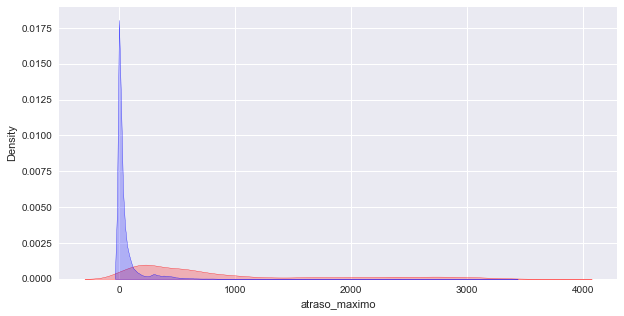

In [112]:
plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_Demanda_Judicial']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_Demanda_Judicial']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

In [113]:
df_cliente.loc[(df_cliente.bandera_condonado == 'SI') ,'Micro_60']='MALO'

In [114]:
pd.crosstab(df_cliente['bandera_condonado'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
bandera_condonado,,,
NO,269551,152435,421986
SI,0,4522,4522
Total,269551,156957,426508


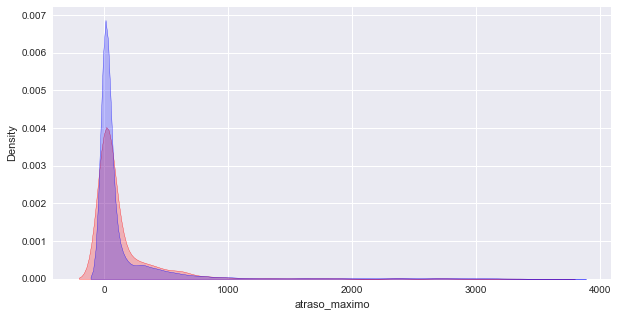

In [115]:
plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_condonado']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_condonado']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

In [116]:
df_cliente.loc[(df_cliente.bandera_castigado == 'SI') ,'Micro_60']='MALO'

In [117]:
pd.crosstab(df_cliente['bandera_castigado'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
bandera_castigado,,,
NO,269393,126913,396306
SI,0,30202,30202
Total,269393,157115,426508


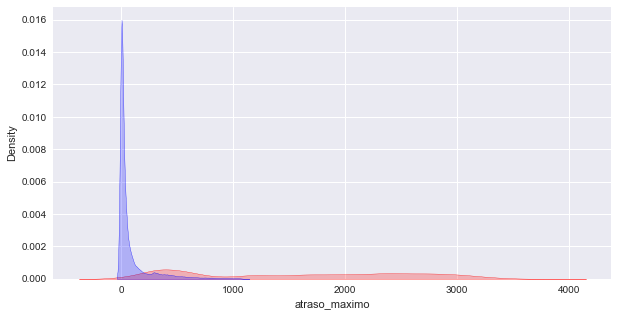

In [118]:

fig, plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_castigado']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_castigado']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,1000)
plt.show()

In [119]:
df_cliente.loc[(df_cliente.bandera_reestructurado == 'SI') ,'Micro_60']='MALO'

In [120]:
pd.crosstab(df_cliente['bandera_reestructurado'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
bandera_reestructurado,,,
NO,269054,148679,417733
SI,0,8775,8775
Total,269054,157454,426508


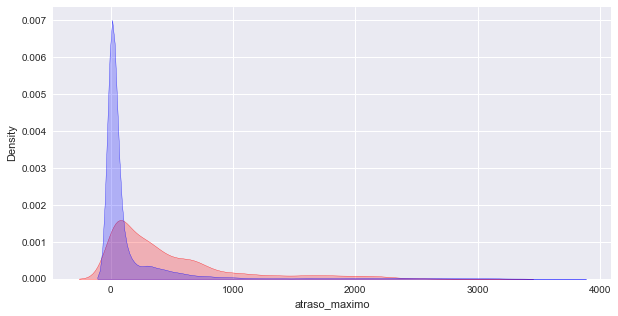

In [121]:
fig, plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_reestructurado']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['bandera_reestructurado']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

In [122]:
pd.crosstab(df_cliente['indicador_vencido'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
indicador_vencido,,,
NO,244417,49780,294197
SI,24637,107674,132311
Total,269054,157454,426508


In [123]:
df_cliente_vencido = df_cliente.loc[:, ['indicador_vencido', 'atraso_maximo', 'atraso_prom','Micro_60']]
df_cliente_vencido

,indicador_vencido,atraso_maximo,atraso_prom,Micro_60
207627,SI,2399.0,2040.0,MALO
223909,SI,379.0,42.0,MALO
253485,SI,169.0,33.0,MALO
356672,SI,321.0,44.0,MALO
103859,SI,202.0,37.0,MALO
...,...,...,...,...
281905,SI,104.0,60.0,MALO
490924,SI,100.0,22.0,MALO
220904,SI,111.0,18.0,MALO
127395,NO,93.0,27.0,MALO


In [124]:
df_cliente.loc[(df_cliente.indicador_vencido == 'SI') ,'Micro_60']='MALO'

In [125]:
pd.crosstab(df_cliente['indicador_vencido'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
indicador_vencido,,,
NO,244417,49780,294197
SI,0,132311,132311
Total,244417,182091,426508


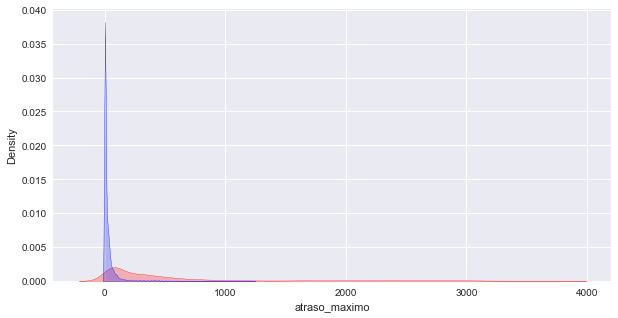

In [126]:
fig, plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['indicador_vencido']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['indicador_vencido']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

In [127]:
#df_cliente.loc[(df_cliente.analisis_riesgo == 'SI') ,'Micro_60']='MALO'

In [128]:
pd.crosstab(df_cliente['analisis_riesgo'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
analisis_riesgo,,,
NO,241776,179480,421256
SI,2641,2611,5252
Total,244417,182091,426508


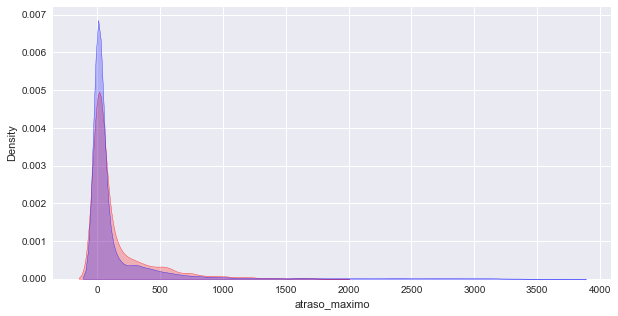

In [129]:
fig, plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['analisis_riesgo']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['analisis_riesgo']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

In [130]:
#df_cliente.loc[(df_cliente.cartera_heredada == 'SI') ,'Micro_60']='MALO'

In [131]:
pd.crosstab(df_cliente['cartera_heredada'],df_cliente['Micro_60'],margins=True, margins_name="Total")

Micro_60,BUENO,MALO,Total
cartera_heredada,,,
NO,147555,76851,224406
SI,96862,105240,202102
Total,244417,182091,426508


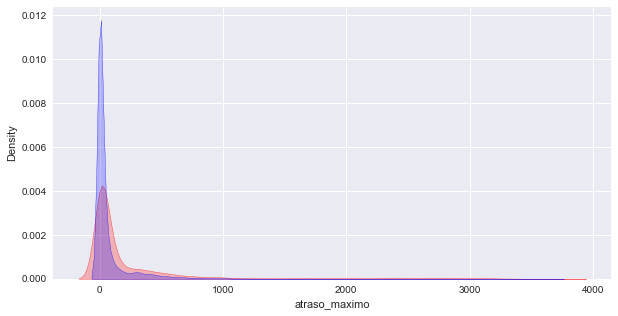

In [132]:
fig, plt.subplots(figsize=(10, 5))
sns.kdeplot(df_cliente.loc[(df_cliente['cartera_heredada']=='SI'),'atraso_maximo'], color='r', shade=True)
sns.kdeplot(df_cliente.loc[(df_cliente['cartera_heredada']=='NO'),'atraso_maximo'], color='b', shade=True)
#plt.xlim(0,105)
plt.show()

## Variable Objetivo  <a name="Target"></a>

<div class ="alert alert-info">
<b> Variable Objetivo </b>

In [133]:
#df_cliente.astype(str).groupby('Micro_60', sort=True)['Micro_60'].count()

In [134]:
df_cliente['Micro_60'].describe() # Indicios de Problemas de Balanceo de Datos, definicion muy generosa de buen cliente

count     426508
unique         2
top        BUENO
freq      244417
Name: Micro_60, dtype: object

In [135]:
r = df_cliente.Micro_60.count()
print(r)

426508


In [136]:
target = pd.DataFrame(df_cliente.groupby('Micro_60').size())
target

,0
Micro_60,
BUENO,244417
MALO,182091


In [137]:
target.columns = ['Total']
target['Dist. %'] = target.Total*100/r

In [138]:
target

,Total,Dist. %
Micro_60,,
BUENO,244417,57.306545
MALO,182091,42.693455


In [139]:
total_len = len(df_cliente['Micro_60'])
porcentaje= (df_cliente['Micro_60'].value_counts()/total_len)*100
porcentaje

BUENO    57.306545
MALO     42.693455
Name: Micro_60, dtype: float64

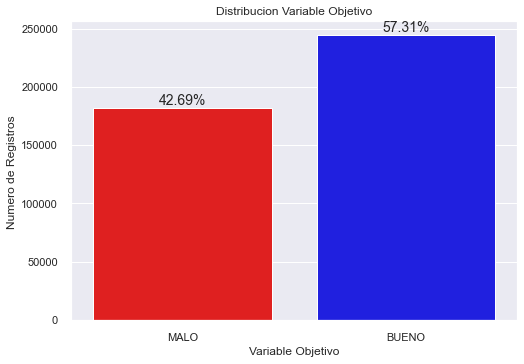

In [140]:
colours = ["red","blue"]
sns.set()
sns.countplot(df_cliente.Micro_60, palette = colours ).set_title('Distribucion Variable Objetivo')
ax = plt.gca()
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2.,
            height + 2,
            '{:.2f}%'.format(100*(height/total_len)),
            fontsize=14, ha='center', va='bottom')
sns.set(font_scale=2)
sns.set(rc={'figure.figsize':(3,3)})
ax.set_xlabel("Variable Objetivo")
ax.set_ylabel("Numero de Registros ")
plt.show()

In [141]:
dummy_bm = pd.get_dummies(df_cliente['Micro_60'])
print(dummy_bm)

        BUENO  MALO
207627      0     1
223909      0     1
253485      0     1
356672      0     1
103859      0     1
...       ...   ...
281905      0     1
490924      0     1
220904      0     1
127395      0     1
19152       0     1

[426508 rows x 2 columns]


In [142]:
df_cliente = pd.merge(
    left=df_cliente,
    right=dummy_bm,
    left_index=True,
    right_index=True)

In [143]:
df_cliente.head(2)

,op_operacion,nro_tramite,nro_operacion,ente,cedula,des_op_sector_bnf,fecha_originacion,cod_forma_pago,des_forma_pago,monto_aprobado,cod_estado_operacion,des_estado_operacion,cod_destino_final,cod_sucursal,cod_oficina,cod_zonal,des_zonal,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,cod_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cod_provincia_ubi_inv,cod_canton_ubi_inv,cod_ciudad_ubi_inv,cod_parroquia_ubi_inv,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia_categ,ca_val_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,ente.1,cedula_ruc,p_pasaporte,cod_nacionalidad,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,cod_actividad,cod_sector_economico,cod_provincia_nacimiento,cod_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,cod_provincia_domicilio,cod_canton_domicilio,cod_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,cod_provincia_empleo,cod_canton_empleo,cod_parroquia_empleo,cod_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_crea_cliente,Ciclo,bandera_Demanda_Judicial,anio,mes,AnioMes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,BUENO,MALO
207627,428707,388574,214671815708,10,912460110,HABILIDADES ESPECIALES,2008-12-09,ME,MENSUAL,2000.0,4,CASTIGADO,104080,21,21,19,ZONAL GUAYAQUIL,2399,0.0,1.0,0.0,24,0,24,24.0,24,2399.0,2040.0,3567,897,SI,SI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,200.0,150.0,500.0,0.0,9.0,906.0,90650.0,99.0,301.0,D,0.0,GARANTIA PERSONAL,0.0,VIVE CON FAMILIARES,0.0,2000.0,E,SI,NO,NO,SI,SI,NO,NaN,NaN,+121,+120,MALO,10.0,912460110.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,S,SECUNDARIA,N,EST,S03999999,132.0,9.0,906.0,I,INDEPENDIENTE,9.0,906.0,50.0,U,SECTOR URBANO,F,VIVE CON FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO PROPIO,0.0,2008-09-22,1,SI,2008-12-09,2008-12-09,2008-12-01,55,14.0,14,38.0,0,1
223909,3833969,2203316,190621659,1550654,916923345,COMERCIO,2017-12-19,ME,MENSUAL,5000.0,2,VENCIDO,613017,19,19,19,ZONAL GUAYAQUIL,379,0.0,208.0,0.0,1,23,24,24.0,1,379.0,42.0,5634,5634,SI,SI,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,1.0,5610.0,4571.0,25590.0,2515.0,9.0,901.0,90150.0,56.0,NaN,A1,NaN,GARANTIA PERSONAL,0.0,VIVE CON FAMILIARES,2760.0,208.0,E,NO,NO,NO,NO,SI,NO,NaN,NaN,+121,30-45,MALO,1550654.0,916923345.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,P,PRIMARIA,S,0099,G471101,132.0,24.0,2401.0,I,INDEPENDIENTE,9.0,901.0,56.0,U,SECTOR URBANO,F,VIVE CON FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO PROPIO,2760.0,2011-02-21,1,NO,2017-12-19,2017-12-19,2017-12-01,44,10.0,11,9.0,0,1


# Save # 2 

In [144]:
df_cliente.to_csv('base_scoring_2.csv', sep ="~", index = None, header = True)

In [145]:
#df_cliente = pd.read_csv('base_scoring_2.csv', sep = "~")
#df_cliente.head(2)

# VENTANA DE TIEMPO <a name="Ventana"></a>
<div class ="alert alert-info">
<b> Tasa de Morosidad</b>

In [146]:
df_cliente['anio'] = pd.DatetimeIndex(df_cliente['fecha_originacion']).year
df_cliente['mes'] = pd.DatetimeIndex(df_cliente['fecha_originacion']).month
df_cliente['anio_mes'] =  df_cliente['anio'].map(str) + '_' + df_cliente['mes'].map(str)

In [147]:
df_cliente['AnioMes'] = pd.to_datetime(df_cliente['fecha_originacion']).apply(lambda x: '{year}-{month}'.format(year=x.year, month=x.month))
df_cliente['AnioMes'] = pd.to_datetime(df_cliente['AnioMes'], format="%Y-%m",  errors='coerce')

In [148]:
df_cliente_date = df_cliente.groupby(['AnioMes'], sort=True)['BUENO', 'MALO'].sum()
df_cliente_date['TOTAL_MES'] = df_cliente_date.apply(np.sum, axis=1)
df_cliente_date['TASA_MOROSIDAD'] = df_cliente_date['MALO']/df_cliente_date['TOTAL_MES']*100
df_cliente_date.head(10)

,BUENO,MALO,TOTAL_MES,TASA_MOROSIDAD
AnioMes,,,,
2006-10-01,0.0,49.0,49.0,100.0
2006-11-01,0.0,103.0,103.0,100.0
2006-12-01,0.0,28.0,28.0,100.0
2007-01-01,0.0,25.0,25.0,100.0
2007-02-01,0.0,18.0,18.0,100.0
2007-03-01,0.0,26.0,26.0,100.0
2007-04-01,0.0,19.0,19.0,100.0
2007-05-01,0.0,4.0,4.0,100.0
2007-06-01,0.0,19.0,19.0,100.0


In [149]:
#df_cliente_date.drop(['TOTAL_MES']'nombre'
#df_cliente_date

## Cartera Total Micro <a name="CarteraTotalMicro"></a>
<div class ="alert alert-info">
<b> CARTERA TOTAL MICRO </b>

In [150]:
df_cliente_date.index.year, 
df_cliente_date.index.month

Int64Index([10, 11, 12,  1,  2,  3,  4,  5,  6,  7,
            ...
             3,  4,  5,  6,  7,  8,  9, 10, 11, 12],
           dtype='int64', name='AnioMes', length=171)

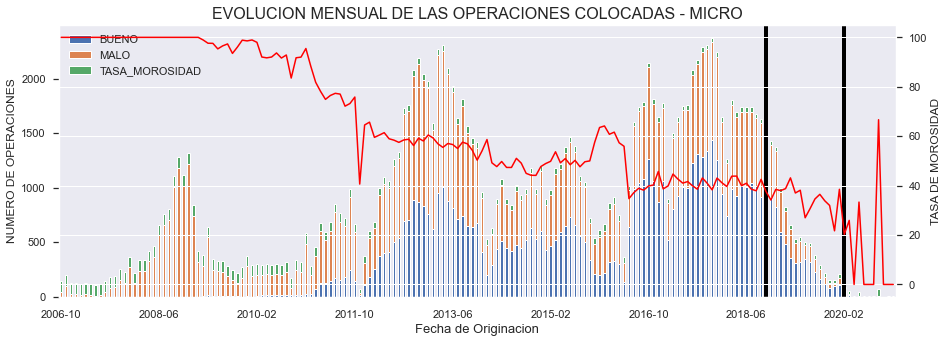

In [155]:
#import matplotlib.patches as mpatches
ax = df_cliente_date.plot.bar(x= 'TOTAL_MES', use_index=False, stacked=True,figsize=(15,5))
df_cliente_date.plot(y='TASA_MOROSIDAD', ax=ax, color= 'red', use_index=False, secondary_y=True, mark_right=True,legend=False)
ax.right_ax.set_ylabel('TASA DE MOROSIDAD',fontsize=12)

locs, labels = plt.xticks(fontsize=12)
N = 20
plt.xticks(locs[::N], df_cliente_date.index[::N].strftime('%Y-%m'))
fig.autofmt_xdate()

ax.axvline(df_cliente_date.index.searchsorted('2018-10-01'), color="black", linestyle="-", lw=4)
ax.axvline(df_cliente_date.index.searchsorted('2020-02-01'), color="black", linestyle="-", lw=4)

ax.set_ylabel('NUMERO DE OPERACIONES', fontsize=12)
ax.set_xlabel('Fecha de Originacion', fontsize=13)
ax.set_title('EVOLUCION MENSUAL DE LAS OPERACIONES COLOCADAS - MICRO', fontsize=16) 
ax.legend()
plt.show()

## Cartera Madura Ciclo 1 <a name="CarteraMaduraMicroCiclo1"></a>
<div class ="alert alert-info">
<b> CARTERA MADURA MICRO CICLO 1</b>

In [156]:
#df_cartera_madura = df_cliente.loc[(df_cliente.porcentaje_cancelacion_saldo >= 0.5) ,:]
df_cartera_madura_1 = df_cliente.loc[(df_cliente.porcentaje_cancelacion_saldo >= 0.5) & (df_cliente.Ciclo == 1),:]
#df_cliente = df_cliente.loc[(df_cliente.porcentaje_cancelacion_saldo >= 0.5),:]
df_cartera_madura_1.shape

(141690, 121)

In [157]:
df_cartera_madura_1 = df_cartera_madura_1.groupby(['AnioMes'], sort=True)['BUENO','MALO'].sum()
df_cartera_madura_1['TOTAL_MES'] = df_cartera_madura_1.apply(np.sum, axis=1)
df_cartera_madura_1['TASA_MOROSIDAD'] = df_cartera_madura_1['MALO']/df_cartera_madura_1['TOTAL_MES']*100
#df_cartera_madura_bm_1

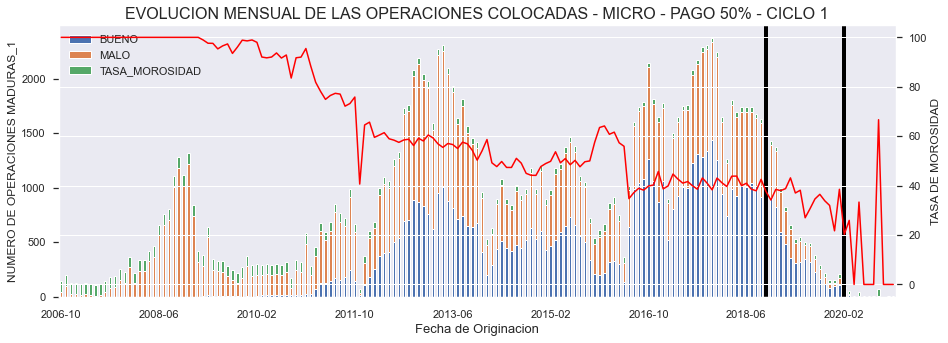

In [158]:
df_cliente_date = df_cartera_madura_1
ax = df_cliente_date.plot.bar(x= 'TOTAL_MES', use_index=False, stacked=True,figsize=(15,5))
df_cliente_date.plot(y='TASA_MOROSIDAD', color = 'red' , ax=ax,  use_index=False, secondary_y=True, mark_right=True,legend=False)
ax.right_ax.set_ylabel('TASA DE MOROSIDAD',fontsize=12)

locs, labels = plt.xticks(fontsize=12)
N = 20
plt.xticks(locs[::N], df_cliente_date.index[::N].strftime('%Y-%m'))
fig.autofmt_xdate()

ax.axvline(df_cliente_date.index.searchsorted('2018-10-01'), color="black", linestyle="-", lw=4)
ax.axvline(df_cliente_date.index.searchsorted('2020-02-01'), color="black", linestyle="-", lw=4)

ax.set_ylabel('NUMERO DE OPERACIONES MADURAS_1', fontsize=12)
ax.set_xlabel('Fecha de Originacion', fontsize=13)
ax.set_title('EVOLUCION MENSUAL DE LAS OPERACIONES COLOCADAS - MICRO - PAGO 50% - CICLO 1', fontsize=16) 
ax.legend()
plt.show()

## Cartera Madura Micro - % Saldo Cancelado <a name="CarteraMaduraMicro"></a>
<div class ="alert alert-info">
<b> CARTERA MADURA MICRO </b>

In [159]:
#df_cliente['porcentaje_cancelacion'].sort_values(), df_cliente['porcentaje_cancelacion_saldo'].sort_values()
df_cliente['porcentaje_cancelacion'].describe(),df_cliente['porcentaje_cancelacion_saldo'].describe()

(count    426508.000000
 mean          0.410775
 std           0.491975
 min           0.000000
 25%           0.000000
 50%           0.000000
 75%           1.000000
 max           1.000000
 Name: porcentaje_cancelacion, dtype: float64,
 count    426508.000000
 mean          0.452885
 std           0.497776
 min           0.000000
 25%           0.000000
 50%           0.000000
 75%           1.000000
 max           1.000000
 Name: porcentaje_cancelacion_saldo, dtype: float64)

In [160]:
#periodos_plazo, plazo_dias, plazo_meses, rango_plazos_meses 
df_cliente[['periodos_plazo','plazo_meses']].describe()

,periodos_plazo,plazo_meses
count,426508.000000,426506.000000
mean,19.615459,41.070426
std,18.416905,21.680751
min,1.000000,1.000000
25%,5.000000,24.000000
50%,12.000000,36.000000
75%,36.000000,60.000000
max,180.000000,720.000000


In [161]:
#df_cliente.astype(str).groupby('plazo_meses', sort=True)['plazo_meses'].count()
#sns.histplot(df_cliente[['plazo_meses']])

In [162]:
df_cartera_madura = df_cliente.loc[(df_cliente.porcentaje_cancelacion_saldo >= 0.5) ,:]
#df_cliente = df_cliente.loc[(df_cliente.porcentaje_cancelacion >= 0.5) & (df_cliente.Nro_op == 1),:]
#df_cliente = df_cliente.loc[(df_cliente.porcentaje_cancelacion_saldo >= 0.5),:]
df_cartera_madura.shape

(193159, 121)

In [163]:
df_cartera_madura = df_cartera_madura.groupby(['AnioMes'], sort=True)['BUENO','MALO'].sum()
df_cartera_madura['TOTAL_MES'] = df_cartera_madura.apply(np.sum, axis=1)
df_cartera_madura['TASA_MOROSIDAD'] = df_cartera_madura['MALO']/df_cartera_madura['TOTAL_MES']*100
#df_cartera_madura.head(3)

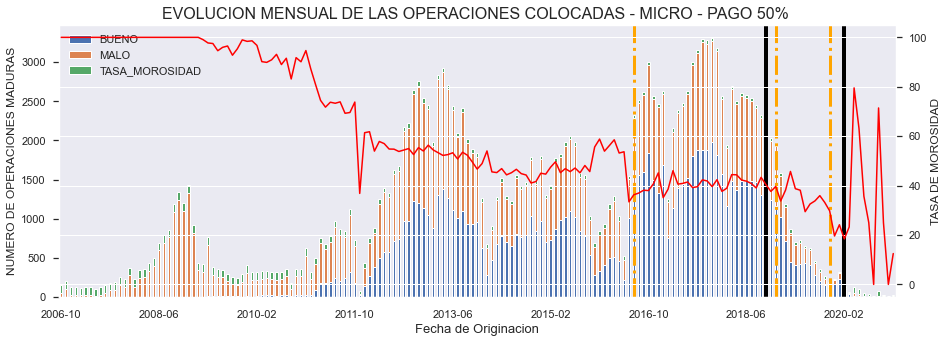

In [164]:
df_cliente_date = df_cartera_madura
ax = df_cliente_date.plot.bar(x= 'TOTAL_MES', use_index=False, stacked=True,figsize=(15,5))
df_cliente_date.plot(y='TASA_MOROSIDAD', color = 'red' , ax=ax,  use_index=False, secondary_y=True, mark_right=True,legend=False)
ax.right_ax.set_ylabel('TASA DE MOROSIDAD',fontsize=12)

locs, labels = plt.xticks(fontsize=12)
N = 20
plt.xticks(locs[::N], df_cliente_date.index[::N].strftime('%Y-%m'))
fig.autofmt_xdate()

ax.axvline(df_cliente_date.index.searchsorted('2018-10-01'), color="black", linestyle="-", lw=4)
ax.axvline(df_cliente_date.index.searchsorted('2020-02-01'), color="black", linestyle="-", lw=4)

ax.axvline(df_cliente_date.index.searchsorted('2016-07-01'), color="orange", linestyle="-.", lw=3)
ax.axvline(df_cliente_date.index.searchsorted('2018-12-01'), color="orange", linestyle="-.", lw=3)
ax.axvline(df_cliente_date.index.searchsorted('2019-11-01'), color="orange", linestyle="-.", lw=3)

ax.set_ylabel('NUMERO DE OPERACIONES MADURAS', fontsize=12)
ax.set_xlabel('Fecha de Originacion', fontsize=13)
ax.set_title('EVOLUCION MENSUAL DE LAS OPERACIONES COLOCADAS - MICRO - PAGO 50% ', fontsize=16) 
ax.legend()
plt.show()

In [165]:
df_cliente.head(1)

,op_operacion,nro_tramite,nro_operacion,ente,cedula,des_op_sector_bnf,fecha_originacion,cod_forma_pago,des_forma_pago,monto_aprobado,cod_estado_operacion,des_estado_operacion,cod_destino_final,cod_sucursal,cod_oficina,cod_zonal,des_zonal,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,cod_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cod_provincia_ubi_inv,cod_canton_ubi_inv,cod_ciudad_ubi_inv,cod_parroquia_ubi_inv,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia_categ,ca_val_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,ente.1,cedula_ruc,p_pasaporte,cod_nacionalidad,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,cod_actividad,cod_sector_economico,cod_provincia_nacimiento,cod_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,cod_provincia_domicilio,cod_canton_domicilio,cod_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,cod_provincia_empleo,cod_canton_empleo,cod_parroquia_empleo,cod_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_crea_cliente,Ciclo,bandera_Demanda_Judicial,anio,mes,AnioMes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,BUENO,MALO,anio_mes
207627,428707,388574,214671815708,10,912460110,HABILIDADES ESPECIALES,2008-12-09,ME,MENSUAL,2000.0,4,CASTIGADO,104080,21,21,19,ZONAL GUAYAQUIL,2399,0.0,1.0,0.0,24,0,24,24.0,24,2399.0,2040.0,3567,897,SI,SI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,200.0,150.0,500.0,0.0,9.0,906.0,90650.0,99.0,301.0,D,0.0,GARANTIA PERSONAL,0.0,VIVE CON FAMILIARES,0.0,2000.0,E,SI,NO,NO,SI,SI,NO,NaN,NaN,+121,+120,MALO,10.0,912460110.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,S,SECUNDARIA,N,EST,S03999999,132.0,9.0,906.0,I,INDEPENDIENTE,9.0,906.0,50.0,U,SECTOR URBANO,F,VIVE CON FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO PROPIO,0.0,2008-09-22,1,SI,2008,12,2008-12-01,55,14.0,14,38.0,0,1,2008_12


In [166]:
df_cliente.shape

(426508, 121)

In [167]:
df_cliente.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426508 entries, 207627 to 19152
Columns: 121 entries, op_operacion to anio_mes
dtypes: category(2), datetime64[ns](3), float64(54), int64(22), object(38), uint8(2)
memory usage: 401.7+ MB


# Save # 3 

In [168]:
df_cliente.replace('\s+', '_',regex=True,inplace=True)

In [169]:
df_cliente.to_csv('base_scoring_3.csv', sep ="~", index = None, header = True)

In [170]:
df_cliente = pd.read_csv('base_scoring_3.csv', sep = "~")
df_cliente.head(2)

,op_operacion,nro_tramite,nro_operacion,ente,cedula,des_op_sector_bnf,fecha_originacion,cod_forma_pago,des_forma_pago,monto_aprobado,cod_estado_operacion,des_estado_operacion,cod_destino_final,cod_sucursal,cod_oficina,cod_zonal,des_zonal,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,cod_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cod_provincia_ubi_inv,cod_canton_ubi_inv,cod_ciudad_ubi_inv,cod_parroquia_ubi_inv,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia_categ,ca_val_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,ente.1,cedula_ruc,p_pasaporte,cod_nacionalidad,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,cod_actividad,cod_sector_economico,cod_provincia_nacimiento,cod_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,cod_provincia_domicilio,cod_canton_domicilio,cod_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,cod_provincia_empleo,cod_canton_empleo,cod_parroquia_empleo,cod_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_crea_cliente,Ciclo,bandera_Demanda_Judicial,anio,mes,AnioMes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,BUENO,MALO,anio_mes
0,428707,388574,214671815708,10,912460110,HABILIDADES_ESPECIALES,2008-12-09,ME,MENSUAL,2000.0,4,CASTIGADO,104080,21,21,19,ZONAL_GUAYAQUIL,2399,0.0,1.0,0.0,24,0,24,24.0,24,2399.0,2040.0,3567,897,SI,SI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,200.0,150.0,500.0,0.0,9.0,906.0,90650.0,99.0,301.0,D,0.0,GARANTIA_PERSONAL,0.0,VIVE_CON_FAMILIARES,0.0,2000.0,E,SI,NO,NO,SI,SI,NO,NaN,NaN,121,+120,MALO,10.0,912460110.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,S,SECUNDARIA,N,EST,S03999999,132.0,9.0,906.0,I,INDEPENDIENTE,9.0,906.0,50.0,U,SECTOR_URBANO,F,VIVE_CON_FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO_PROPIO,0.0,2008-09-22,1,SI,2008,12,2008-12-01,55,14.0,14,38.0,0,1,2008_12
1,3833969,2203316,190621659,1550654,916923345,COMERCIO,2017-12-19,ME,MENSUAL,5000.0,2,VENCIDO,613017,19,19,19,ZONAL_GUAYAQUIL,379,0.0,208.0,0.0,1,23,24,24.0,1,379.0,42.0,5634,5634,SI,SI,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,1.0,5610.0,4571.0,25590.0,2515.0,9.0,901.0,90150.0,56.0,NaN,A1,NaN,GARANTIA_PERSONAL,0.0,VIVE_CON_FAMILIARES,2760.0,208.0,E,NO,NO,NO,NO,SI,NO,NaN,NaN,121,30-45,MALO,1550654.0,916923345.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,P,PRIMARIA,S,0099,G471101,132.0,24.0,2401.0,I,INDEPENDIENTE,9.0,901.0,56.0,U,SECTOR_URBANO,F,VIVE_CON_FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO_PROPIO,2760.0,2011-02-21,1,NO,2017,12,2017-12-01,44,10.0,11,9.0,0,1,2017_12


In [171]:
df_cliente.shape

(426508, 121)

# PREPARACION DE DATOS <a name="Hipotesis"></a>

In [172]:
print(list(df_cliente.columns))

['op_operacion', 'nro_tramite', 'nro_operacion', 'ente', 'cedula', 'des_op_sector_bnf', 'fecha_originacion', 'cod_forma_pago', 'des_forma_pago', 'monto_aprobado', 'cod_estado_operacion', 'des_estado_operacion', 'cod_destino_final', 'cod_sucursal', 'cod_oficina', 'cod_zonal', 'des_zonal', 'dias_ven_cap', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'atraso_maximo', 'atraso_prom', 'cod_oficial', 'cod_oficial_otorg', 'cliente_nuevo', 'cliente_bancarizado', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_demanda_judicial', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 

In [173]:
#df_cliente.drop(['atraso_prom', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo','anio', 'mes', 'BUENO', 'MALO'], axis = 1 , inplace = True)
#df_cliente.drop(['atraso_prom', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo','anio', 'mes','AnioMes'], axis = 1 , inplace = True)

## Tratamiento Numerico

In [174]:
# En este objeto colocamos todos los tipos de objetos numéricos
numericas = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Creamos un Dataframe con todas las variables de tipo numérico
df_numerico = df_cliente.select_dtypes(include=numericas)  

# Creamos un Dataframe con todas las variables de tipo string
df_categorico= df_cliente.select_dtypes(include = ['O'])

In [175]:
# Igual Numero de Variables Numericas y de Variables Categoricas 
print('Número de variables numéricas',df_numerico.shape[1])
print('\nNúmero de variables Categóricas',df_categorico.shape[1])

Número de variables numéricas 78

Número de variables Categóricas 43


In [176]:
print(list(df_numerico.columns))

['op_operacion', 'nro_tramite', 'nro_operacion', 'ente', 'cedula', 'monto_aprobado', 'cod_estado_operacion', 'cod_destino_final', 'cod_sucursal', 'cod_oficina', 'cod_zonal', 'dias_ven_cap', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'atraso_maximo', 'atraso_prom', 'cod_oficial', 'cod_oficial_otorg', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_demanda_judicial', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'cod_provincia_ubi_inv', 'cod_canton_ubi_inv', 'cod_ciudad_ubi_inv', 'cod_parroquia_ubi_inv', 'score_buro', 'cuota_estimada_buro', 'ca_val_garantia', 'vent

In [177]:
#df_numerico['acreedores_anteriores_36_meses'].describe()


In [178]:
df_numerico.drop(['sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados','saldo_total_deuda_actual_ifis','saldo_demanda_judicial', 'saldo_cartera_castigada','acreedores_anteriores_36_meses','mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'riesgo_consolidado_directo','ca_val_garantia','dias_ven_cap','atraso_maximo','num_cargas', 'valor_vivienda','num_cuota_ven'], axis = 1, inplace =True)

In [179]:
df_cliente.to_csv('base_scoring_3.csv', sep ="~", index = None, header = True)

In [180]:
#df_numerico.drop(['dias_ven_cap','atraso_maximo','num_cargas', 'valor_vivienda','num_cuota_ven'], axis = 1, inplace =True)

In [181]:
#df_cliente = pd.read_csv('base_scoring_3.csv', sep = "~")
#df_cliente.head(4)

### Contruccion de Ratios financieros 

In [182]:
#df_numerico.drop(['act_pas', 'total_pasivos_2'],axis = 1, inplace = True)

In [183]:
def total_pasivos_2(row):
    if row['total_pasivos'] < 0:
        return (row['total_pasivos']* (-1))
    else:
        return row['total_pasivos']

df_cliente['total_pasivos_2'] = df_cliente.apply(total_pasivos_2, axis=1)

In [184]:
df_ratios = df_cliente.loc[:,['total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos','total_pasivos_2','ventas_netas_balances' ] ]
df_ratios = df_ratios.sort_values(by = 'total_pasivos', ascending=True,  na_position='last')
df_ratios.head(10)

,total_ingresos,total_gastos,total_activos,total_pasivos,total_pasivos_2,ventas_netas_balances
400391,8250.0,6888.0,95060.0,-22501.0,22501.0,7650.0
110566,24494.0,8031.0,25802.0,-21042.0,21042.0,7200.0
296369,21300.0,26741.0,171400.0,-18360.0,18360.0,7800.0
354523,17000.0,10713.0,120000.0,-13000.0,13000.0,8000.0
353389,10300.0,8306.0,133749.0,-10873.0,10873.0,8300.0
406396,12165.0,8740.0,218500.0,-10000.0,10000.0,8265.0
383106,10900.0,8234.0,30900.0,-9990.0,9990.0,10800.0
367290,8900.0,7797.0,62416.0,-8110.0,8110.0,7700.0
61582,9600.0,8401.0,37400.0,-6844.0,6844.0,8000.0
306478,8850.0,7384.0,119740.0,-5899.0,5899.0,7850.0


#### Activos / Pasivos

In [185]:
def act_pas(row):
    if row['total_pasivos_2'] == 0:
        return row['total_activos']
    elif row['total_pasivos_2'] > 0:
        return row['total_activos']/row['total_pasivos_2']
    else:
        return 0
    
df_cliente['act_pas'] = df_cliente.apply(act_pas, axis=1)

In [186]:
df_cliente['act_pas'].describe().T

count    4.265080e+05
mean     3.756929e+03
std      2.095476e+04
min      0.000000e+00
25%      4.720183e+00
50%      1.444807e+01
75%      1.181354e+02
max      6.029950e+06
Name: act_pas, dtype: float64

In [187]:
#df_cliente.insert(81,'act_pas_quintiles',object, allow_duplicates=False)
df_cliente['act_pas_quintiles']= pd.qcut(df_cliente['act_pas'], q = 4, labels = False)
pd.crosstab(df_cliente['act_pas_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
act_pas_quintiles,,
0,51088,55539
1,62727,43900
2,65115,41512
3,65487,41140


In [188]:
def act_pas_quintil(row):
    if row['act_pas'] <= 4.720183e+00:
        return '_472'
    elif (row['act_pas'] >  4.720183e+00) & (row['act_pas'] <= 1.444807e+01):
        return '_472_1444'
    elif (row['act_pas'] >  1.444807e+01) & (row['act_pas'] <= 1.181354e+02):
        return '_1444_11813'
    elif (row['act_pas'] >  1.181354e+02) :
        return '_11813'
    else:
        return '_472'

df_cliente['act_pas_quintil'] = df_cliente.apply(act_pas_quintil, axis=1)
pd.crosstab(df_cliente['act_pas_quintil'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
act_pas_quintil,,
_11813,65487,41140
_1444_11813,65115,41512
_472,51088,55539
_472_1444,62727,43900


#### ingresos / Gastos 

In [189]:
def ing_gas(row):
    if row['total_gastos'] == 0:
        return row['total_ingresos']
    elif row['total_gastos'] > 0:
        return row['total_ingresos']/row['total_gastos']
    else:
        return 0
    
df_cliente['ing_gas'] = df_cliente.apply(act_pas, axis=1)

In [190]:
df_cliente['ing_gas'].describe().T

count    4.265080e+05
mean     3.756929e+03
std      2.095476e+04
min      0.000000e+00
25%      4.720183e+00
50%      1.444807e+01
75%      1.181354e+02
max      6.029950e+06
Name: ing_gas, dtype: float64

In [191]:
def ing_gas_quintil(row):
    if row['ing_gas'] <= 1.444807e+01:
        return '_1448'
    elif (row['ing_gas'] > 1.444807e+01) :
        return '_1449'
    else:
        return '_1448'

df_cliente['ing_gas_quintil'] = df_cliente.apply(ing_gas_quintil, axis=1)
pd.crosstab(df_cliente['ing_gas_quintil'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
ing_gas_quintil,,
_1448,113815,99439
_1449,130602,82652


In [192]:
#df_cliente.insert(82,'ing_gas_quintiles',object, allow_duplicates=False)
df_cliente['ing_gas_quintiles']= pd.qcut(df_cliente['act_pas'], q = 4, labels = False)
pd.crosstab(df_cliente['ing_gas_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
ing_gas_quintiles,,
0,51088,55539
1,62727,43900
2,65115,41512
3,65487,41140


In [193]:
#df_ratios = df_cliente.loc[:,['total_ingresos', 'total_gastos', 'ing_gas', 'total_activos', 'total_pasivos','total_pasivos_2','act_pas','ventas_netas_balances' ] ]
#df_ratios = df_ratios.sort_values(by = 'total_pasivos_2', ascending=True,  na_position='first')
#df_ratios

#### Tamano Ventas

In [194]:
df_cliente['ventas_netas_balances'].describe(percentiles = [1/3, 2/3 , 3/3]).T

count    4.256050e+05
mean     1.272561e+04
std      2.454496e+06
min      0.000000e+00
33.3%    1.500000e+03
50%      2.500000e+03
66.7%    4.600000e+03
100%     1.600033e+09
max      1.600033e+09
Name: ventas_netas_balances, dtype: float64

In [195]:
#df_cliente.insert(42,'ventas_quintiles',object, allow_duplicates=False)
df_cliente['ventas_quintiles']= pd.qcut(df_cliente['ventas_netas_balances'], q = 3, labels = False)
pd.crosstab(df_cliente['ventas_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
ventas_quintiles,,
0.0,82954,69684
1.0,70663,60575
2.0,90752,50977


In [196]:
def tamano_ventas(row):
    if row['ventas_netas_balances'] <= 1161:
        return '_1161'
    elif (row['ventas_netas_balances'] > 1161) &  (row['ventas_netas_balances'] <= 2.500000e+03)   :
        return '_1161_2500'
    elif (row['ventas_netas_balances'] > 2.500000e+03) &  (row['ventas_netas_balances'] <= 4600)   :
        return '_2500_46000'
    elif (row['ventas_netas_balances'] > 4.600000e+03) :
        return '_4600'
    else:
        return '_1161'

df_cliente['tamano_ventas'] = df_cliente.apply(tamano_ventas, axis=1)
pd.crosstab(df_cliente['tamano_ventas'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
tamano_ventas,,
_1161,57189,50108
_1161_2500,59937,50577
_2500_46000,36539,30429
_4600,90752,50977


In [197]:
df_cliente.head(2)

,op_operacion,nro_tramite,nro_operacion,ente,cedula,des_op_sector_bnf,fecha_originacion,cod_forma_pago,des_forma_pago,monto_aprobado,cod_estado_operacion,des_estado_operacion,cod_destino_final,cod_sucursal,cod_oficina,cod_zonal,des_zonal,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,cod_oficial,cod_oficial_otorg,cliente_nuevo,cliente_bancarizado,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cod_provincia_ubi_inv,cod_canton_ubi_inv,cod_ciudad_ubi_inv,cod_parroquia_ubi_inv,score_buro,calificacion_score,cuota_estimada_buro,ca_tip_garantia_categ,ca_val_garantia,tipo_vivienda,ventas_netas_balances,riesgo_consolidado_directo,peor_calificacion,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,analisis_riesgo,codigo_analista_riesgo,cod_oficina_anlista_riesgo,Rango_Dias_Mora_max,Rango_Dias_Mora_prom,Micro_60,ente.1,cedula_ruc,p_pasaporte,cod_nacionalidad,cod_sexo,des_sexo,num_cargas,num_cargas_estudiando,cod_estado_civil,des_estado_civil,cod_nivel_instruccion,des_nivel_instruccion,es_jefe_hogar,cod_profesion,cod_actividad,cod_sector_economico,cod_provincia_nacimiento,cod_canton_nacimiento,cod_origen_ingresos,des_origen_ingresos,cod_provincia_domicilio,cod_canton_domicilio,cod_parroquia_domicilio,cod_sector,des_sector,cod_tipo_vivienda,tipo_vivienda.1,valor_vivienda,cod_provincia_empleo,cod_canton_empleo,cod_parroquia_empleo,cod_sector_empleo,cod_situacion_laboral,des_situacion_laboral,sueldo,fecha_crea_cliente,Ciclo,bandera_Demanda_Judicial,anio,mes,AnioMes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,BUENO,MALO,anio_mes,total_pasivos_2,act_pas,act_pas_quintiles,act_pas_quintil,ing_gas,ing_gas_quintil,ing_gas_quintiles,ventas_quintiles,tamano_ventas
0,428707,388574,214671815708,10,912460110,HABILIDADES_ESPECIALES,2008-12-09,ME,MENSUAL,2000.0,4,CASTIGADO,104080,21,21,19,ZONAL_GUAYAQUIL,2399,0.0,1.0,0.0,24,0,24,24.0,24,2399.0,2040.0,3567,897,SI,SI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,200.0,150.0,500.0,0.0,9.0,906.0,90650.0,99.0,301.0,D,0.0,GARANTIA_PERSONAL,0.0,VIVE_CON_FAMILIARES,0.0,2000.0,E,SI,NO,NO,SI,SI,NO,NaN,NaN,121,+120,MALO,10.0,912460110.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,S,SECUNDARIA,N,EST,S03999999,132.0,9.0,906.0,I,INDEPENDIENTE,9.0,906.0,50.0,U,SECTOR_URBANO,F,VIVE_CON_FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO_PROPIO,0.0,2008-09-22,1,SI,2008,12,2008-12-01,55,14.0,14,38.0,0,1,2008_12,0.0,500.00000,3,_11813,500.00000,_1449,3,0.0,_1161
1,3833969,2203316,190621659,1550654,916923345,COMERCIO,2017-12-19,ME,MENSUAL,5000.0,2,VENCIDO,613017,19,19,19,ZONAL_GUAYAQUIL,379,0.0,208.0,0.0,1,23,24,24.0,1,379.0,42.0,5634,5634,SI,SI,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,1.0,1.0,5610.0,4571.0,25590.0,2515.0,9.0,901.0,90150.0,56.0,NaN,A1,NaN,GARANTIA_PERSONAL,0.0,VIVE_CON_FAMILIARES,2760.0,208.0,E,NO,NO,NO,NO,SI,NO,NaN,NaN,121,30-45,MALO,1550654.0,916923345.0,NaN,ECU,F,FEMENINO,0.0,0.0,S,SOLTERO,P,PRIMARIA,S,0099,G471101,132.0,24.0,2401.0,I,INDEPENDIENTE,9.0,901.0,56.0,U,SECTOR_URBANO,F,VIVE_CON_FAMILIARES,NaN,NaN,NaN,NaN,NaN,11.0,NEGOCIO_PROPIO,2760.0,2011-02-21,1,NO,2017,12,2017-12-01,44,10.0,11,9.0,0,1,2017_12,2515.0,10.17495,1,_472_1444,10.17495,_1448,1,1.0,_2500_46000


In [198]:
#df_cliente['Micro_60_B'] = df_cliente['Micro_60'].map({'BUENO': 0, 'MALO': 1})

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10,4))
sns.histplot(data=df_cliente , x=df_cliente['ventas_netas_balances'], ax=ax[0])
ax[0].set_title("Histogram")
sns.boxplot(data=df, x=df_cliente['ventas_netas_balances'], ax=ax[1])
ax[1].set_title("Boxplot")

### Contar e  Imputar Nulos

In [ ]:
#   Se va a recorrer todas columnas y se contara los valores "?" de todas las variables
#   Y se guardara los nombres  de las variables con más de 95% de registros igual a "?"

features_null_delete = []                                                       # Se Cambio (*)

for col in df_numerico.columns:
    if df_numerico[col].isnull().sum() > 0: 
        print(col,', Hay ',df_numerico[col].isnull().sum(),',datos faltantes y que representan el ',np.round(df_numerico[col].isnull().mean()*100,2),'%_de los datos faltantes')
        if df_numerico[col].isnull().mean() > 0.95:
                features_null_delete.append(col)
            
features_null_delete  #variables a eliminar

In [ ]:
from sklearn.impute import SimpleImputer

df_numeric_imp = df_numerico
#df_numeric_imp = df_numeric_imp.drop(features_null_delete, axis = 1)
df_numeric_imp = df_numeric_imp.drop(features_null_delete)
imp_1 = SimpleImputer(missing_values= np.NAN, strategy= 'mean', fill_value=None, verbose=0, copy=True)
          
for i in df_numeric_imp.columns:
  df_numeric_imp.loc[:,(i)] = imp_1.fit_transform(df_numeric_imp.loc[:,(i)].values.reshape(-1,1))

print('\n')

# Nuevo Dataframe sin Missings o valores perdidos

df_numeric_imp.isnull().mean().sort_values(ascending = False)

### Analisis Descriptivo

In [ ]:
# 'porcentaje_cancelacion','porcentaje_cancelacion_saldo',
df_cliente[['Edad',  'antiguedad_reside_mes', 'antiguedad_lab', 'antiguedad_cli','div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses','dias_ven_cap']].plot(kind='box', layout=(1,8), figsize=(15,3))
df_cliente[['num_cuota_ven', 'num_cargas','num_cargas_estudiando' , 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'mayorplazovencidoactualtotal','mayorplazovencido6mesestotal','mayorplazovencidohistoricototal','Ciclo']].plot(kind='box', layout=(1,8), figsize=(25,4))
df_cliente[[ 'monto_aprobado', 'sld_tot_xven', 'sld_tot_ven','sld_tot_ndi','riesgo_consolidado_directo','saldo_total_deuda_actual_ifis','saldo_demanda_judicial', 'saldo_cartera_castigada','mayorvalorvencidoactualtotal','mayorvalorvencido6mesestotal']].plot(kind='box', layout=(1,10), figsize=(25,4))
#df_cliente[['div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses']].plot(kind='box', layout=(1,8), figsize=(20,4))
#plt.yticks(np.arange(0, 800000,50000)) 
plt.show() 

In [ ]:
df_cliente[['valor_vivienda']].plot(kind='box', layout=(1,4), figsize=(3,3))
df_cliente[['endeudamiento_promedio','cuota_estimada_buro']].plot(kind='box', layout=(1,4), figsize=(5,3))
df_cliente[['sueldo','total_ingresos', 'ventas_netas_balances', 'total_activos','ca_val_garantia', 'total_gastos', 'total_pasivos']].plot(kind='box', layout=(1,4), figsize=(25,5))

In [ ]:
#vector = ['monto_aprobado', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_demanda_judicial', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'cuota_estimada_buro', 'ca_val_garantia', 'ventas_netas_balances', 'riesgo_consolidado_directo', 'num_cargas_estudiando', 'sueldo', 'Ciclo', 'Edad', 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes']
fig, axs = plt.subplots(1,len(df_numerico.columns), figsize=(180,4))

for i,x in enumerate(df_numerico.columns):
    df_numerico[x].plot(kind='box',ax=axs[i])

plt.subplots_adjust(hspace=0.8, wspace=0.5)
plt.show()

In [ ]:
fig, axs = plt.subplots(1,len(df_numerico.columns), figsize=(180, 4))

for i,x in enumerate(df_numerico.columns):
    df_numerico[x].plot(kind='hist',ax=axs[i])

plt.subplots_adjust(hspace=0.8, wspace=0.5)
plt.show()

### Analisis de Densidad 

In [ ]:
df = df_cliente
def kdeplot(feature, hist, kde):
    plt.figure(figsize=(9, 4))
    plt.title("Plot for {}".format(feature))
    ax0 = sns.distplot(df[df['Micro_60'] == 'BUENO'][feature].dropna(), hist=hist, kde=kde, 
             color = 'darkblue',  label= 'BUENO',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
    ax1 = sns.distplot(df[df['Micro_60'] == 'MALO'][feature].dropna(), hist=hist, kde=kde, 
             color = 'orange',  label= 'MALO',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
#    plt.savefig('kde.png')

In [ ]:
kdeplot('Edad', hist = True, kde = True)

In [ ]:
kdeplot('monto_aprobado', hist = True, kde = True)

In [ ]:
kdeplot('cuota_estimada_buro', hist = True, kde = True)

In [ ]:
kdeplot('endeudamiento_promedio', hist = True, kde = True)

In [ ]:
kdeplot('ventas_netas_balances', hist = True, kde = True)

In [ ]:
kdeplot('act_pas', hist = True, kde = True)

In [ ]:
kdeplot('ing_gas', hist = True, kde = True)

In [ ]:
kdeplot('mayorplazovencidoactualtotal', hist = True, kde = True) 

In [ ]:
kdeplot('mayorvalorvencidoactualtotal', hist = True, kde = True) 

In [ ]:
kdeplot('mayorplazovencidohistoricototal', hist = True, kde = True)

In [ ]:
kdeplot('num_cargas_estudiando', hist = True, kde = True)

In [ ]:
kdeplot('sueldo', hist = True, kde = True)

In [ ]:
kdeplot('Ciclo', hist = True, kde = True)

In [ ]:
kdeplot('antiguedad_lab', hist = True, kde = True)

In [ ]:
kdeplot('antiguedad_cli', hist = True, kde = True)

In [ ]:
kdeplot('antiguedad_reside_mes', hist = True, kde = True)

In [ ]:
kdeplot('periodos_plazo', hist = True, kde = True)

In [ ]:
kdeplot( 'plazo_meses', hist = True, kde = True)

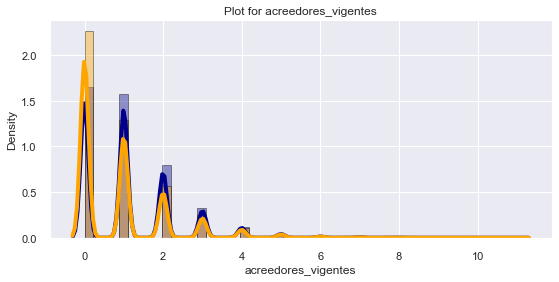

In [228]:
kdeplot('acreedores_vigentes', hist = True, kde = True)

### Categorizacion de Variables Numericas

In [322]:
df_cliente['Edad'].describe().T

count    426508.000000
mean         45.194416
std          14.208642
min           3.000000
25%          34.000000
50%          44.000000
75%          55.000000
max         121.000000
Name: Edad, dtype: float64

In [323]:
#df_cliente.insert(75,'edad_quintiles',object, allow_duplicates=False)
df_cliente['edad_quintiles']= pd.qcut(df_cliente['Edad'], q = 4, labels = False)
pd.crosstab(df_cliente['edad_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
edad_quintiles,,
0,66219,47257
1,61063,48573
2,56032,41995
3,61103,44266


In [324]:
def edad_B(row):
    if row['Edad'] <= 35:
        return '_35'
    elif (row['Edad'] >35) & (row['Edad'] <= 45):
        return '_35_45'
    elif (row['Edad'] >45) & (row['Edad'] <= 55):
        return '_45_55'
    elif (row['Edad'] >55) & (row['Edad'] <= 65):
        return '_55_65'
    elif (row['Edad'] > 65) :
        return '_65'
    else:
        return 0
    
df_cliente['edad_B'] = df_cliente.apply(edad_B, axis=1)
pd.crosstab(df_cliente['edad_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
edad_B,,
_35,72348,52079
_35_45,60573,48155
_45_55,50393,37591
_55_65,36740,26655
_65,24363,17611


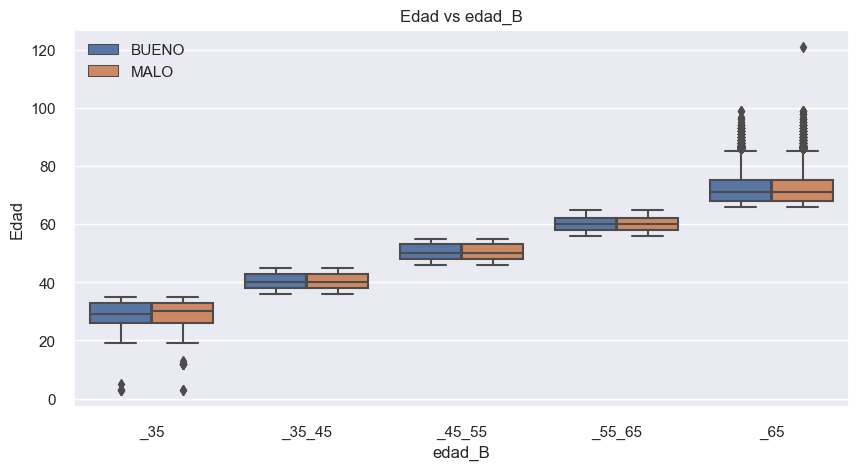

In [325]:
data= df_cliente
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)
sns.boxplot(x = "edad_B", y ="Edad", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO'],order = ['_35','_35_45','_45_55','_55_65','_65'])
plt.title('Edad vs edad_B')
plt.legend()
plt.show()  

In [326]:
df_cliente['monto_aprobado'].describe().T

count    426508.000000
mean       6887.004586
std        5439.297391
min           2.000000
25%        3000.000000
50%        5000.000000
75%       10000.000000
max      232393.000000
Name: monto_aprobado, dtype: float64

In [327]:
#df_cliente.insert(5,'monto_quintiles',object, allow_duplicates=False)
df_cliente['monto_quintiles']= pd.qcut(df_cliente['monto_aprobado'], q = 4, labels = False)
pd.crosstab(df_cliente['monto_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
monto_quintiles,,
0,63093,58696
1,65864,46014
2,65049,46755
3,50411,30626


In [328]:
def monto_B(row):
    if row['monto_aprobado'] <= 3000:
        return '_3000'
    elif (row['monto_aprobado'] > 3000) & (row['monto_aprobado'] <= 5000) :
        return '_3000_5000'
    elif (row['monto_aprobado'] > 5000) & (row['monto_aprobado'] <= 10000) :
        return '_5000_10000'
    elif (row['monto_aprobado'] > 10000) :
        return '_10000'
    else:
        return '_3000'
    
df_cliente['monto_B'] = df_cliente.apply(monto_B, axis=1)
pd.crosstab(df_cliente['monto_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
monto_B,,
_10000,50411,30626
_3000,63093,58696
_3000_5000,65864,46014
_5000_10000,65049,46755


In [329]:
df_cliente['sueldo'].describe().T

count    4.132720e+05
mean     3.566142e+03
std      1.525858e+06
min      0.000000e+00
25%      4.000000e+02
50%      8.000000e+02
75%      1.250000e+03
max      9.808874e+08
Name: sueldo, dtype: float64

In [330]:
#df_cliente.insert(79,'sueldo_quintiles',object, allow_duplicates=False)
df_cliente['sueldo_quintiles']= pd.qcut(df_cliente['sueldo'], q = 4, labels = False)
pd.crosstab(df_cliente['sueldo_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
sueldo_quintiles,,
0.0,55339,48318
1.0,77222,50774
2.0,49021,30218
3.0,58824,43556


In [331]:
def sueldo_B(row):
    if row['sueldo'] <= 400:
        return '_400'
    elif (row['sueldo'] > 400) & (row['sueldo'] <= 800) :
        return '_400_800'
    elif (row['sueldo'] > 800) & (row['sueldo'] <= 1250) :
        return '_800_1250'
    elif (row['sueldo'] > 1250)  :
        return '_1250'
    else:
        return '_400'
    
df_cliente['sueldo_B'] = df_cliente.apply(sueldo_B, axis=1)
pd.crosstab(df_cliente['sueldo_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
sueldo_B,,
_1250,58824,43556
_400,59350,57543
_400_800,77222,50774
_800_1250,49021,30218


In [332]:
df_cliente['antiguedad_lab'].describe().T # 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes'

count    419335.000000
mean          6.998858
std           3.433318
min           1.000000
25%           4.000000
50%           7.000000
75%          10.000000
max          13.000000
Name: antiguedad_lab, dtype: float64

In [333]:
#df_cliente.insert(79,'antiguedad_lab_quintiles',object, allow_duplicates=False)
df_cliente['antiguedad_lab_quintiles']= pd.qcut(df_cliente['antiguedad_lab'], q = 4, labels = False)
pd.crosstab(df_cliente['antiguedad_lab_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
antiguedad_lab_quintiles,,
0.0,81891,49482
1.0,51817,32511
2.0,72772,61490
3.0,36809,32563


In [334]:
def antlab_B(row):
    if row['antiguedad_lab'] <= 4:
        return '_4'
    elif (row['antiguedad_lab'] > 4) & (row['antiguedad_lab'] <= 8):
        return '_4_8'
    elif (row['antiguedad_lab'] > 8) & (row['antiguedad_lab'] <= 10):
        return '_8_10'
    elif (row['antiguedad_lab'] > 10) :
        return '_10'
    else:
        return '_4'
    
df_cliente['antlab_B'] = df_cliente.apply(antlab_B, axis=1)
pd.crosstab(df_cliente['antlab_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
antlab_B,,
_10,36809,32563
_4,83019,55527
_4_8,74736,51303
_8_10,49853,42698


In [335]:
df_cliente['antiguedad_cli'].describe().T # 'antiguedad_cli', 'antiguedad_reside_mes'

count    426508.000000
mean          8.421169
std           4.007378
min           1.000000
25%           4.000000
50%           9.000000
75%          13.000000
max          13.000000
Name: antiguedad_cli, dtype: float64

In [336]:

def anticli_B(row):
    if row['antiguedad_cli'] <= 4:
        return '_4'
    elif (row['antiguedad_cli'] > 4) & (row['antiguedad_cli'] <= 9):
        return '_4_9'
    elif (row['antiguedad_cli'] > 9) & (row['antiguedad_cli'] <= 13):
        return '_9_13'
    elif (row['antiguedad_cli'] > 13) :
        return '_13'
    else:
        return '_4'
    
df_cliente['antcli_B'] = df_cliente.apply(anticli_B, axis=1)
pd.crosstab(df_cliente['antcli_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
antcli_B,,
_4,68549,41404
_4_9,66515,46357
_9_13,109353,94330


In [337]:
df_cliente['antiguedad_reside_mes'].describe().T

count    407186.000000
mean         15.934367
std          12.584448
min           0.000000
25%           6.000000
50%          12.000000
75%          22.000000
max         654.000000
Name: antiguedad_reside_mes, dtype: float64

In [338]:
def antiresid_B(row):
    if row['antiguedad_reside_mes'] <= 12:
        return '_1_año'
    elif (row['antiguedad_reside_mes'] > 12) & (row['antiguedad_reside_mes'] <= 24):
        return '_1_2_años'
    elif (row['antiguedad_reside_mes'] > 24) :
        return '_2_años'
    else:
        return '_1_año'

df_cliente['antiresid_B'] = df_cliente.apply(antiresid_B, axis=1)
pd.crosstab(df_cliente['antiresid_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
antiresid_B,,
_1_2_años,65435,41686
_1_año,119927,106082
_2_años,59055,34323


In [339]:
df_cliente['periodos_plazo'].describe().T

count    426508.000000
mean         19.615459
std          18.416905
min           1.000000
25%           5.000000
50%          12.000000
75%          36.000000
max         180.000000
Name: periodos_plazo, dtype: float64

In [340]:
#df_cliente.insert(14,'periodos_plazo_quintiles',object, allow_duplicates=False)
df_cliente['periodos_plazo_quintiles']= pd.qcut(df_cliente['periodos_plazo'], q = 4, labels = False)
pd.crosstab(df_cliente['periodos_plazo_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
periodos_plazo_quintiles,,
0,80176,34520
1,74005,40509
2,56297,76700
3,33939,30362


In [341]:
def numperiodos_B(row):
    if row['periodos_plazo'] <= 5:
        return '_5'
    elif (row['periodos_plazo'] > 5) & (row['periodos_plazo'] <= 12):
        return '_6_12'
    elif (row['periodos_plazo'] > 12) & (row['periodos_plazo'] <= 35):
        return '_12_35'
#    elif (row['periodos_plazo'] > 24) & (row['periodos_plazo'] <= 36):
#        return '_24_36'
    elif (row['periodos_plazo'] > 35) :
        return '_35'
    else:
        return '_5'

df_cliente['numperiodos_B'] = df_cliente.apply(numperiodos_B, axis=1)
pd.crosstab(df_cliente['numperiodos_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
numperiodos_B,,
_12_35,37307,42871
_35,52929,64191
_5,80176,34520
_6_12,74005,40509


In [342]:
df_cliente['plazo_meses'].describe().T

count    426506.000000
mean         41.070426
std          21.680751
min           1.000000
25%          24.000000
50%          36.000000
75%          60.000000
max         720.000000
Name: plazo_meses, dtype: float64

In [343]:
#df_cliente.insert(16,'plazo_meses_quintiles',object, allow_duplicates=False)
df_cliente['plazo_meses_quintiles']= pd.qcut(df_cliente['plazo_meses'], q = 4, labels = False)
pd.crosstab(df_cliente['plazo_meses_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
plazo_meses_quintiles,,
0.0,74708,54550
1.0,50172,52804
2.0,82618,58192
3.0,36918,16544


In [344]:
def plazomeses_B(row):
    if row['plazo_meses'] <= 24:
        return '_24'
    elif (row['plazo_meses'] > 24) & (row['plazo_meses'] <= 36):
        return '_24_36'
    elif (row['plazo_meses'] > 36) & (row['plazo_meses'] <= 60):
        return '_36_60'
    elif (row['plazo_meses'] > 60) :
        return '_60'
    else:
        return '_24'

df_cliente['plazomeses_B'] = df_cliente.apply(plazomeses_B, axis=1)
pd.crosstab(df_cliente['plazomeses_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
plazomeses_B,,
_24,74709,54551
_24_36,50172,52804
_36_60,82618,58192
_60,36918,16544


In [345]:
df_cliente['cuota_estimada_buro'].describe().T

count    195655.000000
mean        561.101843
std         799.972458
min           0.000000
25%         122.000000
50%         334.000000
75%         712.000000
max       36289.000000
Name: cuota_estimada_buro, dtype: float64

In [346]:
#df_cliente.insert(40,'cuota_estimada_buro_quintiles',object, allow_duplicates=False)
df_cliente['cuota_estimada_buro_quintiles']= pd.qcut(df_cliente['cuota_estimada_buro'], q = 4, labels = False)
pd.crosstab(df_cliente['cuota_estimada_buro_quintiles'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
cuota_estimada_buro_quintiles,,
0.0,8268,40825
1.0,29952,18828
2.0,33022,15948
3.0,34368,14444


In [347]:
def cuotestburo_B(row):
    if row['cuota_estimada_buro'] <= 122:
        return '_122'
    elif (row['cuota_estimada_buro'] > 122) & (row['cuota_estimada_buro'] <= 334):
        return '_122_334'
    elif (row['cuota_estimada_buro'] > 334) & (row['cuota_estimada_buro'] <= 712):
        return '_334_712'
    elif (row['cuota_estimada_buro'] > 712) :
        return '_712'
    else:
        return '_122'

df_cliente['cuotestburo_B'] = df_cliente.apply(cuotestburo_B, axis=1)
pd.crosstab(df_cliente['cuotestburo_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
cuotestburo_B,,
_122,147075,132871
_122_334,29952,18828
_334_712,33022,15948
_712,34368,14444


In [348]:
df_cliente['endeudamiento_promedio'].describe().T

count    4.263880e+05
mean     1.955356e+03
std      7.556136e+03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.264000e+03
max      1.331855e+06
Name: endeudamiento_promedio, dtype: float64

In [349]:
def endeudprom_B(row):
    if (row['endeudamiento_promedio'] <= 0):
        return '_0'
    elif (row['endeudamiento_promedio'] > 0) & (row['endeudamiento_promedio'] <= 1264) :
        return '_0_1264'
    elif (row['endeudamiento_promedio'] > 1264) :
        return '_1264'
    else:
        return '_0'

df_cliente['endeudprom_B'] = df_cliente.apply(endeudprom_B, axis=1)
pd.crosstab(df_cliente['endeudprom_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
endeudprom_B,,
_0,127071,114196
_0_1264,50575,28095
_1264,66771,39800


In [350]:
df_cliente['mayorvalorvencidoactualtotal'].describe().T
#df_cliente['endeudamiento_promedio'] = df_cliente['endeudamiento_promedio'].fillna(0)

count    4.263880e+05
mean     4.699324e+01
std      2.086249e+03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.199938e+06
Name: mayorvalorvencidoactualtotal, dtype: float64

In [351]:
def mvv_acttot_B(row):
    if row['mayorvalorvencidoactualtotal'] <= 0:
        return '_0'
    elif (row['mayorvalorvencidoactualtotal'] > 0):
        return '_1'
    else:
        return '_0'

df_cliente['mvv_acttot_B'] = df_cliente.apply(mvv_acttot_B, axis=1)
pd.crosstab(df_cliente['mvv_acttot_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
mvv_acttot_B,,
_0,238687,167952
_1,5730,14139


In [352]:
df_cliente['mayorplazovencidoactualtotal'].describe().T

count    426388.000000
mean          0.249379
std           1.168718
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           9.000000
Name: mayorplazovencidoactualtotal, dtype: float64

In [353]:
def mpv_acttot_B(row):
    if row['mayorplazovencidoactualtotal'] == 0:
        return '_0'
    elif (row['mayorplazovencidoactualtotal'] >= 1):
        return '_1'
    else:
        return '_0'
    
df_cliente['mpv_acttot_B'] = df_cliente.apply(mpv_acttot_B, axis=1)
pd.crosstab(df_cliente['mpv_acttot_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
mpv_acttot_B,,
_0,238685,167948
_1,5732,14143


In [354]:
df_cliente['mayorplazovencidohistoricototal'].describe().T

count    426388.000000
mean          1.407551
std           2.437025
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max           9.000000
Name: mayorplazovencidohistoricototal, dtype: float64

In [355]:
def mpv_histot_B(row):
    if row['mayorplazovencidohistoricototal'] <= 2:
        return '_2'
    elif (row['mayorplazovencidohistoricototal'] >= 3) :
        return '_3'
    else:
        return '_2'

df_cliente['mpv_histot_B'] = df_cliente.apply(mpv_histot_B, axis=1)
pd.crosstab(df_cliente['mpv_histot_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
mpv_histot_B,,
_2,220445,105624
_3,23972,76467


In [356]:
df_cliente['acreedores_vigentes'].describe().T

count    426388.000000
mean          1.004965
std           1.171852
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          11.000000
Name: acreedores_vigentes, dtype: float64

In [357]:
# mas acreedores los buenos se reducen
def acreedores_vigentes_B(row):
    if row['acreedores_vigentes'] <= 2:
        return '_2'
    elif (row['acreedores_vigentes'] > 2) :
        return '_3'
    else:
        return '_2'
    
df_cliente['acreedores_vigentes_B'] = df_cliente.apply(acreedores_vigentes_B, axis=1)
#df_categorico['acreedores_vigentes_B'] = df_categorico.apply(acreedores_vigentes_B, axis=1)
pd.crosstab(df_cliente['acreedores_vigentes_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
acreedores_vigentes_B,,
_2,216435,165542
_3,27982,16549


In [358]:
df_cliente['num_cargas_estudiando'].describe().T

count    416317.000000
mean          1.040056
std           1.210734
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          12.000000
Name: num_cargas_estudiando, dtype: float64

In [359]:
def numcargas_est_B(row):
    if row['num_cargas_estudiando'] <= 2:
        return '_2'
    elif (row['num_cargas_estudiando'] >= 3) :
        return '_3'
    else:
        return '_2'
    
df_cliente['numcargas_est_B'] = df_cliente.apply(numcargas_est_B, axis=1)
pd.crosstab(df_cliente['numcargas_est_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
numcargas_est_B,,
_2,215519,160405
_3,28898,21686


In [360]:
df_cliente['Ciclo'].describe().T

count    426508.000000
mean          1.568538
std           0.939928
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          12.000000
Name: Ciclo, dtype: float64

In [361]:
def Ciclo_B(row):
    if row['Ciclo'] <= 1:
        return '_1'
    elif (row['Ciclo'] >=2) :
        return '_2'
    else:
        return '_1'

df_cliente['Ciclo_B'] = df_cliente.apply(Ciclo_B, axis=1)
pd.crosstab(df_cliente['Ciclo_B'],df_cliente['Micro_60'])

Micro_60,BUENO,MALO
Ciclo_B,,
_1,148383,121660
_2,96034,60431


### Separar Variables Numericas de Categoricas 

In [362]:
# En este objeto colocamos todos los tipos de objetos numéricos
numericas = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Creamos un Dataframe con todas las variables de tipo numérico
df_numerico = df_cliente.select_dtypes(include=numericas)  

# Creamos un Dataframe con todas las variables de tipo string
df_categorico= df_cliente.select_dtypes(include = ['O'])

# Igual Numero de Variables Numericas y de Variables Categoricas 
print('Número de variables numéricas',df_numerico.shape[1])
print('\nNúmero de variables Categóricas',df_categorico.shape[1])

Número de variables numéricas 60

Número de variables Categóricas 45


In [533]:
print(list(df_numerico.columns))

['ente', 'cedula', 'monto_aprobado', 'dias_ven_cap', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'atraso_maximo', 'atraso_prom', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'score_buro', 'cuota_estimada_buro', 'ca_val_garantia', 'ventas_netas_balances', 'riesgo_consolidado_directo', 'num_cargas', 'num_cargas_estudiando', 'valor_vivienda', 'sueldo', 'Ciclo', 'anio', 'mes', 'Edad', 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes', 'total_pasivos_2', 'act_pas', 'act_pas_quintiles', 'ing_gas', 'ing_gas_quintiles', 

In [364]:
#print(list(df_numerico.columns))

In [365]:
#df_numerico.drop(['ente', 'cedula', 'monto_aprobado', 'dias_ven_cap', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'atraso_maximo', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_demanda_judicial', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'score_buro', 'cuota_estimada_buro', 'ca_val_garantia', 'ventas_netas_balances', 'riesgo_consolidado_directo', 'num_cargas', 'num_cargas_estudiando', 'valor_vivienda', 'sueldo', 'Ciclo', 'Edad', 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes', 'total_pasivos_2'], axis = 1, inplace =True)

In [366]:
print(list(df_categorico.columns))

['des_op_sector_bnf', 'des_forma_pago', 'des_estado_operacion', 'des_zonal', 'cliente_nuevo', 'cliente_bancarizado', 'calificacion_score', 'ca_tip_garantia_categ', 'peor_calificacion', 'bandera_castigado', 'bandera_reestructurado', 'bandera_condonado', 'cartera_heredada', 'indicador_vencido', 'analisis_riesgo', 'Micro_60', 'des_sexo', 'des_estado_civil', 'des_nivel_instruccion', 'es_jefe_hogar', 'des_origen_ingresos', 'des_sector', 'tipo_vivienda', 'des_situacion_laboral', 'bandera_Demanda_Judicial', 'anio_mes', 'act_pas_quintil', 'ing_gas_quintil', 'tamano_ventas', 'edad_B', 'monto_B', 'sueldo_B', 'antlab_B', 'antcli_B', 'antiresid_B', 'numperiodos_B', 'plazomeses_B', 'cuotestburo_B', 'endeudprom_B', 'mvv_acttot_B', 'mpv_acttot_B', 'mpv_histot_B', 'acreedores_vigentes_B', 'numcargas_est_B', 'Ciclo_B']


In [367]:
#'calificacion_score',  'peor_calificacion'
df_categorico.drop(['bandera_castigado', 'bandera_reestructurado', 'bandera_condonado','indicador_vencido', 'analisis_riesgo','bandera_Demanda_Judicial', 'anio_mes' ], axis = 1, inplace =True)

In [368]:
#df_categorico.drop(['des_estado_operacion','cliente_bancarizado','calificacion_score', 'ca_tip_garantia_categ', 'peor_calificacion', 'bandera_castigado', 'bandera_reestructurado', 'bandera_condonado', 'cartera_heredada', 'indicador_vencido', 'analisis_riesgo', 'bandera_Demanda_Judicial', 'anio_mes'], axis = 1, inplace =True)

In [369]:
df_cliente.to_csv('base_scoring_4.csv', sep ="~", index = None, header = True)

## Variables Continuas

### Eliminar Outliers 

In [370]:
# Contar Atipicos
df_numeric_imp = df_numerico
extreme = False
outliers_amount = []

for column in df_numeric_imp.columns:
    q1, q3 = np.percentile(df_numeric_imp[column],[25,75])
    iqr = q3 - q1
    constant = 1.5 if not extreme else 3
    result_df = df_numeric_imp[~((df_numeric_imp[column]>(q3+constant*iqr)) | (df_numeric_imp[column]<(q1-constant*iqr)))]
    if result_df.shape != df_numeric_imp.shape:
        print ("outliers detected in", column, ": ", str(df_numeric_imp.shape[0] - result_df.shape[0]))
    outliers_amount.append(df_numeric_imp.shape[0] - result_df.shape[0])
print("total outliers:",str(sum(outliers_amount)))

df_outliers = pd.DataFrame(outliers_amount,columns = ["amount"])

outliers detected in cedula :  12693
outliers detected in monto_aprobado :  3233
outliers detected in dias_ven_cap :  88203
outliers detected in sld_tot_xven :  26527
outliers detected in sld_tot_ven :  93552
outliers detected in sld_tot_ndi :  51280
outliers detected in div_pendientes :  49893
outliers detected in div_pagados :  16326
outliers detected in periodos_plazo :  2037
outliers detected in num_cuota_ven :  60284
outliers detected in atraso_maximo :  71874
outliers detected in Ciclo :  19384
outliers detected in anio :  9229
outliers detected in Edad :  643
outliers detected in act_pas :  83003
outliers detected in ing_gas :  83003
total outliers: 671164


IndexError: index 60 is out of bounds for axis 0 with size 60

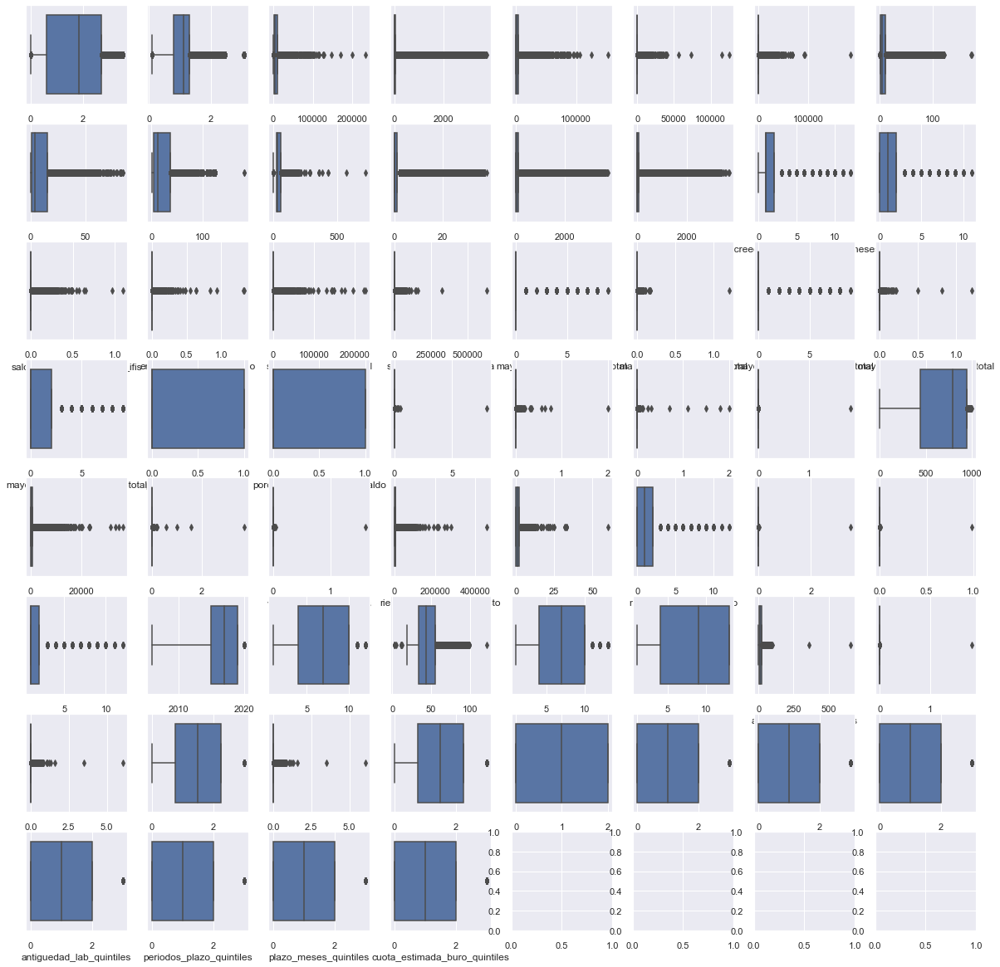

In [371]:
##Variables con Outliers
import math

vector = df_numeric_imp.columns
n = len(vector)
cols = int(np.round(math.sqrt(n),0))
rows = int(np.round(math.sqrt(n),0))

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(15, 55))
fig.set_size_inches(20.5, 20.5, forward=True)

i=-1
for row in ax:
      for col in row:
          i=i+1
          sns.boxplot(df_numeric_imp.loc[:,(vector[i])], ax=col,whis=[0.01,0.99])
plt.show()

In [372]:
df_numeric_imp['sueldo_quintiles'].fillna(0, inplace = True)
df_numeric_imp['antiguedad_lab_quintiles'].fillna(0, inplace = True)
df_numeric_imp['cuota_estimada_buro_quintiles'].fillna(0, inplace = True)

In [373]:
from scipy.stats import iqr

df_numerico_stats = pd.DataFrame()
df_numerico_stats = np.round(df_numeric_imp.describe().T)

 # Rango Intercuartilico
df_numerico_stats['IQR'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,75)),2) -np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,25)),2)                         
df_numerico_stats['Missin_PCT'] = np.round(df_numeric_imp.isnull().sum()/len(df_numeric_imp),2)           # Porcentaje de Missings
df_numerico_stats['P_1'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,1)),2)            # Percentil 1
df_numerico_stats['P_5'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,5)),2)            # Percentil 5
df_numerico_stats['P_95'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,95)),2)          # Percentil 95
df_numerico_stats['P_99'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,99)),2)          # Percentil 99
#df_numerico_stats['CV'] = np.round(df_numeric_imp.apply(lambda x: np.std(x)/np.mean(x)),2)              # Coeficiente de variacion
df_numerico_stats['Out_Zscore'] = df_numeric_imp.apply(lambda x: np.abs(x - x.mean()) / x.std() > 2).sum()  # método z-score (asumiendo normalidad) 
#df_numerico_stats['cota_bxp_inf'] = df_numerico.apply(lambda x: 2.5*np.nanpercentile(x,25)-1.5*np.nanpercentile(x,75))
#df_numerico_stats['cota_bxp_sup'] = df_numerico.apply(lambda x: 2.5*np.nanpercentile(x,75)-1.5*np.nanpercentile(x,25))


df_numerico_stats['Out_bxp_inf'] = np.round(df_numeric_imp.apply(lambda x: np.nanpercentile(x,25)),2)- 1.5*df_numerico_stats.IQR
df_numerico_stats['Out_bxp_sup'] = df_numeric_imp.apply(lambda x: 2.5*np.nanpercentile(x,75)-1.5*np.nanpercentile(x,25) < x).sum()
df_numerico_stats['Out_boxplot'] = df_numerico_stats.Out_bxp_inf+df_numerico_stats.Out_bxp_sup

df_numerico_stats.head(34)

,count,mean,std,min,25%,50%,75%,max,IQR,Missin_PCT,P_1,P_5,P_95,P_99,Out_Zscore,Out_bxp_inf,Out_bxp_sup,Out_boxplot
ente,426508.0,1.725983e+06,1080956.0,10.0,612542.0,1.839325e+06,2.723179e+06,3.534681e+06,2.110637e+06,0.00,2.798314e+04,1.120287e+05,3.275129e+06,3.454929e+06,0,-2.553414e+06,0,-2.553414e+06
cedula,426508.0,1.103169e+09,474874258.0,100006550.0,802126903.0,1.104964e+09,1.312800e+09,3.050520e+09,5.106734e+08,0.00,1.028751e+08,2.018814e+08,1.805734e+09,2.150107e+09,24511,3.611683e+07,12693,3.612952e+07
monto_aprobado,426508.0,6.887000e+03,5439.0,2.0,3000.0,5.000000e+03,1.000000e+04,2.323930e+05,7.000000e+03,0.00,8.560000e+02,1.500000e+03,1.600000e+04,2.000000e+04,19221,-7.500000e+03,3233,-4.267000e+03
dias_ven_cap,426508.0,1.740000e+02,494.0,0.0,0.0,0.000000e+00,4.900000e+01,3.777000e+03,4.900000e+01,0.00,0.000000e+00,0.000000e+00,9.430000e+02,2.777000e+03,18259,-7.350000e+01,88203,8.812950e+04
sld_tot_xven,426508.0,2.932000e+03,4294.0,0.0,0.0,1.250000e+03,4.110000e+03,1.526790e+05,4.110000e+03,0.00,0.000000e+00,0.000000e+00,1.175000e+04,1.820000e+04,21988,-6.165000e+03,26527,2.036200e+04
sld_tot_ven,426508.0,3.500000e+02,1208.0,0.0,0.0,0.000000e+00,1.000000e+00,1.250000e+05,1.000000e+00,0.00,0.000000e+00,0.000000e+00,2.190000e+03,5.566510e+03,15881,-1.500000e+00,93552,9.355050e+04
sld_tot_ndi,426508.0,4.300000e+02,1757.0,0.0,0.0,0.000000e+00,0.000000e+00,1.834680e+05,0.000000e+00,0.00,0.000000e+00,0.000000e+00,3.053950e+03,9.000000e+03,16667,0.000000e+00,51280,5.128000e+04
div_pendientes,426508.0,9.000000e+00,13.0,0.0,1.0,4.000000e+00,1.000000e+01,1.720000e+02,9.000000e+00,0.00,1.000000e+00,1.000000e+00,3.500000e+01,5.700000e+01,22458,-1.250000e+01,49893,4.988050e+04
div_pagados,426508.0,1.000000e+01,12.0,0.0,1.0,4.000000e+00,1.500000e+01,8.400000e+01,1.400000e+01,0.00,0.000000e+00,0.000000e+00,3.500000e+01,5.400000e+01,28518,-2.000000e+01,16326,1.630600e+04
periodos_plazo,426508.0,2.000000e+01,18.0,1.0,5.0,1.200000e+01,3.600000e+01,1.800000e+02,3.100000e+01,0.00,1.000000e+00,1.000000e+00,6.000000e+01,6.400000e+01,28265,-4.150000e+01,2037,1.995500e+03


In [374]:
#### Nuevos Rangos de las Variables Sin outliers
#vector = ['P_1','P_95','Out_bxp_inf','Out_bxp_sup']
vector = ['P_1','P_99','Out_bxp_inf','Out_bxp_sup']

df_numeric_imp_out = df_numeric_imp

for col in df_numeric_imp_out.columns:
    percentiles = df_numerico_stats[vector]
    percentiles = percentiles[percentiles.index.values == col].values
    print(percentiles[0,0],percentiles[0,1])
    df_numeric_imp_out[col][df_numeric_imp_out[col] <= percentiles[0,0] ] = percentiles[0,0]
    df_numeric_imp_out[col][df_numeric_imp_out[col] >= percentiles[0,1] ] = percentiles[0,1]

27983.14 3454928.81
102875142.49 2150107160.13
856.0 20000.0
0.0 2777.0
0.0 18200.0
0.0 5566.51
0.0 9000.0
1.0 57.0
0.0 54.0
1.0 64.0
6.0 96.0
0.0 20.0
0.0 2778.0
0.0 2297.0
0.0 6.0
0.0 5.0
0.0 38525.13
0.0 25886.26
0.0 0.0
0.0 1949.0
0.0 7.0
0.0 767.13
0.0 7.0
0.0 1430.0
0.0 7.0
0.0 1.0
0.0 1.0
0.0 79520.0
0.0 47350.88
0.0 471300.0
-30.0 77926.96
47.0 958.0
0.0 3642.46
0.0 62688.4
0.0 109947.6
60.0 20000.0
0.0 6.0
0.0 5.0
500.0 200000.0
0.0 7479.35
1.0 5.0
2008.0 2020.0
1.0 12.0
21.0 79.0
1.0 13.0
1.0 13.0
0.0 55.0
0.0 77926.96
0.0 73279.16
0.0 3.0
0.0 73279.16
0.0 3.0
0.0 2.0
0.0 3.0
0.0 3.0
0.0 3.0
0.0 3.0
0.0 3.0
0.0 3.0
0.0 3.0


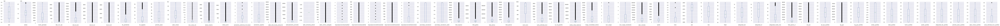

In [375]:
#vector = ['monto_aprobado', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_demanda_judicial', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'cuota_estimada_buro', 'ca_val_garantia', 'ventas_netas_balances', 'riesgo_consolidado_directo', 'num_cargas_estudiando', 'sueldo', 'Ciclo', 'Edad', 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes']
fig, axs = plt.subplots(1,len(df_numeric_imp_out.columns), figsize=(180,4))

for i,x in enumerate(df_numeric_imp_out.columns):
    df_numeric_imp_out[x].plot(kind='box',ax=axs[i])

plt.subplots_adjust(hspace=0.8, wspace=0.5)
plt.show()

IndexError: index 60 is out of bounds for axis 0 with size 60

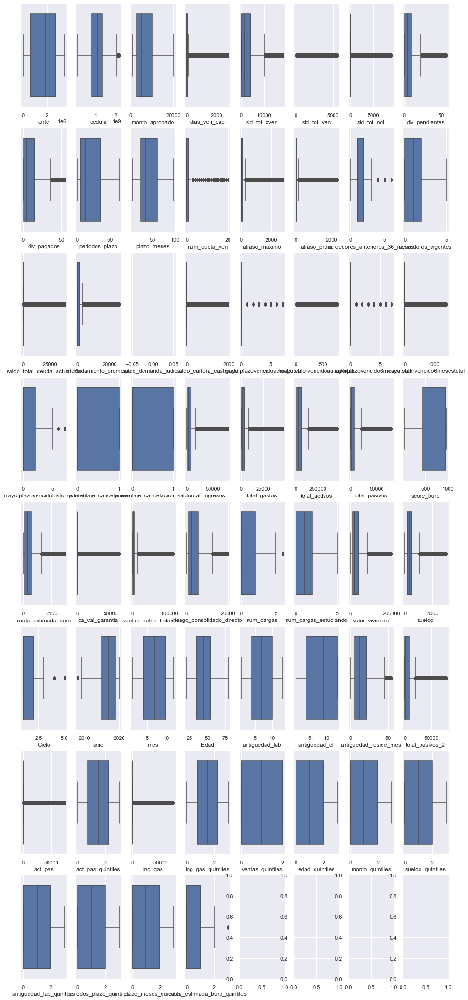

In [376]:
# Visualizando las variables Sin Outliers

import matplotlib.pyplot as plt
import math

vector = df_numeric_imp_out.columns

n = len(vector)
cols = int(np.round(math.sqrt(n),0))
rows = int(np.round(math.sqrt(n),0))

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(10, 15))
plt.subplots_adjust(bottom=0.1, right=0.8, top=2)
fig.set_size_inches(18.5, 15, forward=True)

i=-1
for row in ax:
      for col in row:
          i=i+1
          sns.boxplot(df_numeric_imp_out.loc[:,(vector[i])],ax=col,whis =1.5 )  #whis = 1.5  # whis =[0.01,0.99]
          
        
plt.show()

In [ ]:
df_numeric_imp_out.describe().T

In [ ]:
df_numerico.describe().T

### Eliminar Variables Sin Varianza

In [ ]:
# Creando una instancia del Transformador

#minmax_scale = preprocessing.MinMaxScaler(feature_range=(1,2))

# Asignando a un dataframe, el dataframe ya transformado por MinMaxScaler
#df_num_io_minmax = pd.DataFrame(minmax_scale.fit_transform(df_numeric_imp_out),index=df_numeric_imp_out.index.values, columns=df_numeric_imp_out.columns)

# Ordenando el dataframe ya transformado por la varianza de cada variable y veremos que variable podemos descartar por no tener variabilida
#df_num_io_minmax.var().sort_values(ascending = False)

In [ ]:
# Visualizando la varianza de las variables transformadas

plt.figure(figsize=(25,10))
plt.bar(df_numeric_imp_out.var().sort_values(ascending = False).index.values, df_numeric_imp_out.var().sort_values(ascending = False))
plt.xticks(df_numeric_imp_out.var().sort_values(ascending = False).index.values, df_numeric_imp_out.var().sort_values(ascending = False).index.values, rotation='vertical')
plt.axhline(y=0.01, color='r', linestyle='-')
plt.show()

In [377]:
# Se guarda en un df los nombres de las variables numericas con varianza menor a 0.01, transformadas por el metodo min-max
delete_low_numeric_variance = df_numeric_imp_out.var()[df_numeric_imp_out.var()<0.01].index.values
delete_low_numeric_variance

array(['saldo_demanda_judicial'], dtype=object)

In [378]:
#delete_low_numeric_variance = df_numerico.loc[:,['saldo_demanda_judicial', 'saldo_cartera_castigada','mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal']]
#delete_low_numeric_variance.tail(10)

In [379]:
# De la base df_num_io_minmax, se eliminan las variables numericas con menor varianza a 0.01
for i in delete_low_numeric_variance:
    del df_numeric_imp_out[i]   

In [380]:
df_numeric_imp_out.describe().T

,count,mean,std,min,25%,50%,75%,max
ente,426508.0,1.725783e+06,1.080130e+06,2.798314e+04,6.125415e+05,1.839325e+06,2.723179e+06,3.454929e+06
cedula,426508.0,1.101940e+09,4.718003e+08,1.028751e+08,8.021269e+08,1.104964e+09,1.312800e+09,2.150107e+09
monto_aprobado,426508.0,6.784183e+03,4.893778e+03,8.560000e+02,3.000000e+03,5.000000e+03,1.000000e+04,2.000000e+04
dias_ven_cap,426508.0,1.713165e+02,4.792248e+02,0.000000e+00,0.000000e+00,0.000000e+00,4.900000e+01,2.777000e+03
sld_tot_xven,426508.0,2.872095e+03,3.918937e+03,0.000000e+00,0.000000e+00,1.250000e+03,4.110000e+03,1.820000e+04
sld_tot_ven,426508.0,3.194994e+02,9.260684e+02,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,5.566510e+03
sld_tot_ndi,426508.0,3.951405e+02,1.434747e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.000000e+03
div_pendientes,426508.0,8.672466e+00,1.195906e+01,1.000000e+00,1.000000e+00,4.000000e+00,1.000000e+01,5.700000e+01
div_pagados,426508.0,9.772168e+00,1.224395e+01,0.000000e+00,1.000000e+00,4.000000e+00,1.500000e+01,5.400000e+01
periodos_plazo,426508.0,1.943095e+01,1.779409e+01,1.000000e+00,5.000000e+00,1.200000e+01,3.600000e+01,6.400000e+01


### Escalamiento Robusto 

In [381]:
# Creando una instancia del Transformador

robust_scale_est = preprocessing.RobustScaler() # Por defecto toma el 1er y 3er cuartil

# Asignando a un dataframe, el dataframe ya transformado por MinMaxScaler
df_num_io_robust = pd.DataFrame(robust_scale_est.fit_transform(df_numeric_imp_out),index=df_numeric_imp_out.index.values, columns=df_numeric_imp_out.columns)

# Ordenando el dataframe ya transformado por la varianza de cada variable y veremos que variable podemos descartar por no tener variabilidad
df_num_io_robust.var().sort_values(ascending = False)

ca_val_garantia                    8.629837e+07
saldo_total_deuda_actual_ifis      3.634211e+07
sld_tot_ndi                        2.058499e+06
sld_tot_ven                        8.576027e+05
saldo_cartera_castigada            4.616892e+04
mayorvalorvencido6mesestotal       3.105288e+04
ing_gas                            9.269507e+03
act_pas                            9.269507e+03
mayorvalorvencidoactualtotal       8.119309e+03
dias_ven_cap                       9.565030e+01
atraso_prom                        5.345853e+01
atraso_maximo                      2.067745e+01
num_cuota_ven                      1.244545e+01
endeudamiento_promedio             1.097122e+01
ventas_netas_balances              8.310580e+00
total_gastos                       4.449838e+00
total_ingresos                     3.612767e+00
total_pasivos                      2.701272e+00
total_pasivos_2                    2.700646e+00
total_activos                      2.335384e+00
sueldo                             1.961

In [382]:
# Se guarda en un df los nombres de las variables numericas con varianza menor a 0.01, transformadas por el metodo min-max
delete_low_numeric_variance_sr = df_num_io_robust.var()[df_num_io_robust.var()<0.02].index.values
delete_low_numeric_variance_sr

array([], dtype=object)

In [383]:
# De la base df_num_io_minmax, se eliminan las variables numericas con menor varianza a 0.01

for i in delete_low_numeric_variance_sr:
    del df_numeric_imp_out[i]    

In [384]:
df_numeric_imp_out.shape

(426508, 59)

### Correlaciones Numericas

In [385]:
df_numeric_imp_out.corr('pearson').style.background_gradient(cmap ='Blues')

,ente,cedula,monto_aprobado,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,score_buro,cuota_estimada_buro,ca_val_garantia,ventas_netas_balances,riesgo_consolidado_directo,num_cargas,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,anio,mes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,total_pasivos_2,act_pas,act_pas_quintiles,ing_gas,ing_gas_quintiles,ventas_quintiles,edad_quintiles,monto_quintiles,sueldo_quintiles,antiguedad_lab_quintiles,periodos_plazo_quintiles,plazo_meses_quintiles,cuota_estimada_buro_quintiles
ente,1.000000,0.023480,-0.042305,-0.215881,0.078701,0.015010,0.058162,0.161314,-0.063715,0.048988,-0.013913,-0.049368,-0.222085,-0.229322,0.113047,0.131511,0.012884,-0.029441,0.025938,0.049880,0.035504,0.051944,0.035820,0.131155,-0.154723,-0.237965,-0.138827,-0.132273,-0.171609,-0.111944,0.167395,0.014320,-0.159982,-0.161711,0.047887,-0.144032,-0.141341,-0.017805,0.002800,-0.121127,0.424325,0.001501,-0.444889,-0.751452,-0.974799,-0.146984,-0.111834,-0.028646,0.102139,-0.028646,0.102139,-0.044588,-0.427173,-0.044321,0.000632,-0.696887,0.035098,0.025129,-0.149913
cedula,0.023480,1.000000,-0.016547,0.006198,-0.021882,0.020008,0.017597,0.013222,0.035776,0.040603,0.000150,0.017471,0.007396,0.003168,-0.015247,-0.003054,-0.011623,-0.025418,0.006599,0.010649,0.007648,0.010705,0.006709,0.041178,0.003313,-0.000752,-0.017489,-0.022452,-0.050223,-0.036456,-0.042444,-0.028524,0.013246,-0.024009,-0.011281,-0.014235,-0.011169,-0.013627,0.011377,-0.022031,0.013829,0.006665,-0.076388,-0.025631,-0.021814,-0.027906,-0.036471,-0.007130,0.015660,-0.007130,0.015660,-0.018518,-0.071174,-0.012856,0.010537,-0.026765,0.026292,-0.006833,-0.025603
monto_aprobado,-0.042305,-0.016547,1.000000,-0.203187,0.592445,0.099247,0.183440,0.208803,0.160174,0.232413,0.504716,-0.084408,-0.199957,-0.238099,0.271407,0.237542,0.247162,0.301647,0.043266,0.043622,0.043774,0.052616,0.060714,-0.027442,0.030754,-0.052093,0.323783,0.315946,0.486885,0.399325,-0.063128,0.415019,0.306129,0.276148,0.682822,-0.017707,0.001660,0.381187,0.294421,-0.001765,0.101556,0.044334,0.060296,0.051116,0.041598,0.003889,0.399358,0.054399,-0.080908,0.054399,-0.080908,0.243719,0.059160,0.907020,0.364450,0.065804,0.213271,0.498612,0.068548
dias_ven_cap,-0.215881,0.006198,-0.203187,1.000000,-0.256038,0.181948,0.026265,0.015056,-0.096235,0.029034,-0.194950,0.553604,0.996357,0.954827,-0.259372,-0.192686,-0.089714,-0.105652,0.025765,0.013758,-0.003263,0.007515,-0.000250,0.082623,-0.106112,0.209117,-0.116469,-0.105867,-0.168042,-0.121965,-0.376807,-0.296557,-0.051153,-0.088564,-0.116545,-0.006817,0.011439,-0.100045,-0.097926,-0.151654,-0.558665,0.026125,0.038281,0.168791,0.200448,-0.043795,-0.122026,-0.040671,-0.152756,-0.040671,-0.152756,-0.184718,0.040020,-0.231133,-0.207357,0.060759,0.077394,-0.242901,-0.172235
sld_tot_xven,0.078701,-0.021882,0.592445,-0.256038,1.000000,-0.252847,-0.201840,0.259816,-0.242600,-0.019929,0.364533,-0.281877,-0.264041,-0.210846,0.271704,0.353004,0.244500,0.205837,-0.025108,-0.015655,0.007954,-0.011485,0.006723,-0.169860,-0.369628,-0.459076,0.253077,0.219252,0.346794,0.283679,0.293062,0.335283,0.194843,0.197882,0.774195,-0.027585,-0.013135,0.228475,0.122947,0.114009,0.409713,0.028839,-0.003397,-0.125296,-0.097658,0.027065,0.283757,-0.000654,-0.038191,-0.000654,-0.038191,0.172169,-0.000996,0.520981,0.182606,-0.100017,-0.024207,0.362687,-0.115542
sld_tot_ven,0.015010,0.020008,0.099247,0.181948,-0.252847,1.000000,0.316880,0.055071,-0.045234,0.044818,-0.007072,0.449687,0.177626,0.08

In [386]:
df_numeric_imp_out.corr('spearman').style.background_gradient(cmap ='Blues')

,ente,cedula,monto_aprobado,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,score_buro,cuota_estimada_buro,ca_val_garantia,ventas_netas_balances,riesgo_consolidado_directo,num_cargas,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,anio,mes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,total_pasivos_2,act_pas,act_pas_quintiles,ing_gas,ing_gas_quintiles,ventas_quintiles,edad_quintiles,monto_quintiles,sueldo_quintiles,antiguedad_lab_quintiles,periodos_plazo_quintiles,plazo_meses_quintiles,cuota_estimada_buro_quintiles
ente,1.000000,0.047726,-0.032508,-0.081645,0.123659,-0.067513,0.069137,0.177965,-0.066274,0.032161,-0.002467,-0.050675,-0.129252,-0.109717,0.153451,0.187223,0.063708,0.035302,0.031128,0.052962,0.053067,0.055189,0.055171,0.133058,-0.166715,-0.248766,-0.035909,-0.019801,-0.198379,-0.109427,0.189385,0.077142,-0.180442,-0.050501,0.107506,-0.144604,-0.150072,-0.058739,-0.000769,-0.114537,0.423152,0.005115,-0.456299,-0.766118,-0.979632,-0.138618,-0.103504,0.103530,0.099666,0.103530,0.099666,-0.046476,-0.427094,-0.044639,0.001634,-0.709686,0.036972,0.026613,-0.164087
cedula,0.047726,1.000000,-0.025127,0.038608,-0.030434,0.032714,0.026718,0.014201,0.020103,0.028934,-0.007580,0.039218,0.034030,0.032073,0.000747,0.008935,0.003088,-0.012095,0.007536,0.015372,0.015389,0.015813,0.015653,0.047046,-0.000418,-0.007055,-0.021632,-0.018185,-0.075590,-0.037513,-0.039929,-0.027962,0.001541,-0.026416,-0.013637,-0.003876,-0.002470,-0.016490,0.007101,-0.018154,0.022555,0.006620,-0.130025,-0.044898,-0.050980,-0.044835,-0.037536,0.011325,0.010537,0.011325,0.010537,-0.026233,-0.125552,-0.021242,0.008774,-0.044600,0.022807,-0.007316,-0.027161
monto_aprobado,-0.032508,-0.025127,1.000000,-0.127195,0.402605,-0.075243,0.074547,0.250168,0.212257,0.258002,0.580712,-0.091923,-0.029773,-0.174080,0.263864,0.225543,0.228979,0.290603,0.043746,0.056710,0.057383,0.067638,0.069009,-0.004378,0.058195,-0.052176,0.342108,0.345539,0.595711,0.399595,-0.074210,0.462388,0.212702,0.289909,0.598923,0.000576,0.015410,0.438882,0.376027,0.026891,0.057113,0.047019,0.058466,0.055800,0.030584,0.001331,0.400012,-0.061421,-0.079147,-0.061421,-0.079147,0.241662,0.052737,0.968283,0.381315,0.077447,0.223372,0.563203,0.049235
dias_ven_cap,-0.081645,0.038608,-0.127195,1.000000,-0.701725,0.862721,0.432640,0.166004,0.101555,0.201836,-0.115266,0.975390,0.799619,0.807467,-0.238358,-0.188797,-0.119499,-0.152405,0.108394,0.117316,0.115253,0.118250,0.115752,0.357547,-0.000406,0.172566,-0.162154,-0.131229,-0.218026,-0.115746,-0.663832,-0.492203,-0.022068,-0.139176,-0.098842,-0.002619,-0.001282,-0.060279,-0.068263,-0.159932,-0.323262,0.027569,-0.020364,0.081542,0.083468,-0.079999,-0.119498,-0.112566,-0.094041,-0.112566,-0.094041,-0.111327,-0.020707,-0.117923,-0.097715,0.042161,0.181902,-0.147899,-0.142199
sld_tot_xven,0.123659,-0.030434,0.402605,-0.701725,1.000000,-0.768762,-0.456087,0.186957,-0.259020,-0.139885,0.294058,-0.678014,-0.684096,-0.662013,0.335521,0.402685,0.268901,0.252025,-0.067468,-0.047361,-0.044902,-0.040951,-0.037829,-0.257352,-0.317331,-0.459934,0.239673,0.212546,0.305184,0.201762,0.577060,0.503701,0.057448,0.192994,0.571047,-0.016663,-0.007471,0.162092,0.137297,0.159220,0.495207,0.012288,-0.015290,-0.160252,-0.125811,0.053395,0.206525,0.017237,0.007902,0.017237,0.007902,0.162230,-0.011900,0.391400,0.151205,-0.124380,-0.120813,0.325633,-0.078713
sld_tot_ven,-0.067513,0.032714,-0.075243,0.862721,-0.768762,1.000000,0.562566,0.107928,0.082370,0.138418,-0.109984,0.837845,0.726463,0.725474

In [387]:
matrix = df_numeric_imp_out.corr(method ='pearson')
def color_positive_green(val):
    if val >= .7:
        color = 'red'
    else:
        color = 'black'
    return 'color: %s' % color
matrix.style.applymap(color_positive_green)

,ente,cedula,monto_aprobado,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,atraso_maximo,atraso_prom,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,score_buro,cuota_estimada_buro,ca_val_garantia,ventas_netas_balances,riesgo_consolidado_directo,num_cargas,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,anio,mes,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,total_pasivos_2,act_pas,act_pas_quintiles,ing_gas,ing_gas_quintiles,ventas_quintiles,edad_quintiles,monto_quintiles,sueldo_quintiles,antiguedad_lab_quintiles,periodos_plazo_quintiles,plazo_meses_quintiles,cuota_estimada_buro_quintiles
ente,1.000000,0.023480,-0.042305,-0.215881,0.078701,0.015010,0.058162,0.161314,-0.063715,0.048988,-0.013913,-0.049368,-0.222085,-0.229322,0.113047,0.131511,0.012884,-0.029441,0.025938,0.049880,0.035504,0.051944,0.035820,0.131155,-0.154723,-0.237965,-0.138827,-0.132273,-0.171609,-0.111944,0.167395,0.014320,-0.159982,-0.161711,0.047887,-0.144032,-0.141341,-0.017805,0.002800,-0.121127,0.424325,0.001501,-0.444889,-0.751452,-0.974799,-0.146984,-0.111834,-0.028646,0.102139,-0.028646,0.102139,-0.044588,-0.427173,-0.044321,0.000632,-0.696887,0.035098,0.025129,-0.149913
cedula,0.023480,1.000000,-0.016547,0.006198,-0.021882,0.020008,0.017597,0.013222,0.035776,0.040603,0.000150,0.017471,0.007396,0.003168,-0.015247,-0.003054,-0.011623,-0.025418,0.006599,0.010649,0.007648,0.010705,0.006709,0.041178,0.003313,-0.000752,-0.017489,-0.022452,-0.050223,-0.036456,-0.042444,-0.028524,0.013246,-0.024009,-0.011281,-0.014235,-0.011169,-0.013627,0.011377,-0.022031,0.013829,0.006665,-0.076388,-0.025631,-0.021814,-0.027906,-0.036471,-0.007130,0.015660,-0.007130,0.015660,-0.018518,-0.071174,-0.012856,0.010537,-0.026765,0.026292,-0.006833,-0.025603
monto_aprobado,-0.042305,-0.016547,1.000000,-0.203187,0.592445,0.099247,0.183440,0.208803,0.160174,0.232413,0.504716,-0.084408,-0.199957,-0.238099,0.271407,0.237542,0.247162,0.301647,0.043266,0.043622,0.043774,0.052616,0.060714,-0.027442,0.030754,-0.052093,0.323783,0.315946,0.486885,0.399325,-0.063128,0.415019,0.306129,0.276148,0.682822,-0.017707,0.001660,0.381187,0.294421,-0.001765,0.101556,0.044334,0.060296,0.051116,0.041598,0.003889,0.399358,0.054399,-0.080908,0.054399,-0.080908,0.243719,0.059160,0.907020,0.364450,0.065804,0.213271,0.498612,0.068548
dias_ven_cap,-0.215881,0.006198,-0.203187,1.000000,-0.256038,0.181948,0.026265,0.015056,-0.096235,0.029034,-0.194950,0.553604,0.996357,0.954827,-0.259372,-0.192686,-0.089714,-0.105652,0.025765,0.013758,-0.003263,0.007515,-0.000250,0.082623,-0.106112,0.209117,-0.116469,-0.105867,-0.168042,-0.121965,-0.376807,-0.296557,-0.051153,-0.088564,-0.116545,-0.006817,0.011439,-0.100045,-0.097926,-0.151654,-0.558665,0.026125,0.038281,0.168791,0.200448,-0.043795,-0.122026,-0.040671,-0.152756,-0.040671,-0.152756,-0.184718,0.040020,-0.231133,-0.207357,0.060759,0.077394,-0.242901,-0.172235
sld_tot_xven,0.078701,-0.021882,0.592445,-0.256038,1.000000,-0.252847,-0.201840,0.259816,-0.242600,-0.019929,0.364533,-0.281877,-0.264041,-0.210846,0.271704,0.353004,0.244500,0.205837,-0.025108,-0.015655,0.007954,-0.011485,0.006723,-0.169860,-0.369628,-0.459076,0.253077,0.219252,0.346794,0.283679,0.293062,0.335283,0.194843,0.197882,0.774195,-0.027585,-0.013135,0.228475,0.122947,0.114009,0.409713,0.028839,-0.003397,-0.125296,-0.097658,0.027065,0.283757,-0.000654,-0.038191,-0.000654,-0.038191,0.172169,-0.000996,0.520981,0.182606,-0.100017,-0.024207,0.362687,-0.115542
sld_tot_ven,0.015010,0.020008,0.099247,0.181948,-0.252847,1.000000,0.316880,0.055071,-0.045234,0.044818,-0.007072,0.449687,0.177626,0.08

In [311]:
df_numeric_imp_out.drop(['act_pas_quintiles','act_pas'], axis= 1, inplace = True)

In [312]:
#df_numeric_imp_out.drop(['num_cuota_ven','mayorplazovencido6mesestota'], axis=1, inplace = True)

In [388]:
df_numeric_imp_out.isna().sum()

ente                                    0
cedula                                  0
monto_aprobado                          0
dias_ven_cap                            0
sld_tot_xven                            0
sld_tot_ven                             0
sld_tot_ndi                             0
div_pendientes                          0
div_pagados                             0
periodos_plazo                          0
plazo_meses                             2
num_cuota_ven                           0
atraso_maximo                           0
atraso_prom                         68807
acreedores_anteriores_36_meses        120
acreedores_vigentes                   120
saldo_total_deuda_actual_ifis         120
endeudamiento_promedio                120
saldo_cartera_castigada               120
mayorplazovencidoactualtotal          120
mayorvalorvencidoactualtotal          120
mayorplazovencido6mesestotal          120
mayorvalorvencido6mesestotal          120
mayorplazovencidohistoricototal   

### Inflacion de Varianza - VIF

In [389]:
from sklearn.impute import SimpleImputer

df_numeric_imp = df_numeric_imp_out
#df_numeric_imp = df_numeric_imp.drop(features_null_delete, axis = 1)
df_numeric_imp = df_numeric_imp.drop(features_null_delete)
imp_1 = SimpleImputer(missing_values= np.NAN, strategy= 'mean', fill_value=None, verbose=0, copy=True)
          
for i in df_numeric_imp.columns:
  df_numeric_imp.loc[:,(i)] = imp_1.fit_transform(df_numeric_imp.loc[:,(i)].values.reshape(-1,1))

print('\n')

# Nuevo Dataframe sin Missings o valores perdidos

df_numeric_imp.isnull().mean().sort_values(ascending = False)

ente                               0.0
antiguedad_cli                     0.0
ca_val_garantia                    0.0
ventas_netas_balances              0.0
riesgo_consolidado_directo         0.0
num_cargas                         0.0
num_cargas_estudiando              0.0
valor_vivienda                     0.0
sueldo                             0.0
Ciclo                              0.0
anio                               0.0
mes                                0.0
Edad                               0.0
antiguedad_lab                     0.0
antiguedad_reside_mes              0.0
score_buro                         0.0
total_pasivos_2                    0.0
act_pas                            0.0
act_pas_quintiles                  0.0
ing_gas                            0.0
ing_gas_quintiles                  0.0
ventas_quintiles                   0.0
edad_quintiles                     0.0
monto_quintiles                    0.0
sueldo_quintiles                   0.0
antiguedad_lab_quintiles 

In [399]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
# Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) 
    for i in range(X.shape[1])]
    return(vif)

In [402]:
# df_numeric_imp_out
dataset2 = df_numeric_imp
calc_vif(dataset2)

,variables,VIF
0,ente,2.130584e+01
1,cedula,6.569321e+00
2,monto_aprobado,9.014151e+00
3,dias_ven_cap,1.591436e+02
4,sld_tot_xven,9.007647e+00
5,sld_tot_ven,2.223714e+00
6,sld_tot_ndi,2.572541e+00
7,div_pendientes,1.002368e+01
8,div_pagados,1.081471e+01
9,periodos_plazo,2.403940e+01


NameError: name 'corrfunc' is not defined

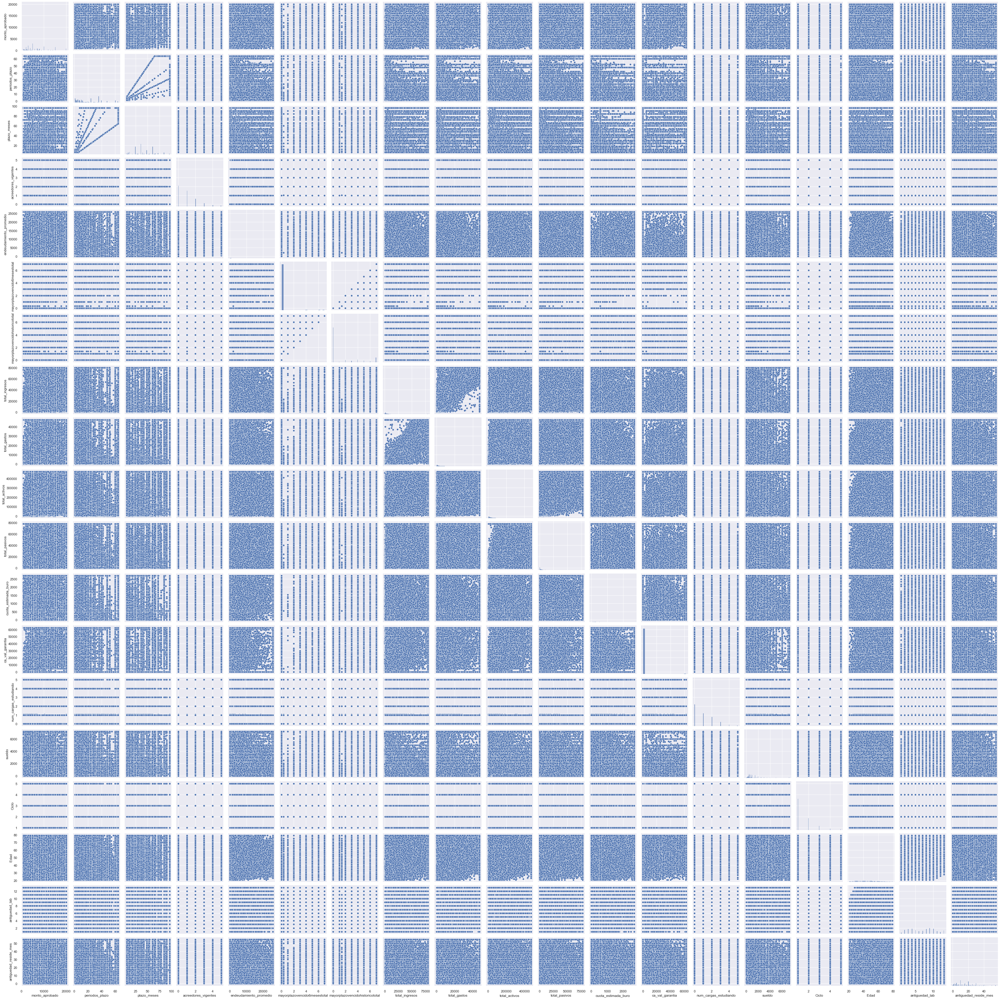

In [231]:
#g = sns.pairplot(df_numeric_imp_out,diag_kind="hist")
#g.map_lower(corrfunc)
#plt.show()

In [393]:
X = df_numeric_imp_out
y = df_cliente['atraso_maximo']
#X = sm.add_constant(X)
import statsmodels.api as sm
reg_model=sm.OLS(y,X)
result=reg_model.fit()
print(result.summary())

MissingDataError: exog contains inf or nans

In [410]:
print(list(df_numeric_imp_out.columns))

['ing_gas_quintiles', 'ventas_quintiles', 'edad_quintiles', 'monto_quintiles', 'sueldo_quintiles', 'antiguedad_lab_quintiles', 'periodos_plazo_quintiles', 'plazo_meses_quintiles', 'cuota_estimada_buro_quintiles']


In [578]:
#df_numeric_imp_out_2 = df_numeric_imp_out.drop(['Ciclo', 'num_cargas_estudiando'], axis = 1 , inplace = True)

KeyError: "['Ciclo' 'num_cargas_estudiando'] not found in axis"

In [411]:
import statsmodels.api as sm
reg_model_2=sm.OLS(df_cliente['atraso_maximo'],df_numeric_imp_out_2)
result_2=reg_model_2.fit()
print(result_2.summary())

NameError: name 'df_numeric_imp_out_2' is not defined

### Random Forest 

In [403]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import sklearn.metrics as metrics
from sklearn.model_selection import GridSearchCV

In [404]:
X = df_numeric_imp_out
y = df_cliente['Micro_60']
features_label = X.columns[1:]
forest = RandomForestClassifier (n_estimators = 14, random_state=0, n_jobs = -1)
forest.fit(X,y)
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]
for i in range(X.shape[1]):
    print ("%2d) %-*s %f" % (i + 1, 30, features_label[i],importances[indices[i]]))

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

<Figure size 1800x720 with 0 Axes>

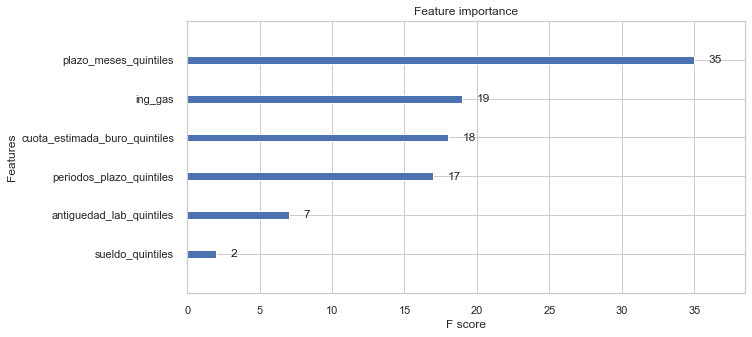

In [652]:
from xgboost import plot_importance,XGBClassifier
plt.figure(figsize=(25,10))
X = df_numeric_imp_out
y = df_cliente['Micro_60']
model=XGBClassifier(n_estimators=14)
model.fit(X,y)
plot_importance(model)
plt.show()

### Arboles de Decisión 

In [415]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Configuración warnings
# ------------------------------------------------------------------------------
import warnings
warnings.filterwarnings('once')

In [416]:
df_arbol= pd.concat([df_numeric_imp_out, df_cliente['Micro_60']], axis=1)

In [417]:
df_arbol.head(3)

,ing_gas_quintiles,ventas_quintiles,edad_quintiles,monto_quintiles,sueldo_quintiles,antiguedad_lab_quintiles,periodos_plazo_quintiles,plazo_meses_quintiles,cuota_estimada_buro_quintiles,Micro_60
0,3,0.0,2,0,0.0,3.0,2,0.0,0.0,MALO
1,1,2.0,1,1,3.0,2.0,2,0.0,0.0,MALO
2,0,0.0,0,1,1.0,0.0,2,1.0,0.0,MALO


In [418]:
print(list(df_arbol.columns))

['ing_gas_quintiles', 'ventas_quintiles', 'edad_quintiles', 'monto_quintiles', 'sueldo_quintiles', 'antiguedad_lab_quintiles', 'periodos_plazo_quintiles', 'plazo_meses_quintiles', 'cuota_estimada_buro_quintiles', 'Micro_60']


In [419]:
df_arbol['label'] = df_arbol['Micro_60'].map({'BUENO': 0, 'MALO': 1})

In [420]:
df_arbol.drop(['Micro_60'], axis=1, inplace=True)

In [421]:
modelo_1 = DecisionTreeRegressor( max_depth         = 2,
                                random_state      = 123
                               )

In [422]:
y_train = df_arbol['label']
X_train = df_arbol.loc[:,['cuota_estimada_buro_quintiles']]

In [423]:
modelo_1.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=2, random_state=123)

Profundidad del árbol: 2
Número de nodos terminales: 3


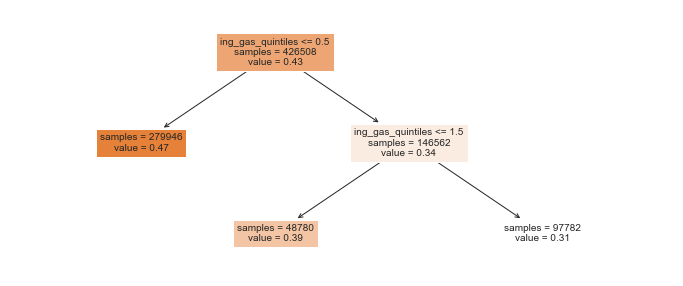

In [424]:
fig, ax = plt.subplots(figsize=(12, 5))

print(f"Profundidad del árbol: {modelo_1.get_depth()}")
print(f"Número de nodos terminales: {modelo_1.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo_1,
            feature_names = df_arbol.columns,
            class_names   = 'cuota_estimada_buro',
            filled        = True,
            impurity      = False,
            fontsize      = 10,
            precision     = 2,
            ax            = ax
       )

In [425]:
texto_modelo = export_text(
                    decision_tree = modelo_1,
                    feature_names = list(X_train.columns)
               )
print(texto_modelo)

|--- cuota_estimada_buro_quintiles <= 0.50
|   |--- value: [0.47]
|--- cuota_estimada_buro_quintiles >  0.50
|   |--- cuota_estimada_buro_quintiles <= 1.50
|   |   |--- value: [0.39]
|   |--- cuota_estimada_buro_quintiles >  1.50
|   |   |--- value: [0.31]



In [426]:
df_arbol.describe().T

,count,mean,std,min,25%,50%,75%,max
ing_gas_quintiles,426508.0,1.500000,1.118035,0.0,0.75,1.5,2.25,3.0
ventas_quintiles,425605.0,1.490116,1.117820,0.0,0.00,1.0,2.00,3.0
edad_quintiles,426508.0,1.457879,1.128914,0.0,0.00,1.0,2.00,3.0
monto_quintiles,426508.0,1.356591,1.086525,0.0,0.00,1.0,2.00,3.0
sueldo_quintiles,426508.0,1.391800,1.125398,0.0,0.00,1.0,2.00,3.0
antiguedad_lab_quintiles,426508.0,1.315258,1.091261,0.0,0.00,1.0,2.00,3.0
periodos_plazo_quintiles,426508.0,1.344432,1.032067,0.0,0.00,1.0,2.00,3.0
plazo_meses_quintiles,426506.0,1.277783,1.028321,0.0,0.00,1.0,2.00,3.0
cuota_estimada_buro_quintiles,426508.0,0.687340,1.063585,0.0,0.00,0.0,1.00,3.0
label,426508.0,0.426935,0.494633,0.0,0.00,0.0,1.00,1.0


In [427]:
print(list(df_arbol.columns))

['ing_gas_quintiles', 'ventas_quintiles', 'edad_quintiles', 'monto_quintiles', 'sueldo_quintiles', 'antiguedad_lab_quintiles', 'periodos_plazo_quintiles', 'plazo_meses_quintiles', 'cuota_estimada_buro_quintiles', 'label']


### Encoder

In [428]:
## One-hot encode multi-category cat. variables
multicat_vars_con =  ['ing_gas_quintiles', 'ventas_quintiles', 'edad_quintiles', 'monto_quintiles', 'sueldo_quintiles', 'antiguedad_lab_quintiles', 'periodos_plazo_quintiles', 'plazo_meses_quintiles', 'cuota_estimada_buro_quintiles', 'label']
df_arbol_total = pd.get_dummies(df_arbol, columns = multicat_vars_con)
#df_enc.iloc[:,16:26] = df_enc.iloc[:,16:26].astype(int)
df_arbol_total.head(2)

,ing_gas_quintiles_0,ing_gas_quintiles_1,ing_gas_quintiles_2,ing_gas_quintiles_3,ventas_quintiles_0.0,ventas_quintiles_1.0,ventas_quintiles_2.0,ventas_quintiles_3.0,edad_quintiles_0,edad_quintiles_1,edad_quintiles_2,edad_quintiles_3,monto_quintiles_0,monto_quintiles_1,monto_quintiles_2,monto_quintiles_3,sueldo_quintiles_0.0,sueldo_quintiles_1.0,sueldo_quintiles_2.0,sueldo_quintiles_3.0,antiguedad_lab_quintiles_0.0,antiguedad_lab_quintiles_1.0,antiguedad_lab_quintiles_2.0,antiguedad_lab_quintiles_3.0,periodos_plazo_quintiles_0,periodos_plazo_quintiles_1,periodos_plazo_quintiles_2,periodos_plazo_quintiles_3,plazo_meses_quintiles_0.0,plazo_meses_quintiles_1.0,plazo_meses_quintiles_2.0,plazo_meses_quintiles_3.0,cuota_estimada_buro_quintiles_0.0,cuota_estimada_buro_quintiles_1.0,cuota_estimada_buro_quintiles_2.0,cuota_estimada_buro_quintiles_3.0,label_0,label_1
0,0,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1
1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1


 ### Woe & Bins

In [429]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [430]:
data  = df_arbol_total
for col in data.columns:
    if col == 'label_1': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(data, col, 'label_1')
        print(df)
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: ing_gas_quintiles_0
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
1      1  106627   51088   55539     0.20902   0.305007 -0.377905  0.036274
0      0  319881  193329  126552     0.79098   0.694993  0.129371  0.012418
IV score: 0.05


WoE and IV for column: ing_gas_quintiles_1
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  319881  181690  138191    0.743361   0.758912 -0.020704  0.000322
1      1  106627   62727   43900    0.256639   0.241088  0.062508  0.000972
IV score: 0.00


WoE and IV for column: ing_gas_quintiles_2
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  319881  179302  140579    0.733591   0.772026 -0.051067  0.001963
1      1  106627   65115   41512    0.266409   0.227974  0.155803  0.005988
IV score: 0.01


WoE and IV for column: ing_gas_quintiles_3
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
1      0  319881 

   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
1      1  102976   50172   52804    0.205272   0.289987 -0.345499  0.029269
0      0  323532  194245  129287    0.794728   0.710013  0.112716  0.009549
IV score: 0.04


WoE and IV for column: plazo_meses_quintiles_2.0
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  285698  161799  123899    0.661979   0.680424 -0.027481  0.000507
1      1  140810   82618   58192    0.338021   0.319576  0.056110  0.001035
IV score: 0.00


WoE and IV for column: plazo_meses_quintiles_3.0
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  373046  207499  165547    0.848955   0.909144 -0.068498  0.004123
1      1   53462   36918   16544    0.151045   0.090856  0.508307  0.030595
IV score: 0.03


WoE and IV for column: cuota_estimada_buro_quintiles_0.0
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      1  279946  147075  132871  

C:\Anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [432]:
#df_arbol_total.drop([ 'periodos_plazo_quintiles_0.0', 'periodos_plazo_quintiles_1.0', 'periodos_plazo_quintiles_2.0', 'periodos_plazo_quintiles_3.0', 'periodos_plazo_quintiles_4.0', 'plazo_meses_quintiles_0.0', 'plazo_meses_quintiles_1.0', 'plazo_meses_quintiles_1.6690034841244907', 'plazo_meses_quintiles_2.0', 'plazo_meses_quintiles_3.0', 'plazo_meses_quintiles_4.0', 'cuota_estimada_buro_quintiles_0.0', 'cuota_estimada_buro_quintiles_1.0', 'cuota_estimada_buro_quintiles_1.9981395824282537', 'cuota_estimada_buro_quintiles_2.0', 'cuota_estimada_buro_quintiles_3.0', 'cuota_estimada_buro_quintiles_4.0', 'ventas_quintiles_0.0', 'ventas_quintiles_1.0', 'ventas_quintiles_1.9916636317712433', 'ventas_quintiles_2.0', 'ventas_quintiles_3.0', 'ventas_quintiles_4.0', 'ing_gas_quintiles_0.0', 'ing_gas_quintiles_1.0', 'ing_gas_quintiles_2.0', 'ing_gas_quintiles_3.0', 'ing_gas_quintiles_4.0', 'endeud_prom_B_0.0', 'endeud_prom_B_1.0', 'endeud_prom_B_2.0', 'endeud_prom_B_3.0', 'mpv_histtot_B_0.0', 'mpv_histtot_B_1.0', 'mpv_histtot_B_2.0'], axis = 1 , inplace = True)

In [433]:
#df_arbol_total.drop(['plazo_meses_quintiles_1.6690034841244907',   'cuota_estimada_buro_quintiles_1.9981395824282537',   'ventas_quintiles_1.9916636317712433'], axis = 1 , inplace =True)

In [439]:
df_arbol_total.corr('pearson').style.background_gradient(cmap ='Blues')

,ing_gas_quintiles_0,ing_gas_quintiles_1,ing_gas_quintiles_2,ing_gas_quintiles_3,ventas_quintiles_0.0,ventas_quintiles_1.0,ventas_quintiles_2.0,ventas_quintiles_3.0,edad_quintiles_0,edad_quintiles_1,edad_quintiles_2,edad_quintiles_3,monto_quintiles_0,monto_quintiles_1,monto_quintiles_2,monto_quintiles_3,sueldo_quintiles_0.0,sueldo_quintiles_1.0,sueldo_quintiles_2.0,sueldo_quintiles_3.0,antiguedad_lab_quintiles_0.0,antiguedad_lab_quintiles_1.0,antiguedad_lab_quintiles_2.0,antiguedad_lab_quintiles_3.0,periodos_plazo_quintiles_0,periodos_plazo_quintiles_1,periodos_plazo_quintiles_2,periodos_plazo_quintiles_3,plazo_meses_quintiles_0.0,plazo_meses_quintiles_1.0,plazo_meses_quintiles_2.0,plazo_meses_quintiles_3.0,cuota_estimada_buro_quintiles_0.0,cuota_estimada_buro_quintiles_1.0,cuota_estimada_buro_quintiles_2.0,cuota_estimada_buro_quintiles_3.0,label_0,label_1
ing_gas_quintiles_0,1.000000,-0.333333,-0.333333,-0.333333,0.065259,0.000615,-0.008110,-0.066372,-0.009190,0.075420,0.011020,-0.077753,0.004001,-0.037020,0.009800,0.025917,0.000956,-0.040831,-0.006025,0.048301,0.007960,-0.006634,-0.023358,0.026454,-0.067104,-0.025126,0.060182,0.036360,0.013060,-0.012336,-0.003045,0.002134,0.057149,-0.095768,-0.039124,0.049665,-0.109646,0.109646
ing_gas_quintiles_1,-0.333333,1.000000,-0.333333,-0.333333,-0.059897,0.009328,0.005860,0.047509,-0.076265,0.005947,0.035717,0.037271,-0.084890,-0.012795,0.044150,0.062590,-0.078642,-0.008920,0.029114,0.065188,-0.062348,-0.006403,0.036754,0.039776,-0.022470,0.008363,-0.007028,0.026584,-0.069636,0.012880,0.040489,0.022493,-0.030219,-0.028787,0.015261,0.058577,0.017764,-0.017764
ing_gas_quintiles_2,-0.333333,-0.333333,1.000000,-0.333333,-0.026625,0.002568,-0.001277,0.028120,0.014581,-0.042858,-0.008581,0.036857,0.020221,0.024944,-0.018431,-0.030589,0.012852,0.020463,-0.008698,-0.027459,0.049214,-0.014397,-0.023253,-0.017650,0.020846,-0.000715,-0.010850,-0.010899,0.002881,0.017258,-0.009079,-0.013401,0.006208,0.026405,0.004934,-0.040599,0.043905,-0.043905
ing_gas_quintiles_3,-0.333333,-0.333333,-0.333333,1.000000,0.021263,-0.012510,0.003527,-0.009256,0.070873,-0.038509,-0.038156,0.003625,0.060668,0.024871,-0.035519,-0.057918,0.064833,0.029288,-0.014392,-0.086029,0.005174,0.027435,0.009857,-0.048579,0.068728,0.017478,-0.042304,-0.052045,0.053695,-0.017802,-0.028365,-0.011226,-0.033138,0.098150,0.018929,-0.067643,0.047977,-0.047977
ventas_quintiles_0.0,0.065259,-0.059897,-0.026625,0.021263,1.000000,-0.340939,-0.324057,-0.332223,0.059278,0.001470,-0.025037,-0.037800,0.196633,0.018848,-0.085136,-0.152083,0.133197,0.091919,-0.009844,-0.228770,0.077815,-0.077209,-0.023689,0.014390,-0.041914,0.012917,0.058367,-0.039624,0.070985,-0.009494,-0.024509,-0.051455,0.096762,-0.006338,-0.047873,-0.090074,-0.041938,0.041938
ventas_quintiles_1.0,0.000615,0.009328,0.002568,-0.012510,-0.340939,1.000000,-0.332348,-0.340723,0.033998,0.008207,-0.006986,-0.036334,-0.010608,0.026683,0.017334,-0.037139,-0.072860,-0.009042,0.035406,0.053552,0.040331,-0.012283,0.010511,-0.051151,-0.137960,-0.063124,0.104363,0.114029,-0.089933,0.076724,0.029472,-0.016188,0.026800,0.026355,-0.019033,-0.047268,-0.036742,0.036742
ventas_quintiles_2.0,-0.008110,0.005860,-0.001277,0.003527,-0.324057,-0.332348,1.000000,-0.323852,-0.005403,0.015361,0.003546,-0.013488,-0.018394,-0.023676,0.030386,0.013662,-0.037772,-0.030825,-0.021312,0.091931,-0.012744,0.060787,-0.003271,-0.045313,-0.043254,-0.014927,0.015558,0.051946,-0.053744,0.041312,0.024645,-0.013794,-0.047916,0.040860,0.018826,0.011781,-0.007851,0.007851
ventas_quintiles_3.0,-0.066372,0.047509,0.028120,-0.009256,-0.332223,-0.340723,-0.323852,1.000000,-0.087461,-0.026163,0.028781,0.088044,-0.172075,-0.021283,0.038674,0.178627,-0.025583,-0.051904,-0.003538,0.085634,-0.102756,0.032017,0.019574,0.071209,0.227331,0.065463,-0.181781,-0.127444,0.068326,-0.107038,-0.028051,0.083339,-0.079208,-0.059312,0.049846,0.127542,0.092060,-0.092060
edad_quintiles_0,-0.009190,-0.076265,0.014581,0.070873,0.059278,0.033998

In [436]:
y_con = df_arbol['label']
X_con = df_arbol_total

In [438]:
import statsmodels.api as sm
logit_model=sm.Logit(y_con,X_con)
result=logit_model.fit()
print(result.summary())

PerfectSeparationError: Perfect separation detected, results not available

##  Variables Categoricas

In [405]:
df_cliente['des_op_sector_bnf'].value_counts()

PECUARIO                             134384
AGRICOLA                             123050
COMERCIO                              87321
SERVICIOS                             33239
PEQUEÑA_INDUSTRIA                     22873
ARTESANAL                             12886
PESQUERO_ARTESANAL                     4833
HABILIDADES_ESPECIALES                 4444
PISCICULTURA                           1672
TURISMO                                 690
INDUSTRIAL                              448
ACUICOLA                                236
FORESTAL                                215
ACTIVIDADES_FINANCIERAS_Y_SEGUROS       109
AGROINDUSTRIAL                           66
COMERCIALES_DIRECTOS                     20
TURISMO_ACUATICO                          6
MINERIA                                   5
SOBREGIRO_OCASIONAL                       2
Name: des_op_sector_bnf, dtype: int64

In [406]:
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('AGRICOLA', 'AGRO_GANADERO', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('PECUARIO', 'AGRO_GANADERO', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('COMERCIALES_DIRECTOS', 'COMERCIO', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('AGROINDUSTRIAL', 'INDUSTRIAL', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('PEQUEÑA_INDUSTRIA', 'INDUSTRIAL', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('PESQUERO_ARTESANAL' , 'ACUICOLA', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('PISCICULTURA', 'ACUICOLA', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('TURISMO_ACUATICO', 'TURISMO', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('TURISMO', 'TURISMO', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('ACTIVIDADES_FINANCIERAS_Y_SEGUROS', 'SERVICIOS', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('SERVICIOS_FINANCIEROS', 'SERVICIOS',regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('HABILIDADES_ESPECIALES', 'OTROS', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('SOBREGIRO_OCASIONAL', 'SERVICIOS', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('FORESTAL', 'OTROS', regex=True)
df_cliente['des_op_sector_bnf'] = df_cliente['des_op_sector_bnf'].str.replace('MINERIA', 'OTROS', regex=True)

In [407]:
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('AGRICOLA', 'AGRO_GANADERO', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('PECUARIO', 'AGRO_GANADERO', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('COMERCIALES_DIRECTOS', 'COMERCIO', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('AGROINDUSTRIAL', 'INDUSTRIAL', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('PEQUEÑA_INDUSTRIA', 'INDUSTRIAL', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('PESQUERO_ARTESANAL' , 'ACUICOLA', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('PISCICULTURA', 'ACUICOLA', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('TURISMO_ACUATICO', 'TURISMO', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('TURISMO', 'TURISMO', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('ACTIVIDADES_FINANCIERAS_Y_SEGUROS', 'SERVICIOS', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('SERVICIOS_FINANCIEROS', 'SERVICIOS',regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('HABILIDADES_ESPECIALES', 'OTROS', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('SOBREGIRO_OCASIONAL', 'SERVICIOS', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('FORESTAL', 'OTROS', regex=True)
df_categorico['des_op_sector_bnf'] = df_categorico['des_op_sector_bnf'].str.replace('MINERIA', 'OTROS', regex=True)

In [408]:
df_cliente['des_zonal'] = df_cliente['des_zonal'].str.replace('ZONAL_STO._DOMINGO', 'ZONAL_PORTOVIEJO', regex=True)
df_cliente['des_zonal'] = df_cliente['des_zonal'].str.replace('ZONAL_EL_PUYO', 'ZONAL_RIOBAMBA', regex=True)
df_cliente['des_zonal'] = df_cliente['des_zonal'].str.replace('ZONAL_MACHALA', 'ZONAL_LOJA', regex=True)

In [409]:
df_categorico['des_zonal'] = df_categorico['des_zonal'].str.replace('ZONAL_STO._DOMINGO', 'ZONAL_PORTOVIEJO', regex=True)
df_categorico['des_zonal'] = df_categorico['des_zonal'].str.replace('ZONAL_EL_PUYO', 'ZONAL_RIOBAMBA', regex=True)
df_categorico['des_zonal'] = df_categorico['des_zonal'].str.replace('ZONAL_MACHALA', 'ZONAL_LOJA', regex=True)

In [410]:
#df_cliente['des_zonal'].value_counts()

In [411]:
df_cliente['des_nivel_instruccion'].str.strip()
df_cliente['des_nivel_instruccion'] = df_cliente.des_nivel_instruccion.str.replace('\(' , '')
df_cliente['des_nivel_instruccion'] = df_cliente.des_nivel_instruccion.str.replace('\)' , '')
df_cliente['des_nivel_instruccion'].unique()

array(['SECUNDARIA', 'PRIMARIA', 'UNIVERSITARIA', 'SIN_ESTUDIOS',
       'FORMACION_INTERMEDIA_TECNICA', 'POSTGRADO'], dtype=object)

In [412]:
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('SIN_ESTUDIOS','BASICA', regex=True)
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('PRIMARIA', 'BASICA', regex=True)
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('FORMACION_INTERMEDIA_(TECNICA)','MEDIA', regex=True)   
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('FORMACION_INTERMEDIA_TECNICA','MEDIA', regex=True)
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('SECUNDARIA','MEDIA', regex=True)
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('UNIVERSITARIA','SUPERIOR', regex=True)
df_cliente['des_nivel_instruccion'] = df_cliente['des_nivel_instruccion'].str.replace('POSTGRADO','SUPERIOR', regex=True)

In [413]:
df_categorico['des_nivel_instruccion'].str.strip()
df_categorico['des_nivel_instruccion'] = df_categorico.des_nivel_instruccion.str.replace('\(' , '')
df_categorico['des_nivel_instruccion'] = df_categorico.des_nivel_instruccion.str.replace('\)' , '')
df_categorico['des_nivel_instruccion'].unique()

array(['SECUNDARIA', 'PRIMARIA', 'UNIVERSITARIA', 'SIN_ESTUDIOS',
       'FORMACION_INTERMEDIA_TECNICA', 'POSTGRADO'], dtype=object)

In [414]:
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('SIN_ESTUDIOS','BASICA', regex=True)
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('PRIMARIA', 'BASICA', regex=True)
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('FORMACION_INTERMEDIA_(TECNICA)','MEDIA', regex=True)   
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('FORMACION_INTERMEDIA_TECNICA','MEDIA', regex=True)                  
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('SECUNDARIA','MEDIA', regex=True)
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('UNIVERSITARIA','SUPERIOR', regex=True)
df_categorico['des_nivel_instruccion'] = df_categorico['des_nivel_instruccion'].str.replace('POSTGRADO','SUPERIOR', regex=True)

In [415]:
df_cliente['des_nivel_instruccion'].value_counts()

BASICA      209981
MEDIA       168796
SUPERIOR     47731
Name: des_nivel_instruccion, dtype: int64

In [416]:
df_cliente.groupby(['des_nivel_instruccion'])['ente'].count()

des_nivel_instruccion
BASICA      209981
MEDIA       168796
SUPERIOR     47731
Name: ente, dtype: int64

In [417]:
df_categorico['des_nivel_instruccion'].value_counts()

BASICA      209981
MEDIA       168796
SUPERIOR     47731
Name: des_nivel_instruccion, dtype: int64

In [418]:
df_cliente['des_estado_civil'] = df_cliente['des_estado_civil'].str.replace('SOLTERO','SOL_VIU_DIVO', regex=True)
df_cliente['des_estado_civil'] = df_cliente['des_estado_civil'].str.replace('VIUDO','SOL_VIU_DIVO', regex=True)
df_cliente['des_estado_civil'] = df_cliente['des_estado_civil'].str.replace('DIVORCIADO','SOL_VIU_DIVO', regex=True)
df_cliente['des_estado_civil'] = df_cliente['des_estado_civil'].str.replace('CASADO','CAS_UNI', regex=True)
df_cliente['des_estado_civil'] = df_cliente['des_estado_civil'].str.replace('UNION_DE_HECHO','CAS_UNI', regex=True)

In [419]:
df_cliente['des_estado_civil'].value_counts()

SOL_VIU_DIVO    263630
CAS_UNI         162878
Name: des_estado_civil, dtype: int64

In [420]:
df_categorico['des_estado_civil'] = df_categorico['des_estado_civil'].str.replace('SOLTERO','SOL_VIU_DIVO', regex=True)
df_categorico['des_estado_civil'] = df_categorico['des_estado_civil'].str.replace('VIUDO','SOL_VIU_DIVO', regex=True)
df_categorico['des_estado_civil'] = df_categorico['des_estado_civil'].str.replace('DIVORCIADO','SOL_VIU_DIVO', regex=True)
df_categorico['des_estado_civil'] = df_categorico['des_estado_civil'].str.replace('CASADO','CAS_UNI', regex=True)
df_categorico['des_estado_civil'] = df_categorico['des_estado_civil'].str.replace('UNION_DE_HECHO','CAS_UNI', regex=True)

In [421]:
df_categorico['des_estado_civil'].value_counts()

SOL_VIU_DIVO    263630
CAS_UNI         162878
Name: des_estado_civil, dtype: int64

In [422]:
df_cliente['des_forma_pago'] = df_cliente['des_forma_pago'].str.replace('BIMENSUAL','OTROS', regex=True)
df_cliente['des_forma_pago'] = df_cliente['des_forma_pago'].str.replace('CUATRIMESTRAL','OTROS', regex=True)
df_cliente['des_forma_pago'] = df_cliente['des_forma_pago'].str.replace('VENCIMIENTO','OTROS', regex=True)

In [423]:
df_categorico['des_forma_pago'] = df_categorico['des_forma_pago'].str.replace('BIMENSUAL','OTROS', regex=True)
df_categorico['des_forma_pago'] = df_categorico['des_forma_pago'].str.replace('CUATRIMESTRAL','OTROS', regex=True)
df_categorico['des_forma_pago'] = df_categorico['des_forma_pago'].str.replace('VENCIMIENTO','OTROS', regex=True)

In [424]:
df_cliente['des_forma_pago'].value_counts()

MENSUAL        182557
SEMESTRAL       99528
ANUAL           94464
TRIMESTRAL      34814
NUEVE_MESES     14198
OTROS             947
Name: des_forma_pago, dtype: int64

### Listar Categoriras 

In [425]:
for i in df_categorico.columns:
    print (i,'\n',df_categorico[i].fillna('NULO').value_counts(),"\n")

des_op_sector_bnf 
 AGRO_GANADERO    257434
COMERCIO          87341
SERVICIOS         33350
INDUSTRIAL        23387
ARTESANAL         12886
ACUICOLA           6741
OTROS              4664
TURISMO             696
NULO                  9
Name: des_op_sector_bnf, dtype: int64 

des_forma_pago 
 MENSUAL        182557
SEMESTRAL       99528
ANUAL           94464
TRIMESTRAL      34814
NUEVE_MESES     14198
OTROS             947
Name: des_forma_pago, dtype: int64 

des_estado_operacion 
 VIGENTE               299704
NO_DEVENGA_INTERES     51286
VENCIDO                45989
CASTIGADO              28251
POR_VENCER              1278
Name: des_estado_operacion, dtype: int64 

des_zonal 
 ZONAL_GUAYAQUIL     105522
ZONAL_PORTOVIEJO     91294
ZONAL_RIOBAMBA       63847
ZONAL_LOJA           57832
ZONAL_IBARRA         48557
ZONAL_QUITO          32181
ZONAL_CUENCA         27275
Name: des_zonal, dtype: int64 

cliente_nuevo 
 SI    270043
NO    156465
Name: cliente_nuevo, dtype: int64 

cliente_bancariz

In [129]:
#df_categorico.drop([ 'fecha_crea_cliente', 'des_estado_operacion', 'cliente_bancarizado', 'des_origen_ingresos', 'des_situacion_laboral', 'calificacion_score', 'ca_tip_garantia_categ', 'peor_calificacion', 'bandera_castigado', 'bandera_reestructurado', 'bandera_Demanda_Judicial','bandera_condonado', 'cartera_heredada', 'indicador_vencido', 'analisis_riesgo', 'Rango_Dias_Mora_max', 'Rango_Dias_Mora_prom', 'AnioMes'], axis = 1, inplace = True)

In [426]:
df_categorico.head(2)

,des_op_sector_bnf,des_forma_pago,des_estado_operacion,des_zonal,cliente_nuevo,cliente_bancarizado,calificacion_score,ca_tip_garantia_categ,peor_calificacion,cartera_heredada,Micro_60,des_sexo,des_estado_civil,des_nivel_instruccion,es_jefe_hogar,des_origen_ingresos,des_sector,tipo_vivienda,des_situacion_laboral,act_pas_quintil,ing_gas_quintil,tamano_ventas,edad_B,monto_B,sueldo_B,antlab_B,antcli_B,antiresid_B,numperiodos_B,plazomeses_B,cuotestburo_B,endeudprom_B,mvv_acttot_B,mpv_acttot_B,mpv_histot_B,acreedores_vigentes_B,numcargas_est_B,Ciclo_B
207627,OTROS,MENSUAL,CASTIGADO,ZONAL_GUAYAQUIL,SI,SI,D,GARANTIA_PERSONAL,E,SI,MALO,FEMENINO,SOL_VIU_DIVO,MEDIA,N,INDEPENDIENTE,SECTOR_URBANO,VIVE_CON_FAMILIARES,NEGOCIO_PROPIO,_11813,_1449,_1161,_45_55,_3000,_400,_10,_9_13,_2_años,_12_35,_24,_122,_0,_0,_0,_2,_2,_2,_1
223909,COMERCIO,MENSUAL,VENCIDO,ZONAL_GUAYAQUIL,SI,SI,A1,GARANTIA_PERSONAL,E,NO,MALO,FEMENINO,SOL_VIU_DIVO,BASICA,S,INDEPENDIENTE,SECTOR_URBANO,VIVE_CON_FAMILIARES,NEGOCIO_PROPIO,_472_1444,_1448,_2500_46000,_35_45,_3000_5000,_1250,_8_10,_9_13,_1_año,_12_35,_24,_122,_0,_0,_0,_3,_2,_2,_1


In [130]:
df_cliente = pd.read_csv('base_scoring_4.csv', sep = "~")
#df_cliente.head(2)

In [427]:
df_cliente['des_op_sector_bnf'].unique()

array(['OTROS', 'COMERCIO', 'INDUSTRIAL', 'SERVICIOS', 'AGRO_GANADERO',
       'TURISMO', 'ARTESANAL', 'ACUICOLA', nan], dtype=object)

In [428]:
df_categorico['des_op_sector_bnf'].unique()

array(['OTROS', 'COMERCIO', 'INDUSTRIAL', 'SERVICIOS', 'AGRO_GANADERO',
       'TURISMO', 'ARTESANAL', 'ACUICOLA', nan], dtype=object)

In [429]:
df_cliente['des_zonal'].unique()

array(['ZONAL_GUAYAQUIL', 'ZONAL_RIOBAMBA', 'ZONAL_QUITO', 'ZONAL_IBARRA',
       'ZONAL_PORTOVIEJO', 'ZONAL_CUENCA', 'ZONAL_LOJA'], dtype=object)

In [430]:
df_categorico['des_zonal'].unique()

array(['ZONAL_GUAYAQUIL', 'ZONAL_RIOBAMBA', 'ZONAL_QUITO', 'ZONAL_IBARRA',
       'ZONAL_PORTOVIEJO', 'ZONAL_CUENCA', 'ZONAL_LOJA'], dtype=object)

In [431]:
df_cliente['des_nivel_instruccion'].unique()

array(['MEDIA', 'BASICA', 'SUPERIOR'], dtype=object)

In [432]:
df_categorico['des_nivel_instruccion'].unique()

array(['MEDIA', 'BASICA', 'SUPERIOR'], dtype=object)

In [433]:
df_cliente['des_estado_civil'].value_counts()

SOL_VIU_DIVO    263630
CAS_UNI         162878
Name: des_estado_civil, dtype: int64

In [434]:
df_categorico['des_estado_civil'].value_counts()

SOL_VIU_DIVO    263630
CAS_UNI         162878
Name: des_estado_civil, dtype: int64

In [435]:
df_cliente['des_forma_pago'].value_counts()

MENSUAL        182557
SEMESTRAL       99528
ANUAL           94464
TRIMESTRAL      34814
NUEVE_MESES     14198
OTROS             947
Name: des_forma_pago, dtype: int64

In [436]:
df_categorico['des_forma_pago'].value_counts()

MENSUAL        182557
SEMESTRAL       99528
ANUAL           94464
TRIMESTRAL      34814
NUEVE_MESES     14198
OTROS             947
Name: des_forma_pago, dtype: int64

In [437]:
df_categorico.isnull().sum().sort_values(ascending = False)

tipo_vivienda            19351
ca_tip_garantia_categ    12562
des_origen_ingresos      11104
des_situacion_laboral     7173
es_jefe_hogar             6635
peor_calificacion          487
des_sector                 448
des_op_sector_bnf            9
numperiodos_B                0
antlab_B                     0
antcli_B                     0
antiresid_B                  0
plazomeses_B                 0
monto_B                      0
cuotestburo_B                0
endeudprom_B                 0
mvv_acttot_B                 0
mpv_acttot_B                 0
mpv_histot_B                 0
acreedores_vigentes_B        0
numcargas_est_B              0
sueldo_B                     0
act_pas_quintil              0
edad_B                       0
tamano_ventas                0
ing_gas_quintil              0
des_forma_pago               0
des_nivel_instruccion        0
des_estado_civil             0
des_sexo                     0
Micro_60                     0
cartera_heredada             0
califica

### Imputar Valores NULOS  - Var Categoricas

In [142]:
#df_categorico = df_categorico.fillna('NULO')  # 'des_nivel_instruccion','des_estado_civil'

In [438]:
for column in ['tipo_vivienda','ca_tip_garantia_categ', 'des_origen_ingresos','es_jefe_hogar','des_situacion_laboral','es_jefe_hogar','des_sector','des_op_sector_bnf']:
    df_categorico[column].fillna(df_categorico[column].mode()[0], inplace=True)

### Save 04

In [439]:
df_cliente.to_csv('base_scoring_4.csv', sep ="~", index = None, header = True)

### Perfil Cliente 

In [440]:
def index_hhi(df):  # Indice de Herfindahl
    total = len(df)
    lista = []
    for column in df:
        levels = df.groupby(column)[column].count()
        hhi_elements = (levels/total)**2
        hhi = np.round(hhi_elements.sum(),2)
        lista.append(hhi)
    return lista


df_categorical_stats = pd.DataFrame()
df_categorical_stats = np.round(df_categorico.describe().T)

df_categorical_stats['Missin_PCT'] = np.round(df_categorico.isnull().sum()/len(df_categorico),2)           # Porcentaje de Missings
df_categorical_stats['Idx_Hi'] = index_hhi(df_categorico)                                                   # Indice de Herfindahl

df_categorical_stats.head(30)

,count,unique,top,freq,Missin_PCT,Idx_Hi
des_op_sector_bnf,426508,8,AGRO_GANADERO,257443,0.0,0.42
des_forma_pago,426508,6,MENSUAL,182557,0.0,0.29
des_estado_operacion,426508,5,VIGENTE,299704,0.0,0.52
des_zonal,426508,7,ZONAL_GUAYAQUIL,105522,0.0,0.17
cliente_nuevo,426508,2,SI,270043,0.0,0.54
cliente_bancarizado,426508,2,SI,421066,0.0,0.97
calificacion_score,426508,9,A1,324319,0.0,0.59
ca_tip_garantia_categ,426508,5,GARANTIA_PERSONAL,396596,0.0,0.87
peor_calificacion,426021,9,A1,171534,0.0,0.24
cartera_heredada,426508,2,NO,224406,0.0,0.50


In [441]:
#sns.set(rc={"figure.figsize":(10, 6)})
for column in df_categorico.select_dtypes(include='object'):
  if df_categorico[column].nunique() < 20:
   sns.boxplot(y=column, x=df_cliente['monto_aprobado'], data=df_categorico, order = True)
  plt.show()

TypeError: 'bool' object is not iterable

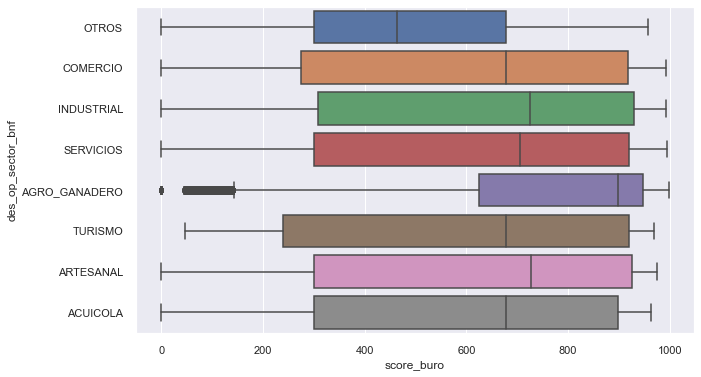

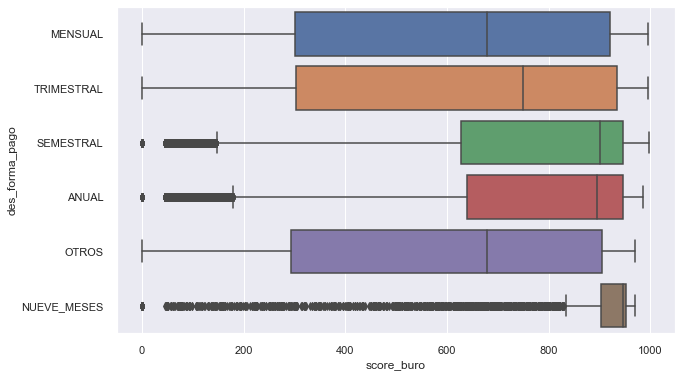

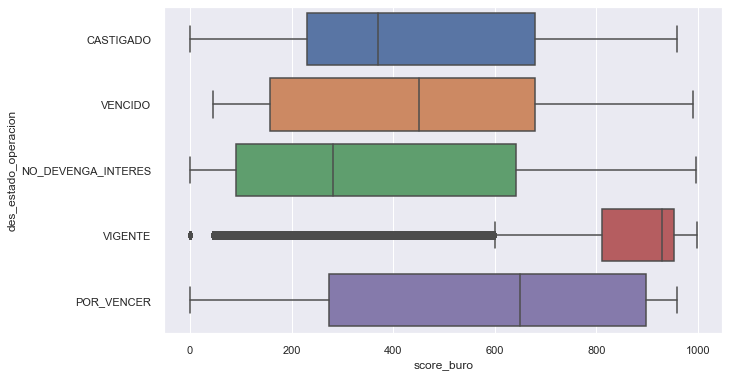

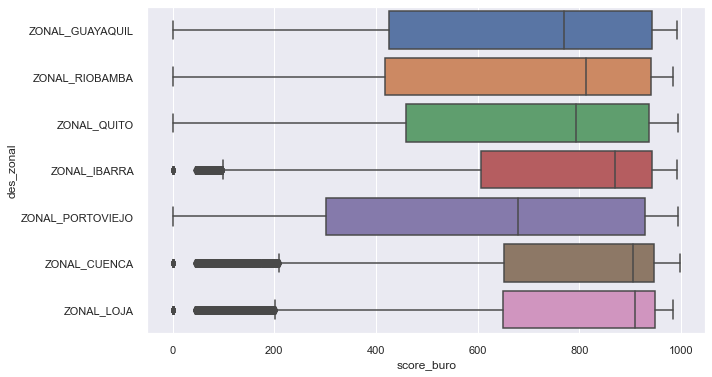

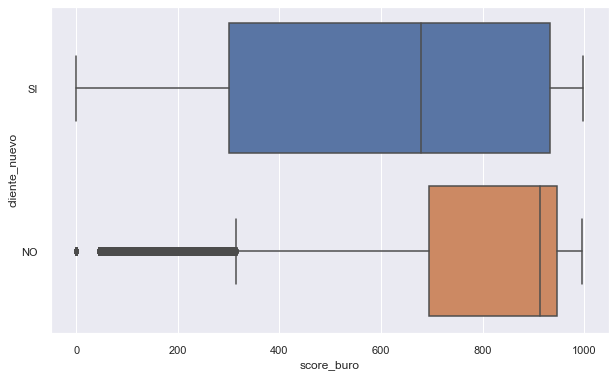

...

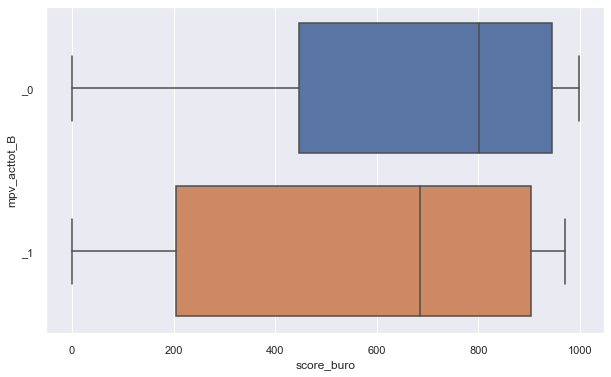

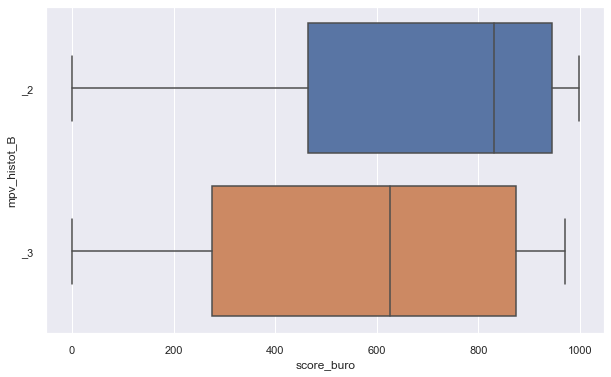

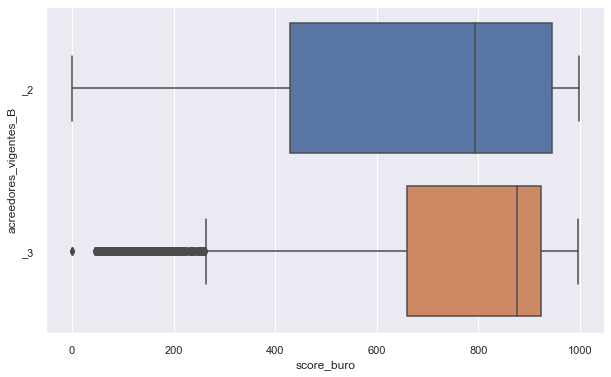

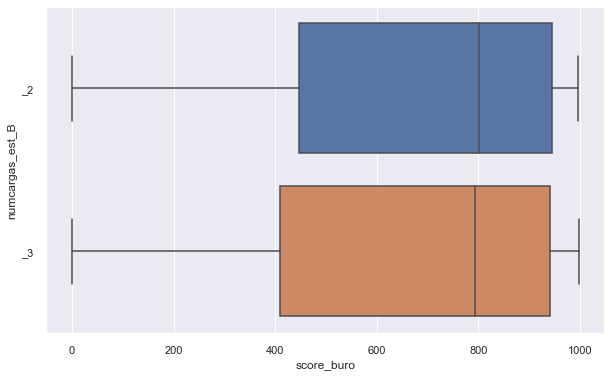

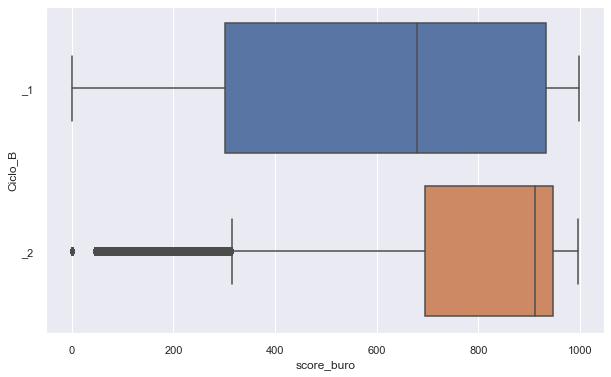

In [442]:
sns.set(rc={"figure.figsize":(10, 6)})
for column in df_categorico.select_dtypes(include='object'):
  if df_categorico[column].nunique() < 20:
   sns.boxplot(y=column, x=df_cliente['score_buro'], data=df_categorico)
  plt.show()

In [443]:
print(list(df_categorico.columns))

['des_op_sector_bnf', 'des_forma_pago', 'des_estado_operacion', 'des_zonal', 'cliente_nuevo', 'cliente_bancarizado', 'calificacion_score', 'ca_tip_garantia_categ', 'peor_calificacion', 'cartera_heredada', 'Micro_60', 'des_sexo', 'des_estado_civil', 'des_nivel_instruccion', 'es_jefe_hogar', 'des_origen_ingresos', 'des_sector', 'tipo_vivienda', 'des_situacion_laboral', 'act_pas_quintil', 'ing_gas_quintil', 'tamano_ventas', 'edad_B', 'monto_B', 'sueldo_B', 'antlab_B', 'antcli_B', 'antiresid_B', 'numperiodos_B', 'plazomeses_B', 'cuotestburo_B', 'endeudprom_B', 'mvv_acttot_B', 'mpv_acttot_B', 'mpv_histot_B', 'acreedores_vigentes_B', 'numcargas_est_B', 'Ciclo_B']


### DataFrame Categorico Inicial

In [492]:
df_categorico_2 =  pd.DataFrame()
df_categorico_2['des_op_sector_bnf']=df_categorico['des_op_sector_bnf'].values
df_categorico_2['des_zonal']=df_categorico['des_zonal'].values
df_categorico_2['des_forma_pago']=df_categorico['des_forma_pago'].values
df_categorico_2['cartera_heredada']=df_categorico['cartera_heredada'].values
df_categorico_2['des_estado_civil']=df_categorico['des_estado_civil'].values
df_categorico_2['es_jefe_hogar']=df_categorico['es_jefe_hogar'].values
df_categorico_2['des_sexo']=df_categorico['des_sexo'].values
#df_categorico_2['cliente_bancarizado']=df_categorico['cliente_bancarizado'].values
#df_categorico_2['ca_tip_garantia_categ']=df_categorico['ca_tip_garantia_categ'].values
#df_categorico_2['des_situacion_laboral']=df_categorico['des_situacion_laboral'].values # ama de casa
#df_categorico_2['des_origen_ingresos']=df_categorico['des_origen_ingresos'].values     # ama de cada
df_categorico_2['tipo_vivienda']=df_categorico['tipo_vivienda'].values
df_categorico_2['des_nivel_instruccion']=df_categorico['des_nivel_instruccion'].values
df_categorico_2['edad_B']=df_categorico['edad_B'].values
#df_categorico_2['antlab_B']=df_categorico['antlab_B'].values
#df_categorico_2['antcli_B']=df_categorico['antcli_B'].values
df_categorico_2['monto_B']=df_categorico['monto_B'].values
df_categorico_2['sueldo_B']=df_categorico['sueldo_B'].values
#df_categorico_2['antiresid_B']=df_categorico['antiresid_B'].values
df_categorico_2['Ciclo_B']=df_categorico['Ciclo_B'].values
df_categorico_2['cliente_nuevo']=df_categorico['cliente_nuevo'].values
df_categorico_2['des_sector']=df_categorico['des_sector'].values
df_categorico_2['tamano_ventas']=df_categorico['tamano_ventas'].values
df_categorico_2['ing_gas_quintil']=df_categorico['ing_gas_quintil'].values
df_categorico_2['act_pas_quintil']=df_categorico['act_pas_quintil'].values
df_categorico_2['cuotestburo_B']=df_categorico['cuotestburo_B'].values
df_categorico_2['endeudprom_B']=df_categorico['endeudprom_B'].values
df_categorico_2['numperiodos_B']=df_categorico['numperiodos_B'].values
df_categorico_2['plazomeses_B']=df_categorico['plazomeses_B'].values
df_categorico_2['mpv_acttot_B']=df_categorico['mpv_acttot_B'].values
df_categorico_2['mpv_histot_B']=df_categorico['mpv_histot_B'].values
df_categorico_2['mvv_acttot_B']=df_categorico['mvv_acttot_B'].values
df_categorico_2['numcargas_est_B']=df_categorico['numcargas_est_B'].values
df_categorico_2['acreedores_vigentes_B']=df_categorico['acreedores_vigentes_B'].values  # Revisar
df_categorico_2['Micro_60']=df_categorico['Micro_60'].values
df_categorico_2.head(2)


#df_categorico_2['des_estado_operacion']=df_categorico['des_estado_operacion'].values
#df_categorico_2['analisis_riesgo']=df_categorico['analisis_riesgo'].values


#df_categorico_2['indicador_vencido']=df_categorico['indicador_vencido'].values
#df_categorico_2['bandera_reestructurado']=df_categorico['bandera_reestructurado'].values
#df_categorico_2['bandera_Demanda_Judicial']=df_categorico['bandera_Demanda_Judicial'].values
#df_categorico_2['bandera_castigado']=df_categorico['bandera_castigado'].values
#df_categorico_2['bandera_condonado']=df_categorico['bandera_condonado'].values

,des_op_sector_bnf,des_zonal,des_forma_pago,cartera_heredada,des_estado_civil,es_jefe_hogar,des_sexo,tipo_vivienda,des_nivel_instruccion,edad_B,monto_B,sueldo_B,Ciclo_B,cliente_nuevo,des_sector,tamano_ventas,ing_gas_quintil,act_pas_quintil,cuotestburo_B,endeudprom_B,numperiodos_B,plazomeses_B,mpv_acttot_B,mpv_histot_B,mvv_acttot_B,numcargas_est_B,acreedores_vigentes_B,Micro_60
0,OTROS,ZONAL_GUAYAQUIL,MENSUAL,SI,SOL_VIU_DIVO,N,FEMENINO,VIVE_CON_FAMILIARES,MEDIA,_45_55,_3000,_400,_1,SI,SECTOR_URBANO,_1161,_1449,_11813,_122,_0,_12_35,_24,_0,_2,_0,_2,_2,MALO
1,COMERCIO,ZONAL_GUAYAQUIL,MENSUAL,NO,SOL_VIU_DIVO,S,FEMENINO,VIVE_CON_FAMILIARES,BASICA,_35_45,_3000_5000,_1250,_1,SI,SECTOR_URBANO,_2500_46000,_1448,_472_1444,_122,_0,_12_35,_24,_0,_3,_0,_2,_2,MALO


In [493]:
#pd.crosstab(df_cliente['Ciclo_B'],df_cliente['Micro_60'])

### Tasa de Exito  Var Categoricas

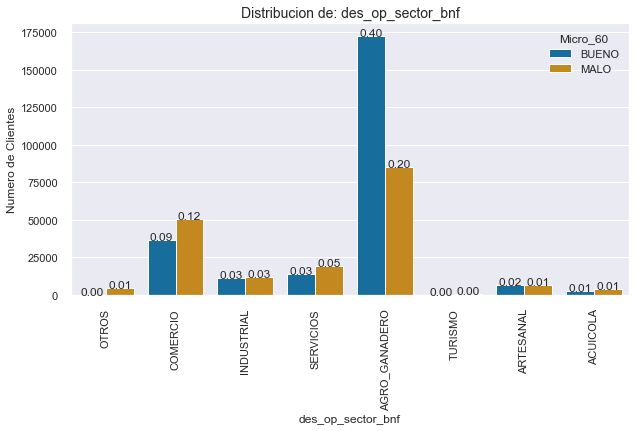

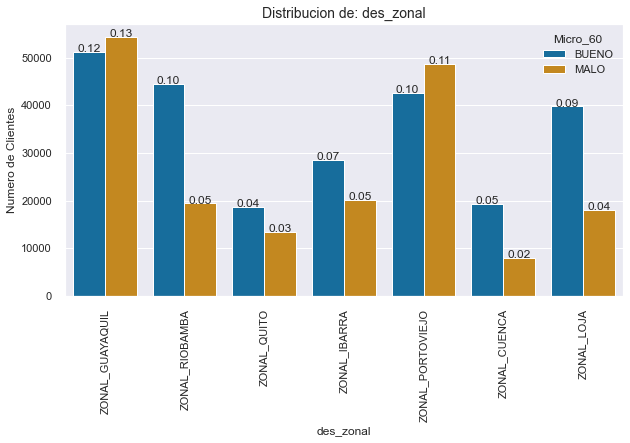

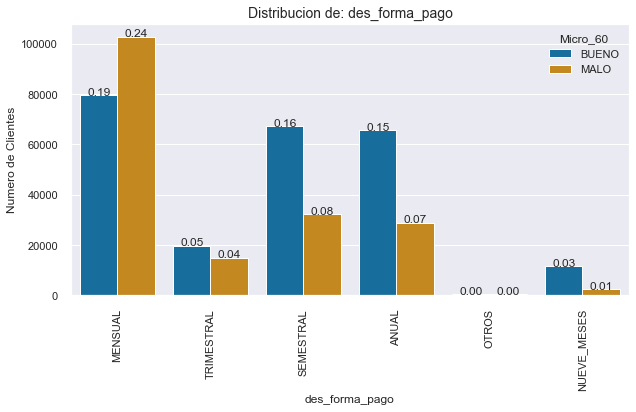

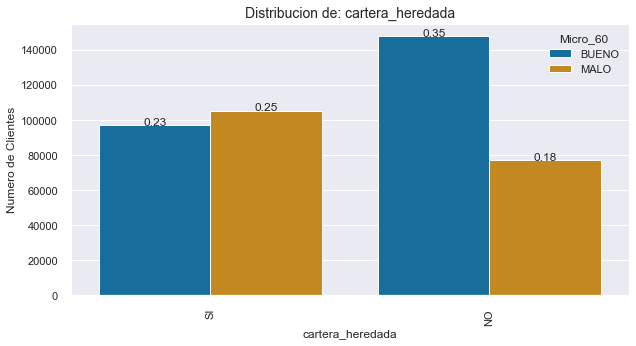

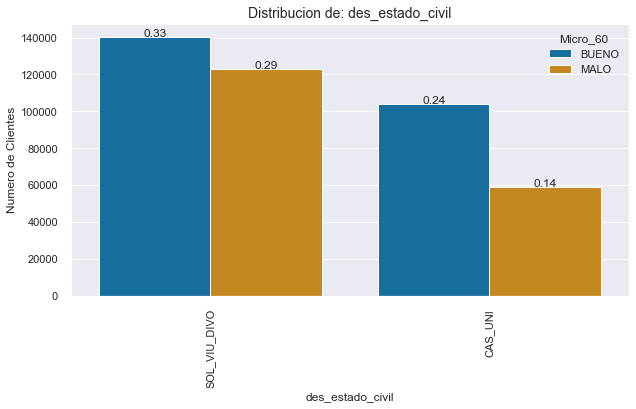

...

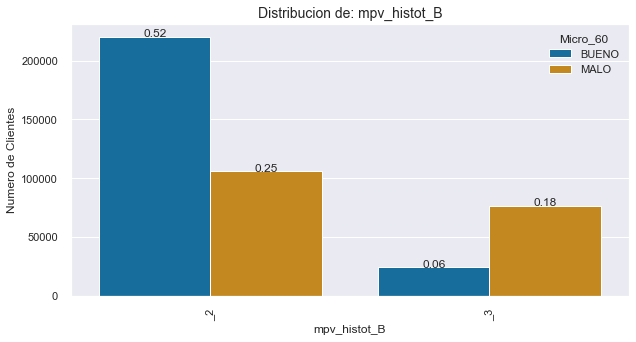

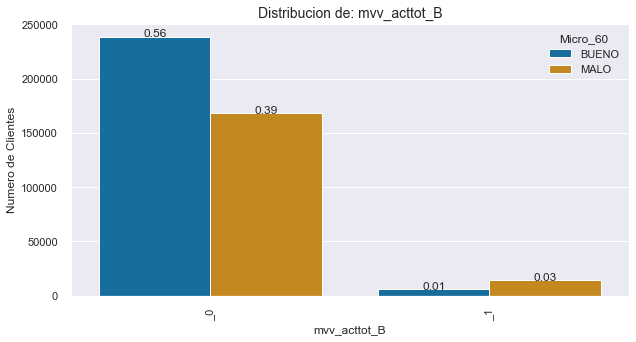

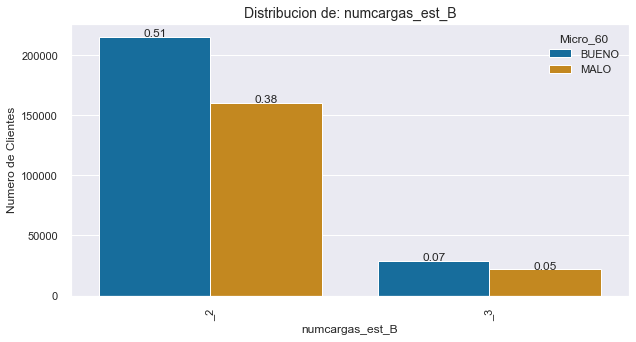

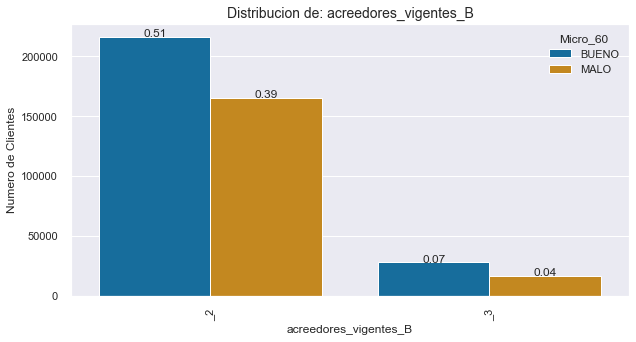

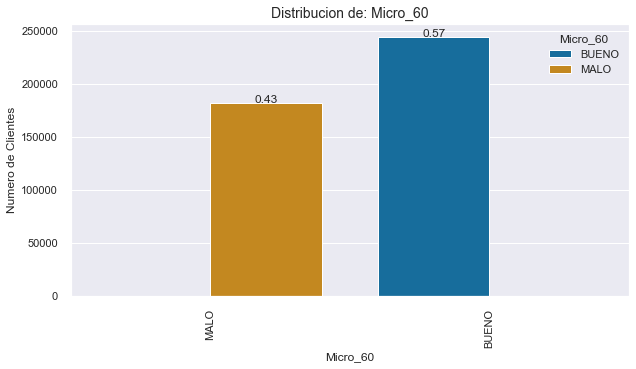

In [494]:
df = df_categorico_2
sns.set(rc={"figure.figsize":(10, 5)})
#fig, plt.subplots(figsize=(10, 15))
for var in df_categorico_2:
    ax = sns.countplot(x = df[var], data = df, hue = 'Micro_60',hue_order= ['BUENO','MALO'],  palette = 'colorblind')
    total = float(len(df[var])) 
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,height + 10,'{:1.2f}'.format(height/total),ha="center")
    plt.title('Distribucion de: ' + str(var), fontsize = 14)
    plt.ylabel('Numero de Clientes')
#    plt.figtext(0.55, 0.01, 'Decimal above bar is proportion of total in that class',horizontalalignment = 'center', fontsize = 8,style = 'italic')
    plt.xticks(rotation = 90)
#    plt.tight_layout()
#    plt.savefig('plot_dist-' + str(var) + '.png', dpi = 200)
    plt.show()

In [495]:
df_categorico_2.shape

(426508, 28)

In [496]:
tt = pd.melt(df_categorico_2, id_vars=['Micro_60'], value_vars=df_categorico_2[df_categorico_2.columns[1:27 ]],
             var_name='variable1', value_name='event')
## concatenate two colums to create a descriptive variable name
tt['variable2'] = tt['variable1'] +'_'+tt['event']
mt1 = pd.crosstab(tt.Micro_60, tt.variable2, normalize='columns').T.add_prefix('Cat_')
mt2 = mt1.assign(**mt1.index.to_frame()).sort_values(['Cat_MALO'],ascending=False)
mt2.head(60)

Micro_60,Cat_BUENO,Cat_MALO,variable2
variable2,,,
mpv_histot_B__3,0.238672,0.761328,mpv_histot_B__3
mvv_acttot_B__1,0.288389,0.711611,mvv_acttot_B__1
mpv_acttot_B__1,0.288403,0.711597,mpv_acttot_B__1
des_forma_pago_OTROS,0.402323,0.597677,des_forma_pago_OTROS
des_forma_pago_MENSUAL,0.436445,0.563555,des_forma_pago_MENSUAL
numperiodos_B__35,0.451921,0.548079,numperiodos_B__35
numperiodos_B__12_35,0.465302,0.534698,numperiodos_B__12_35
des_zonal_ZONAL_PORTOVIEJO,0.465836,0.534164,des_zonal_ZONAL_PORTOVIEJO
act_pas_quintil__472,0.479128,0.520872,act_pas_quintil__472


In [497]:
mt2.describe()

Micro_60,Cat_BUENO,Cat_MALO
count,83.000000,83.000000
mean,0.572910,0.427090
std,0.091527,0.091527
min,0.238672,0.180659
25%,0.538027,0.383592
50%,0.581244,0.418756
75%,0.616408,0.461973
max,0.819341,0.761328


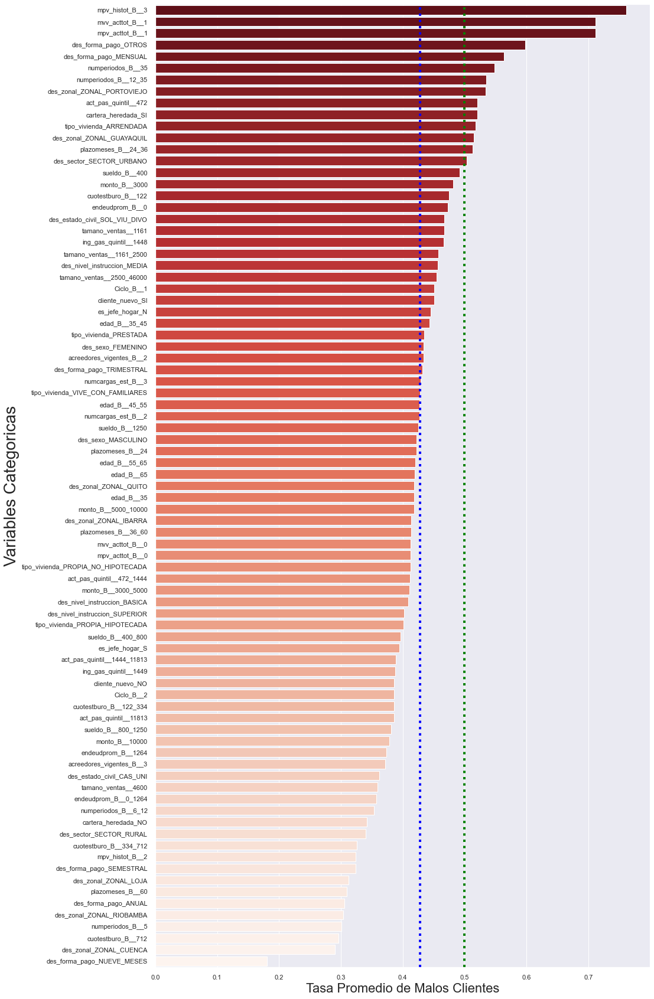

In [498]:
fig, plt.subplots(figsize = (15,30))
ax = sns.barplot(y='variable2', x= 'Cat_MALO', data=mt2, palette = "Reds_r")
t1 = sns.set_style('whitegrid')
plt.xlabel('Tasa Promedio de Malos Clientes', fontsize=22)
plt.ylabel('Variables Categoricas', fontsize=28)
plt.axvline(0.4285, ls=":", lw=4, color='blue')
plt.axvline(0.5, ls=":",linewidth = 4, color ='green')
plt.show()

### Encoder 

In [499]:
encoder = []
one_hot = []

for i in df_categorico_2.columns:
    if len(df_categorico_2[i].value_counts().index)>20:  # No se Escoge más de 5 Niveles
        encoder.append(i)
    else:
        one_hot.append(i)
        print (i, len(df_categorico_2[i].value_counts(ascending=True).sort_values(ascending=True).index))

des_op_sector_bnf 8
des_zonal 7
des_forma_pago 6
cartera_heredada 2
des_estado_civil 2
es_jefe_hogar 2
des_sexo 2
tipo_vivienda 5
des_nivel_instruccion 3
edad_B 5
monto_B 4
sueldo_B 4
Ciclo_B 2
cliente_nuevo 2
des_sector 2
tamano_ventas 4
ing_gas_quintil 2
act_pas_quintil 4
cuotestburo_B 4
endeudprom_B 3
numperiodos_B 4
plazomeses_B 4
mpv_acttot_B 2
mpv_histot_B 2
mvv_acttot_B 2
numcargas_est_B 2
acreedores_vigentes_B 2
Micro_60 2


In [500]:
# Traer de Excel
vector_cat = ['des_op_sector_bnf',
'des_zonal',
'des_forma_pago',
'tipo_vivienda',
'edad_B',
'monto_B',
'sueldo_B',
'tamano_ventas',
'act_pas_quintil',
'cuotestburo_B',
'numperiodos_B',
'plazomeses_B',
'des_nivel_instruccion',
'endeudprom_B']

vector_binario = ['cartera_heredada',
'des_estado_civil',
'es_jefe_hogar',
'des_sexo',
'Ciclo_B',
'cliente_nuevo',
'des_sector',
'ing_gas_quintil',
'mpv_acttot_B',
'mpv_histot_B',
'mvv_acttot_B',
'numcargas_est_B',
'acreedores_vigentes_B',
'Micro_60']

In [501]:
lista_variables = vector_binario + vector_cat
print(lista_variables)

['cartera_heredada', 'des_estado_civil', 'es_jefe_hogar', 'des_sexo', 'Ciclo_B', 'cliente_nuevo', 'des_sector', 'ing_gas_quintil', 'mpv_acttot_B', 'mpv_histot_B', 'mvv_acttot_B', 'numcargas_est_B', 'acreedores_vigentes_B', 'Micro_60', 'des_op_sector_bnf', 'des_zonal', 'des_forma_pago', 'tipo_vivienda', 'edad_B', 'monto_B', 'sueldo_B', 'tamano_ventas', 'act_pas_quintil', 'cuotestburo_B', 'numperiodos_B', 'plazomeses_B', 'des_nivel_instruccion', 'endeudprom_B']


In [502]:
df_categorico_2_dummies.drop(df_categorico_2_dummies.index, inplace=True)
df_categorico_2_dummies

,des_op_sector_bnf,des_zonal,des_forma_pago,tipo_vivienda,des_nivel_instruccion,edad_B,monto_B,sueldo_B,tamano_ventas,act_pas_quintil,cuotestburo_B,endeudprom_B,numperiodos_B,plazomeses_B,cartera_heredada_SI,des_estado_civil_SOL_VIU_DIVO,es_jefe_hogar_S,des_sexo_MASCULINO,Ciclo_B__2,cliente_nuevo_SI,des_sector_SECTOR_URBANO,ing_gas_quintil__1449,mpv_acttot_B__1,mpv_histot_B__3,mvv_acttot_B__1,numcargas_est_B__3,acreedores_vigentes_B__3,Micro_60_MALO


In [503]:
# Listar las variables Binarias
#df_categorico_2_dummies pd.get_dummies(df_categorico_2.des_sexo, drop_first=True)
var_binarias = vector_binario
df_categorico_2_dummies = pd.get_dummies(df_categorico_2, columns = var_binarias, drop_first=True)
df_categorico_2_dummies.head(2)

,des_op_sector_bnf,des_zonal,des_forma_pago,tipo_vivienda,des_nivel_instruccion,edad_B,monto_B,sueldo_B,tamano_ventas,act_pas_quintil,cuotestburo_B,endeudprom_B,numperiodos_B,plazomeses_B,cartera_heredada_SI,des_estado_civil_SOL_VIU_DIVO,es_jefe_hogar_S,des_sexo_MASCULINO,Ciclo_B__2,cliente_nuevo_SI,des_sector_SECTOR_URBANO,ing_gas_quintil__1449,mpv_acttot_B__1,mpv_histot_B__3,mvv_acttot_B__1,numcargas_est_B__3,acreedores_vigentes_B__3,Micro_60_MALO
0,OTROS,ZONAL_GUAYAQUIL,MENSUAL,VIVE_CON_FAMILIARES,MEDIA,_45_55,_3000,_400,_1161,_11813,_122,_0,_12_35,_24,1,1,0,0,0,1,1,1,0,0,0,0,0,1
1,COMERCIO,ZONAL_GUAYAQUIL,MENSUAL,VIVE_CON_FAMILIARES,BASICA,_35_45,_3000_5000,_1250,_2500_46000,_472_1444,_122,_0,_12_35,_24,0,1,1,0,0,1,1,0,0,1,0,0,0,1


In [504]:
df_categorico_2_total.drop(df_categorico_2_total.index, inplace=True)
df_categorico_2_total

,cartera_heredada_SI,des_estado_civil_SOL_VIU_DIVO,es_jefe_hogar_S,des_sexo_MASCULINO,Ciclo_B__2,cliente_nuevo_SI,des_sector_SECTOR_URBANO,ing_gas_quintil__1449,mpv_acttot_B__1,mpv_histot_B__3,mvv_acttot_B__1,numcargas_est_B__3,acreedores_vigentes_B__3,Micro_60_MALO,des_op_sector_bnf_ACUICOLA,des_op_sector_bnf_AGRO_GANADERO,des_op_sector_bnf_ARTESANAL,des_op_sector_bnf_COMERCIO,des_op_sector_bnf_INDUSTRIAL,des_op_sector_bnf_OTROS,des_op_sector_bnf_SERVICIOS,des_op_sector_bnf_TURISMO,des_zonal_ZONAL_CUENCA,des_zonal_ZONAL_GUAYAQUIL,des_zonal_ZONAL_IBARRA,des_zonal_ZONAL_LOJA,des_zonal_ZONAL_PORTOVIEJO,des_zonal_ZONAL_QUITO,des_zonal_ZONAL_RIOBAMBA,des_forma_pago_ANUAL,des_forma_pago_MENSUAL,des_forma_pago_NUEVE_MESES,des_forma_pago_OTROS,des_forma_pago_SEMESTRAL,des_forma_pago_TRIMESTRAL,tipo_vivienda_ARRENDADA,tipo_vivienda_PRESTADA,tipo_vivienda_PROPIA_HIPOTECADA,tipo_vivienda_PROPIA_NO_HIPOTECADA,tipo_vivienda_VIVE_CON_FAMILIARES,edad_B__35,edad_B__35_45,edad_B__45_55,edad_B__55_65,edad_B__65,monto_B__10000,monto_B__3000,monto_B__3000_5000,monto_B__5000_10000,sueldo_B__1250,sueldo_B__400,sueldo_B__400_800,sueldo_B__800_1250,tamano_ventas__1161,tamano_ventas__1161_2500,tamano_ventas__2500_46000,tamano_ventas__4600,act_pas_quintil__11813,act_pas_quintil__1444_11813,act_pas_quintil__472,act_pas_quintil__472_1444,cuotestburo_B__122,cuotestburo_B__122_334,cuotestburo_B__334_712,cuotestburo_B__712,numperiodos_B__12_35,numperiodos_B__35,numperiodos_B__5,numperiodos_B__6_12,plazomeses_B__24,plazomeses_B__24_36,plazomeses_B__36_60,plazomeses_B__60,des_nivel_instruccion_BASICA,des_nivel_instruccion_MEDIA,des_nivel_instruccion_SUPERIOR,endeudprom_B__0,endeudprom_B__0_1264,endeudprom_B__1264,ente,fecha_originacion,score_buro,calificacion_score,peor_calificacion,porcentaje_cancelacion_saldo,porcentaje_cancelacion


In [505]:
## One-hot encode multi-category cat. variables
multicat_vars = vector_cat
df_categorico_2_total = pd.get_dummies(df_categorico_2_dummies, columns = multicat_vars)
#df_enc.iloc[:,16:26] = df_enc.iloc[:,16:26].astype(int)
df_categorico_2_total.head(2)

,cartera_heredada_SI,des_estado_civil_SOL_VIU_DIVO,es_jefe_hogar_S,des_sexo_MASCULINO,Ciclo_B__2,cliente_nuevo_SI,des_sector_SECTOR_URBANO,ing_gas_quintil__1449,mpv_acttot_B__1,mpv_histot_B__3,mvv_acttot_B__1,numcargas_est_B__3,acreedores_vigentes_B__3,Micro_60_MALO,des_op_sector_bnf_ACUICOLA,des_op_sector_bnf_AGRO_GANADERO,des_op_sector_bnf_ARTESANAL,des_op_sector_bnf_COMERCIO,des_op_sector_bnf_INDUSTRIAL,des_op_sector_bnf_OTROS,des_op_sector_bnf_SERVICIOS,des_op_sector_bnf_TURISMO,des_zonal_ZONAL_CUENCA,des_zonal_ZONAL_GUAYAQUIL,des_zonal_ZONAL_IBARRA,des_zonal_ZONAL_LOJA,des_zonal_ZONAL_PORTOVIEJO,des_zonal_ZONAL_QUITO,des_zonal_ZONAL_RIOBAMBA,des_forma_pago_ANUAL,des_forma_pago_MENSUAL,des_forma_pago_NUEVE_MESES,des_forma_pago_OTROS,des_forma_pago_SEMESTRAL,des_forma_pago_TRIMESTRAL,tipo_vivienda_ARRENDADA,tipo_vivienda_PRESTADA,tipo_vivienda_PROPIA_HIPOTECADA,tipo_vivienda_PROPIA_NO_HIPOTECADA,tipo_vivienda_VIVE_CON_FAMILIARES,edad_B__35,edad_B__35_45,edad_B__45_55,edad_B__55_65,edad_B__65,monto_B__10000,monto_B__3000,monto_B__3000_5000,monto_B__5000_10000,sueldo_B__1250,sueldo_B__400,sueldo_B__400_800,sueldo_B__800_1250,tamano_ventas__1161,tamano_ventas__1161_2500,tamano_ventas__2500_46000,tamano_ventas__4600,act_pas_quintil__11813,act_pas_quintil__1444_11813,act_pas_quintil__472,act_pas_quintil__472_1444,cuotestburo_B__122,cuotestburo_B__122_334,cuotestburo_B__334_712,cuotestburo_B__712,numperiodos_B__12_35,numperiodos_B__35,numperiodos_B__5,numperiodos_B__6_12,plazomeses_B__24,plazomeses_B__24_36,plazomeses_B__36_60,plazomeses_B__60,des_nivel_instruccion_BASICA,des_nivel_instruccion_MEDIA,des_nivel_instruccion_SUPERIOR,endeudprom_B__0,endeudprom_B__0_1264,endeudprom_B__1264
0,1,1,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0
1,0,1,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0


In [506]:
#pd.crosstab(df_categorico_2_dummies['Micro_60_MALO'], df_categorico_2['Micro_60'])

In [507]:
#pd.crosstab(df_categorico_2_dummies['des_sexo_MASCULINO'], df_categorico_2['des_sexo'])

### Chi-Square Test de Independencia entre variables categoricas y variable objetivo

In [508]:
#var_binarias = ['des_sector', 'cliente_nuevo','sueldo_B','ventas_quintil','act_pas_quintil','monto_B','Micro_60']
#from scipy.stats import chi2_contingency
#Testing the relationship
#chi_res = chi2_contingency(pd.crosstab(df_categorico_2['Micro_60'], df_categorico_2['acreedores_vigentes_B']))
#print('Chi2 Statistic: {}, p-value: {}'.format(chi_res[0], chi_res[1]))

In [509]:
# crear el df de categoricas sin la variable objetivo
categorical_columns = df_categorico_2.select_dtypes(exclude = 'number').drop('Micro_60', axis = 1).columns

In [510]:
# fail to reject the Null Hypothesis. This means, there is no relationship between the des_Sexo and objetive variable feature based on the Chi-Square test of independence.
from scipy.stats import chi2_contingency
chi2_check = []
for i in categorical_columns:
    if chi2_contingency(pd.crosstab(df_categorico_2['Micro_60'], df_categorico_2[i]))[1] < 0.05:
        chi2_check.append('Reject Null Hypothesis')
    else:
        chi2_check.append('Fail to Reject Null Hypothesis')
        
res = pd.DataFrame(data = [categorical_columns, chi2_check]).T 
res.columns = ['Column', 'Hypothesis']
print(res)        

                   Column                      Hypothesis
0       des_op_sector_bnf          Reject Null Hypothesis
1               des_zonal          Reject Null Hypothesis
2          des_forma_pago          Reject Null Hypothesis
3        cartera_heredada          Reject Null Hypothesis
4        des_estado_civil          Reject Null Hypothesis
5           es_jefe_hogar          Reject Null Hypothesis
6                des_sexo          Reject Null Hypothesis
7           tipo_vivienda          Reject Null Hypothesis
8   des_nivel_instruccion          Reject Null Hypothesis
9                  edad_B          Reject Null Hypothesis
10                monto_B          Reject Null Hypothesis
11               sueldo_B          Reject Null Hypothesis
12                Ciclo_B          Reject Null Hypothesis
13          cliente_nuevo          Reject Null Hypothesis
14             des_sector          Reject Null Hypothesis
15          tamano_ventas          Reject Null Hypothesis
16        ing_

In [511]:
#Se corrige por bonferroni y evaluamos cada categoria de las variable vs la variable objetivo , con el fin de corregir falsos positivos

check = {}
for i in res[res['Hypothesis'] == 'Reject Null Hypothesis']['Column']:
    dummies = pd.get_dummies(df_categorico_2[i])
    bon_p_value = 0.05/df_categorico_2[i].nunique()
    for series in dummies:
        if chi2_contingency(pd.crosstab(df_categorico_2['Micro_60'], dummies[series]))[1] < bon_p_value:
            check['{}-{}'.format(i, series)] = 'Reject Null Hypothesis'
        else:
            check['{}-{}'.format(i, series)] = 'Fail to Reject Null Hypothesis'
res_chi_ph = pd.DataFrame(data = [check.keys(), check.values()]).T
res_chi_ph.columns = ['Category', 'Hypothesis']

pd.set_option('max_colwidth', 1000)
#res_chi_ph['Pair'] =res_chi_ph['colPairumn_name'].str[:width]
res_chi_ph = res_chi_ph.sort_values(by='Hypothesis', ascending=True)
res_chi_ph.head(60)

,Category,Hypothesis
46,sueldo_B-_1250,Fail to Reject Null Hypothesis
20,des_forma_pago-TRIMESTRAL,Fail to Reject Null Hypothesis
30,tipo_vivienda-PRESTADA,Fail to Reject Null Hypothesis
39,edad_B-_45_55,Fail to Reject Null Hypothesis
33,tipo_vivienda-VIVE_CON_FAMILIARES,Fail to Reject Null Hypothesis
50,Ciclo_B-_1,Reject Null Hypothesis
48,sueldo_B-_400_800,Reject Null Hypothesis
63,act_pas_quintil-_1444_11813,Reject Null Hypothesis
62,act_pas_quintil-_11813,Reject Null Hypothesis
61,ing_gas_quintil-_1449,Reject Null Hypothesis


https://github.com/K2Analytics/py/blob/master/k2_iv_woe_function.py

* WOE describes the relationship between an attribute value and a binary target variable; 
* the Information Value (IV) measures the predictive power of a characteristic, i.e., to what extent it can be used to separate observations with from those with . 
* IV is a weighted sum of the WOE values:

In [512]:
woe_def = pd.DataFrame({"Poder Predictivo":['Sin Uso', 'Predictor Debil', 'Predictor Medio', 'Predictor Fuerte', 'Muy Sospechoso'], "Information Value":['<0.02','0.02 hasta 0.1', '0.1 hasta 0.3', '0.3 hasta 0.5', '>0.5'] })
woe_def

,Poder Predictivo,Information Value
0,Sin Uso,<0.02
1,Predictor Debil,0.02 hasta 0.1
2,Predictor Medio,0.1 hasta 0.3
3,Predictor Fuerte,0.3 hasta 0.5
4,Muy Sospechoso,>0.5


### WOE

In [513]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [514]:
data  = df_categorico_2_total
for col in data.columns:
    if col == 'Micro_60_MALO': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(data, col, 'Micro_60_MALO')
        print(df)
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: cartera_heredada_SI
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      1  202102   96862  105240    0.396298   0.577953 -0.377325  0.068543
1      0  224406  147555   76851    0.603702   0.422047  0.357963  0.065026
IV score: 0.13


WoE and IV for column: des_estado_civil_SOL_VIU_DIVO
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      1  263630  140486  123144     0.57478   0.676277 -0.162616  0.016505
1      0  162878  103931   58947     0.42522   0.323723  0.272719  0.027680
IV score: 0.04


WoE and IV for column: es_jefe_hogar_S
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  272543  151227  121316    0.618725   0.666238 -0.073986  0.003515
1      1  153965   93190   60775    0.381275   0.333762  0.133093  0.006324
IV score: 0.01


WoE and IV for column: des_sexo_MASCULINO
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  17

   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  332044  178817  153227    0.731606   0.841486 -0.139927  0.015375
1      1   94464   65600   28864    0.268394   0.158514  0.526611  0.057864
IV score: 0.07


WoE and IV for column: des_forma_pago_MENSUAL
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      1  182557   79676  102881    0.325984   0.564998 -0.549974  0.131451
1      0  243951  164741   79210    0.674016   0.435002  0.437903  0.104665
IV score: 0.24


WoE and IV for column: des_forma_pago_NUEVE_MESES
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  412310  232784  179526    0.952405   0.985914 -0.034578  0.001159
1      1   14198   11633    2565    0.047595   0.014086  1.217518  0.040797
IV score: 0.04


WoE and IV for column: des_forma_pago_OTROS
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
1      1     947     381     566    0.001559   0.

   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  319881  179302  140579    0.733591   0.772026 -0.051067  0.001963
1      1  106627   65115   41512    0.266409   0.227974  0.155803  0.005988
IV score: 0.01


WoE and IV for column: act_pas_quintil__472
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
1      1  106627   51088   55539     0.20902   0.305007 -0.377905  0.036274
0      0  319881  193329  126552     0.79098   0.694993  0.129371  0.012418
IV score: 0.05


WoE and IV for column: act_pas_quintil__472_1444
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      0  319881  181690  138191    0.743361   0.758912 -0.020704  0.000322
1      1  106627   62727   43900    0.256639   0.241088  0.062508  0.000972
IV score: 0.00


WoE and IV for column: cuotestburo_B__122
   Value     All    Good     Bad  Distr_Good  Distr_Bad       WoE        IV
0      1  279946  147075  132871    0.601738   0.72969

In [515]:
woe_def = pd.DataFrame({"Poder Predictivo":['Sin Uso', 'Predictor Debil', 'Predictor Medio', 'Predictor Fuerte', 'Muy Sospechoso'], "Information Value":['<0.02','0.02 hasta 0.1', '0.1 hasta 0.3', '0.3 hasta 0.5', '>0.5'] })
woe_def

,Poder Predictivo,Information Value
0,Sin Uso,<0.02
1,Predictor Debil,0.02 hasta 0.1
2,Predictor Medio,0.1 hasta 0.3
3,Predictor Fuerte,0.3 hasta 0.5
4,Muy Sospechoso,>0.5


### Correlaciones Categoricas

In [516]:
correlated_features = set()
correlation_matrix = df_categorico_2_total.drop('Micro_60_MALO', axis=1).corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.6:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)
            
correlated_features

{'cliente_nuevo_SI',
 'des_forma_pago_MENSUAL',
 'des_nivel_instruccion_MEDIA',
 'des_op_sector_bnf_COMERCIO',
 'endeudprom_B__1264',
 'mvv_acttot_B__1',
 'numperiodos_B__35',
 'numperiodos_B__5',
 'tipo_vivienda_VIVE_CON_FAMILIARES'}

Most Positive Correlations: 
 mpv_histot_B__3                      0.375207
des_forma_pago_MENSUAL               0.238936
cartera_heredada_SI                  0.179951
des_sector_SECTOR_URBANO             0.164404
des_op_sector_bnf_COMERCIO           0.154242
numperiodos_B__35                    0.150690
cuotestburo_B__122                   0.133269
mpv_acttot_B__1                      0.127233
mvv_acttot_B__1                      0.127219
des_zonal_ZONAL_PORTOVIEJO           0.113134
des_op_sector_bnf_OTROS              0.110883
act_pas_quintil__472                 0.109646
endeudprom_B__0                      0.107019
numperiodos_B__12_35                 0.104826
des_estado_civil_SOL_VIU_DIVO        0.103332
des_zonal_ZONAL_GUAYAQUIL            0.102073
plazomeses_B__24_36                  0.097913
des_op_sector_bnf_SERVICIOS          0.090181
sueldo_B__400                        0.081162
monto_B__3000                        0.070314
cliente_nuevo_SI                     0.062645
tipo

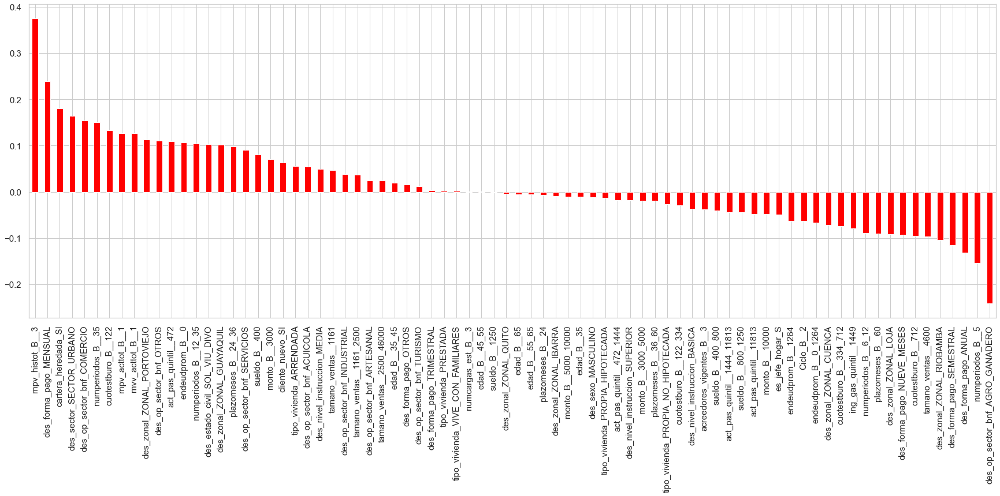

In [517]:
correlations = df_categorico_2_total.corrwith(df_categorico_2_total.Micro_60_MALO)
correlations = correlations[correlations!=1]
positive_correlations = correlations[ correlations >0].sort_values(ascending = False)
negative_correlations = correlations[correlations<0].sort_values(ascending = False)
correlations.sort_values(ascending=False).plot.bar(figsize = (30, 10), fontsize = 15, color = 'red',rot = 90, grid = True)
print('Most Positive Correlations: \n', positive_correlations)
print('\nMost Negative Correlations: \n', negative_correlations)

### Inflacion de Varianza - VIF - No para variables categoricas 

In [1543]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
# Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) 
    for i in range(X.shape[1])]
    return(vif)

In [1544]:
dataset2 = df_categorico_2_total
calc_vif(dataset2)

,variables,VIF
0,des_estado_civil_SOL_VIU_DIVO,1.073240e+00
1,cliente_nuevo_SI,1.080112e+00
2,des_sector_SECTOR URBANO,1.302447e+00
3,ventas_quintil_> 6500,1.141345e+00
4,ing_gas_quintil_> Prom 3757,1.074291e+00
5,act_pas_quintil_> 4.72,1.136904e+00
6,endeudprom_B_> 1264,1.153294e+00
7,Micro_60_MALO,1.139156e+00
8,des_op_sector_bnf_ACUICOLA,3.116678e+13
9,des_op_sector_bnf_AGRO_GANADERO,1.970712e+09


In [518]:
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [431]:
'''# Generando las bases de entrenamiento y test, con el método "train_test_split" del paquete sklearn.
# usando una semilla 5, un 70% para la base de entrenamiento y 30% para el resto

#X_train, X_test, y_train, y_test = train_test_split(df_desarrollo, df_desarrollo["Micro_60"], random_state=5, train_size=0.7)

r1 = df_categorico_2_total.Micro_60.count()
r2 = df_categorico_2_total.Micro_60.count()

#del X_train["Micro_60"]
#del X_test["Micro_60"]

#print(df_cliente.shape)


print("\n***********************************************************")
print("1) En Train")
print("Dimensiones de train_set X",X_train.shape,"")
print("Dimens()iones de train_set Y",y_train.shape,"")
print("\n",y_train.value_counts()/r1)
print("***********************************************************")
print("2) En Test")
print("Dimensiones de test_set X",X_test.shape,"")
print("Dimensiones de test_set Y",y_test.shape,"")
print("\n",y_test.value_counts()/r2)
print("\n") '''

'# Generando las bases de entrenamiento y test, con el método "train_test_split" del paquete sklearn.\n# usando una semilla 5, un 70% para la base de entrenamiento y 30% para el resto\n\n#X_train, X_test, y_train, y_test = train_test_split(df_desarrollo, df_desarrollo["Micro_60"], random_state=5, train_size=0.7)\n\nr1 = df_categorico_2_total.Micro_60.count()\nr2 = df_categorico_2_total.Micro_60.count()\n\n#del X_train["Micro_60"]\n#del X_test["Micro_60"]\n\n#print(df_cliente.shape)\n\n\nprint("\n***********************************************************")\nprint("1) En Train")\nprint("Dimensiones de train_set X",X_train.shape,"")\nprint("Dimens()iones de train_set Y",y_train.shape,"")\nprint("\n",y_train.value_counts()/r1)\nprint("***********************************************************")\nprint("2) En Test")\nprint("Dimensiones de test_set X",X_test.shape,"")\nprint("Dimensiones de test_set Y",y_test.shape,"")\nprint("\n",y_test.value_counts()/r2)\nprint("\n") '

In [528]:
df_numerico.shape

(426508, 59)

In [532]:
print(list(df_numerico.columns))

['ente', 'cedula', 'monto_aprobado', 'dias_ven_cap', 'sld_tot_xven', 'sld_tot_ven', 'sld_tot_ndi', 'div_pendientes', 'div_pagados', 'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'atraso_maximo', 'atraso_prom', 'acreedores_anteriores_36_meses', 'acreedores_vigentes', 'saldo_total_deuda_actual_ifis', 'endeudamiento_promedio', 'saldo_cartera_castigada', 'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal', 'mayorplazovencido6mesestotal', 'mayorvalorvencido6mesestotal', 'mayorplazovencidohistoricototal', 'porcentaje_cancelacion', 'porcentaje_cancelacion_saldo', 'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos', 'score_buro', 'cuota_estimada_buro', 'ca_val_garantia', 'ventas_netas_balances', 'riesgo_consolidado_directo', 'num_cargas', 'num_cargas_estudiando', 'valor_vivienda', 'sueldo', 'Ciclo', 'anio', 'mes', 'Edad', 'antiguedad_lab', 'antiguedad_cli', 'antiguedad_reside_mes', 'total_pasivos_2', 'act_pas', 'act_pas_quintiles', 'ing_gas', 'ing_gas_quintiles', 

In [520]:
print(list(df_categorico_2_total.columns))

['cartera_heredada_SI', 'des_estado_civil_SOL_VIU_DIVO', 'es_jefe_hogar_S', 'des_sexo_MASCULINO', 'Ciclo_B__2', 'cliente_nuevo_SI', 'des_sector_SECTOR_URBANO', 'ing_gas_quintil__1449', 'mpv_acttot_B__1', 'mpv_histot_B__3', 'mvv_acttot_B__1', 'numcargas_est_B__3', 'acreedores_vigentes_B__3', 'Micro_60_MALO', 'des_op_sector_bnf_ACUICOLA', 'des_op_sector_bnf_AGRO_GANADERO', 'des_op_sector_bnf_ARTESANAL', 'des_op_sector_bnf_COMERCIO', 'des_op_sector_bnf_INDUSTRIAL', 'des_op_sector_bnf_OTROS', 'des_op_sector_bnf_SERVICIOS', 'des_op_sector_bnf_TURISMO', 'des_zonal_ZONAL_CUENCA', 'des_zonal_ZONAL_GUAYAQUIL', 'des_zonal_ZONAL_IBARRA', 'des_zonal_ZONAL_LOJA', 'des_zonal_ZONAL_PORTOVIEJO', 'des_zonal_ZONAL_QUITO', 'des_zonal_ZONAL_RIOBAMBA', 'des_forma_pago_ANUAL', 'des_forma_pago_MENSUAL', 'des_forma_pago_NUEVE_MESES', 'des_forma_pago_OTROS', 'des_forma_pago_SEMESTRAL', 'des_forma_pago_TRIMESTRAL', 'tipo_vivienda_ARRENDADA', 'tipo_vivienda_PRESTADA', 'tipo_vivienda_PROPIA_HIPOTECADA', 'tipo_viv

In [521]:
df_categorico_2_total.shape

(426508, 79)

In [534]:
df_categorico_2_total['ente'] = df_numerico['ente']
#df_categorico_2_total['fecha_originacion'] = df_numerico['fecha_originacion']
df_categorico_2_total['score_buro'] = df_numerico['score_buro']
df_categorico_2_total['calificacion_score'] = df_numerico['calificacion_score']
df_categorico_2_total['peor_calificacion'] = df_numerico['peor_calificacion']
df_categorico_2_total['porcentaje_cancelacion_saldo'] = df_numerico['porcentaje_cancelacion_saldo']
df_categorico_2_total['porcentaje_cancelacion'] = df_numerico['porcentaje_cancelacion']

KeyError: 'calificacion_score'

In [525]:
df_categorico_2_total.head(10)

,cartera_heredada_SI,des_estado_civil_SOL_VIU_DIVO,es_jefe_hogar_S,des_sexo_MASCULINO,Ciclo_B__2,cliente_nuevo_SI,des_sector_SECTOR_URBANO,ing_gas_quintil__1449,mpv_acttot_B__1,mpv_histot_B__3,mvv_acttot_B__1,numcargas_est_B__3,acreedores_vigentes_B__3,Micro_60_MALO,des_op_sector_bnf_ACUICOLA,des_op_sector_bnf_AGRO_GANADERO,des_op_sector_bnf_ARTESANAL,des_op_sector_bnf_COMERCIO,des_op_sector_bnf_INDUSTRIAL,des_op_sector_bnf_OTROS,des_op_sector_bnf_SERVICIOS,des_op_sector_bnf_TURISMO,des_zonal_ZONAL_CUENCA,des_zonal_ZONAL_GUAYAQUIL,des_zonal_ZONAL_IBARRA,des_zonal_ZONAL_LOJA,des_zonal_ZONAL_PORTOVIEJO,des_zonal_ZONAL_QUITO,des_zonal_ZONAL_RIOBAMBA,des_forma_pago_ANUAL,des_forma_pago_MENSUAL,des_forma_pago_NUEVE_MESES,des_forma_pago_OTROS,des_forma_pago_SEMESTRAL,des_forma_pago_TRIMESTRAL,tipo_vivienda_ARRENDADA,tipo_vivienda_PRESTADA,tipo_vivienda_PROPIA_HIPOTECADA,tipo_vivienda_PROPIA_NO_HIPOTECADA,tipo_vivienda_VIVE_CON_FAMILIARES,edad_B__35,edad_B__35_45,edad_B__45_55,edad_B__55_65,edad_B__65,monto_B__10000,monto_B__3000,monto_B__3000_5000,monto_B__5000_10000,sueldo_B__1250,sueldo_B__400,sueldo_B__400_800,sueldo_B__800_1250,tamano_ventas__1161,tamano_ventas__1161_2500,tamano_ventas__2500_46000,tamano_ventas__4600,act_pas_quintil__11813,act_pas_quintil__1444_11813,act_pas_quintil__472,act_pas_quintil__472_1444,cuotestburo_B__122,cuotestburo_B__122_334,cuotestburo_B__334_712,cuotestburo_B__712,numperiodos_B__12_35,numperiodos_B__35,numperiodos_B__5,numperiodos_B__6_12,plazomeses_B__24,plazomeses_B__24_36,plazomeses_B__36_60,plazomeses_B__60,des_nivel_instruccion_BASICA,des_nivel_instruccion_MEDIA,des_nivel_instruccion_SUPERIOR,endeudprom_B__0,endeudprom_B__0_1264,endeudprom_B__1264,ente,fecha_originacion,score_buro,calificacion_score,peor_calificacion,porcentaje_cancelacion_saldo,porcentaje_cancelacion
0,1,1,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,426122.0,2016-05-03,958.0,A1,A1,0.0,0.0
1,0,1,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,2509294.0,2016-03-09,947.0,A1,A3,1.0,1.0
2,1,1,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,2530507.0,2015-11-25,650.0,B1,E,1.0,1.0
3,0,1,1,1,0,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,529481.0,2016-07-29,920.0,A1,A1,1.0,1.0
4,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,3193915.0,2019-04-04,NaN,A1,E,0.0,0.0
5,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,NaN,NaT,NaN,NaN,NaN,NaN,NaN
6,1,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,339663.0,2018-06-07,NaN,A1,E,0.0,0.0
7,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,NaN,NaT,NaN,NaN,NaN,NaN,NaN
8,0,1,0,1,1,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,NaN,NaT,NaN,NaN,NaN,NaN,NaN
9,1,1,0,1,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,286863.0,2018-04-02,NaN,A1,A2,0.0,0.0


In [526]:
df_categorico_2_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426508 entries, 0 to 426507
Data columns (total 86 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   cartera_heredada_SI                 426508 non-null  uint8         
 1   des_estado_civil_SOL_VIU_DIVO       426508 non-null  uint8         
 2   es_jefe_hogar_S                     426508 non-null  uint8         
 3   des_sexo_MASCULINO                  426508 non-null  uint8         
 4   Ciclo_B__2                          426508 non-null  uint8         
 5   cliente_nuevo_SI                    426508 non-null  uint8         
 6   des_sector_SECTOR_URBANO            426508 non-null  uint8         
 7   ing_gas_quintil__1449               426508 non-null  uint8         
 8   mpv_acttot_B__1                     426508 non-null  uint8         
 9   mpv_histot_B__3                     426508 non-null  uint8         
 10  mvv_actt

In [490]:
df_categorico_2_total.to_csv('base_scoring_5.csv', sep ="~", index = None, header = True)

# Modelamiento

In [202]:
aformula = 'Micro_60_MALO ~ des_estado_civil_SOL_VIU_DIVO+ cliente_nuevo_SI+ des_sector_SECTOR_URBANO+ mpv_histot_B__3 +  des_op_sector_bnf_ACUICOLA+ des_op_sector_bnf_AGRO_GANADERO+ des_op_sector_bnf_ARTESANAL+ des_op_sector_bnf_COMERCIO+ des_op_sector_bnf_INDUSTRIAL+ des_op_sector_bnf_OTROS+ des_op_sector_bnf_SERVICIOS+ des_op_sector_bnf_TURISMO+ des_zonal_ZONAL_CUENCA+ des_zonal_ZONAL_GUAYAQUIL+ des_zonal_ZONAL_IBARRA+ des_zonal_ZONAL_LOJA+ des_zonal_ZONAL_PORTOVIEJO+ des_zonal_ZONAL_QUITO+ des_zonal_ZONAL_RIOBAMBA'

In [203]:
#https://hydra.smith.edu/~jcrouser/SDS293/labs/lab4-py.html
import statsmodels.formula.api as smf
model = smf.glm(formula = formula, data=df_categorico_2_total, family=sm.families.Binomial())
result = model.fit()
print(result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:          Micro_60_MALO   No. Observations:               426508
Model:                            GLM   Df Residuals:                   426490
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.4137e+05
Date:                Tue, 31 Aug 2021   Deviance:                   4.8274e+05
Time:                        07:30:19   Pearson chi2:                 4.25e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [180]:
y = df_categorico_2_total.loc[:, df_categorico_2_total.columns == 'Micro_60_MALO']
X = df_categorico_2_total.loc[:, df_categorico_2_total.columns != 'Micro_60_MALO']

In [183]:
import statsmodels.api as sm
#X = sm.add_constant(X, prepend=False)
logit_model=sm.Logit(y,X)
print(result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:          Micro_60_MALO   No. Observations:               426508
Model:                            GLM   Df Residuals:                   426459
Model Family:                Binomial   Df Model:                           48
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.1973e+05
Date:                Tue, 31 Aug 2021   Deviance:                   4.3946e+05
Time:                        06:35:11   Pearson chi2:                 4.32e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [926]:
import statsmodels.api as sm
#X = sm.add_constant(X, prepend=False)
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary())

         Current function value: inf
         Iterations: 35


C:\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


                           Logit Regression Results                           
Dep. Variable:          Micro_60_MALO   No. Observations:               426508
Model:                          Logit   Df Residuals:                   426424
Method:                           MLE   Df Model:                           83
Date:                Mon, 30 Aug 2021   Pseudo R-squ.:                     inf
Time:                        12:04:45   Log-Likelihood:                   -inf
converged:                      False   LL-Null:                        0.0000
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
cartera_heredada_SI                                      0.7493      0.008     97.545      0.000       0.734       0.764
es_je

# Muestras de Desarrollo y Testeo

In [1]:
df_desarrollo= df_cliente.loc[(df_cliente['fecha_originacion'] >= '2016-07-01') & (df_cliente['fecha_originacion'] <= '2018-12-31') ]
df_desarrollo = pd.DataFrame(df_desarrollo.loc[:,lista_variables])
df_desarrollo['Micro_60'] = df_desarrollo['Micro_60'].map({'BUENO': 0, 'MALO': 1})
#df_desarrollo.head(2)

NameError: name 'df_cliente' is not defined

In [2]:
X_train = df_desarrollo.drop(['Micro_60'], axis = 1)
X_train = pd.get_dummies(X_train)
y_train = df_desarrollo['Micro_60']
#X_train.head(2)

NameError: name 'df_desarrollo' is not defined

In [895]:
#df_desarrollo = pd.read_csv('df_desarrollo.csv', sep = "~")
#df_desarrollo.head(2)

In [896]:
df_test= df_cliente.loc[(df_cliente['fecha_originacion'] > '2018-12-31') & (df_cliente['fecha_originacion'] <= '2019-11-01') ]
df_test= pd.DataFrame(df_test.loc[:,lista_variables])
df_test['Micro_60'] = df_test['Micro_60'].map({'BUENO': 0, 'MALO': 1})
#df_test.head(2)

In [897]:
X_test = df_test.drop(['Micro_60'], axis = 1)
X_test = pd.get_dummies(X_test)
y_test = df_test['Micro_60']
#X_test.head(2)

In [898]:
#df_desarrollo.to_csv('df_desarrollo.csv', sep ="~", index = None, header = True)
#df_test.to_csv('df_test.csv', sep ="~", index = None, header = True)

In [899]:
X.shape

(426508, 84)

In [900]:
X_train.shape

(157041, 91)

In [901]:
X_test.shape

(62794, 91)

In [655]:
# Generate model prediction data for train and test sets
y_hat_train = logreg.predict(X_train)
y_hat_test = logreg.predict(X_test)

NameError: name 'logreg' is not defined

In [ ]:
predicciones = logreg.predict_proba(X_test)
predicciones = pd.DataFrame(predicciones, columns = logreg.classes_)
predicciones.shape

In [1632]:
from sklearn.metrics import precision_sore, recall_score, accuracy_score, f1_score
precision_train = precision_score(y_train, y_hat_train)
precision_test = precisoin_score(y_test, y_hat_test)
recall_train = recall_score(y_train, y_hat_train)
recall_test = recall_score(y_test, y_hat_test)
accuracy_train = accuracy_score(y_train, y_hat_train)
accuracy_test = accuracy_score(y_test, y_hat_test)
f1_train = f1_score(y_train, y_hat_train)
f1_test = f1_score(y_test, y_hat_test)

ImportError: cannot import name 'precision_sore' from 'sklearn.metrics' (C:\Anaconda3\lib\site-packages\sklearn\metrics\__init__.py)

In [1623]:
predicc_X =logit_model.predict(exog = X)
predicc_X[:4]

TypeError: predict() missing 1 required positional argument: 'params'

In [1621]:
X_train = sm.add_constant(X_train, prepend=True)
modelo_train= sm.Logit(endog=y_train, exog=X_train,)
modelo_train = modelo_train.fit()
print(modelo_train.summary())

         Current function value: 0.627434
         Iterations: 35


C:\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


                           Logit Regression Results                           
Dep. Variable:               Micro_60   No. Observations:               157041
Model:                          Logit   Df Residuals:                   157021
Method:                           MLE   Df Model:                           19
Date:                Fri, 27 Aug 2021   Pseudo R-squ.:                 0.05987
Time:                        16:17:57   Log-Likelihood:                -98533.
converged:                      False   LL-Null:                   -1.0481e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
const                                  -0.1266   1.02e+05  -1.25e-06      1.000   -1.99e+05    1.99e+05
des_estado_civil_CASADO_UNION_UNION    -0.3439   5.79e+0

In [1624]:
predicc_X_train= modelo_train.predict(exog = X_train)
predicc_X_train[:4]

1    0.488767
2    0.751092
3    0.735141
8    0.680741
dtype: float64

In [1625]:
predicc_X_train.shape

(157041,)

In [1609]:
# Instantiate a Logistic Regression model without an intercept. C is set to an arbitrarily large number. Use 'liblinear' solver method.
logreg = LogisticRegression(fit_intercept = True, C = 1e12, solver = 'liblinear')
#logreg = LogisticRegression(penalty = 'none')
# Fit the model to our X and y training sets
logreg.fit(X_train, y_train)

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')

In [1614]:
print("Intercept:", logreg .intercept_)
print("Coeficiente:", list(zip(X.columns, logreg.coef_.flatten(), )))
print("Accuracy de entrenamiento:", logreg.score(X_train, y_train))

Intercept: 0.0
Coeficiente: [('des_estado_civil_SOL_VIU_DIVO', -0.3633260556080555), ('cliente_nuevo_SI', 0.19795391690391134), ('des_sector_SECTOR URBANO', -0.10237799398986155), ('ventas_quintil_> 6500', -0.06299414580987416), ('ing_gas_quintil_> Prom 3757', -0.004366091008436435), ('act_pas_quintil_> 4.72', 0.1739494351187181), ('endeudprom_B_> 1264', -0.13703327697473766), ('periodosplazo_B_12 - 24', -0.028338862847395112), ('periodosplazo_B_24 - 36', 0.0334931181853107), ('periodosplazo_B_6 - 12', -0.19886525700149932), ('periodosplazo_B_<= 5', 0.029465508293801047), ('periodosplazo_B_> 36', -0.19483764785745716)]
Accuracy de entrenamiento: 0.6561343852879185


(62794, 2)

In [1618]:
predicciones = logreg.predict(X_test)
predicciones

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [1599]:
# Find residual differences between train data and predicted train data
residuals = np.abs(y_train - y_hat_train)
# Print value counts of our predicted values 
print(pd.Series(residuals).value_counts())
print('----------------------------------')
# Print normalized value counts of our predicted values
print(pd.Series(residuals).value_counts(normalize = True))

0    103040
1     54001
Name: Micro_60, dtype: int64
----------------------------------
0    0.656134
1    0.343866
Name: Micro_60, dtype: float64


In [1600]:
# Call confusion_matrix function from sklearn.metrics using actual y_test and predicted y_test data sets 
cnf_matrix = confusion_matrix(y_test, y_hat_test)
print('Confusion Matrix: \n', cnf_matrix)

Confusion Matrix: 
 [[36996  4645]
 [14252  6901]]


In [1601]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_hat_test))

              precision    recall  f1-score   support

           0       0.72      0.89      0.80     41641
           1       0.60      0.33      0.42     21153

    accuracy                           0.70     62794
   macro avg       0.66      0.61      0.61     62794
weighted avg       0.68      0.70      0.67     62794



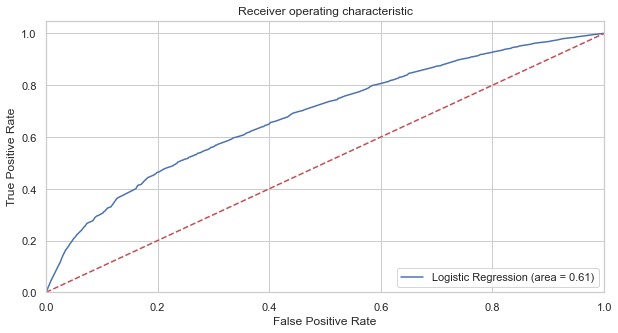

In [1602]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [1593]:
Training AUC: 0.8517288511601837
Test AUC: 0.8388417252146761

SyntaxError: invalid syntax (<ipython-input-1593-8a5e4cebff90>, line 1)

### Resultados

In [1603]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.70


In [262]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[44540 21520]
 [24877 37016]]


In [263]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.64      0.67      0.66     66060
           1       0.63      0.60      0.61     61893

    accuracy                           0.64    127953
   macro avg       0.64      0.64      0.64    127953
weighted avg       0.64      0.64      0.64    127953



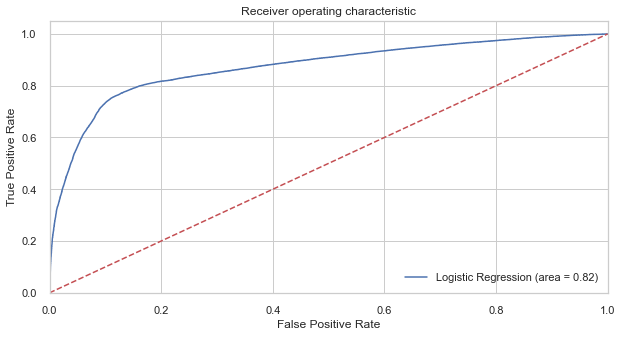

In [817]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [818]:
def ks(data=None,target=None, prob=None):
    data['target0'] = 1 - data[target]
    data['bucket'] = pd.qcut(data[prob], 10)
    grouped = data.groupby('bucket', as_index = False)
    kstable = pd.DataFrame()
    kstable['min_prob'] = grouped.min()[prob]
    kstable['max_prob'] = grouped.max()[prob]
    kstable['events']   = grouped.sum()[target]
    kstable['nonevents'] = grouped.sum()['target0']
    kstable = kstable.sort_values(by="min_prob", ascending=False).reset_index(drop = True)
    kstable['event_rate'] = (kstable.events / data[target].sum()).apply('{0:.2%}'.format)
    kstable['nonevent_rate'] = (kstable.nonevents / data['target0'].sum()).apply('{0:.2%}'.format)
    kstable['cum_eventrate']=(kstable.events / data[target].sum()).cumsum()
    kstable['cum_noneventrate']=(kstable.nonevents / data['target0'].sum()).cumsum()
    kstable['KS'] = np.round(kstable['cum_eventrate']-kstable['cum_noneventrate'], 3) * 100
    
    #Formating
    kstable['cum_eventrate']= kstable['cum_eventrate'].apply('{0:.2%}'.format)
    kstable['cum_noneventrate']= kstable['cum_noneventrate'].apply('{0:.2%}'.format)
    kstable.index = range(1,11)
    kstable.index.rename('Decile', inplace=True)
    pd.set_option('display.max_columns', 9)
    print(kstable)
    
    #Display KS
    from colorama import Fore
    print(Fore.RED + "KS is " + str(max(kstable['KS']))+"%"+ " at decile " + str((kstable.index[kstable['KS']==max(kstable['KS'])][0])))
    return(kstable)

In [819]:
mydf = ks(data=X,target="y", prob="p")

KeyError: 'y'

# Seleccion de Variables Por Random Forest

In [1475]:
rf = RandomForestClassifier(n_estimators=100, max_depth=2,random_state=0)

In [1476]:
X_train_proc.describe()

,ente,monto_aprobado,dias_ven_cap,sld_tot_xven,sld_tot_ven,sld_tot_ndi,div_pendientes,div_pagados,periodos_plazo,plazo_meses,num_cuota_ven,acreedores_anteriores_36_meses,acreedores_vigentes,saldo_total_deuda_actual_ifis,endeudamiento_promedio,saldo_demanda_judicial,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencido6mesestotal,mayorvalorvencido6mesestotal,mayorplazovencidohistoricototal,porcentaje_cancelacion,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,score_buro,cuota_estimada_buro,ca_val_garantia,ventas_netas_balances,riesgo_consolidado_directo,num_cargas,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside_mes,des_op_sector_bnf,des_forma_pago,des_zonal,calificacion_score,ca_tip_garantia_categ,peor_calificacion,des_estado_civil,des_nivel_instruccion,des_origen_ingresos,tipo_vivienda,des_situacion_laboral,des_estado_operacion 0,des_estado_operacion 1,des_estado_operacion 2,des_estado_operacion 3,des_estado_operacion 4,cliente_nuevo 0,cliente_nuevo 1,cliente_nuevo 2,cliente_bancarizado 0,cliente_bancarizado 1,cliente_bancarizado 2,bandera_castigado 0,bandera_castigado 1,bandera_castigado 2,bandera_reestructurado 0,bandera_reestructurado 1,bandera_reestructurado 2,bandera_condonado 0,bandera_condonado 1,cartera_heredada 0,cartera_heredada 1,indicador_vencido 0,indicador_vencido 1,analisis_riesgo 0,analisis_riesgo 1,des_sexo 0,des_sexo 1,des_sexo 2,es_jefe_hogar 0,es_jefe_hogar 1,es_jefe_hogar 2,des_sector 0,des_sector 1,des_sector 2,bandera_Demanda_Judicial 0,bandera_Demanda_Judicial 1
count,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,4.682990e+05,4.682990e+05,468299.000000,4.682990e+05,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,4.682990e+05,4.682990e+05,4.682990e+05,468299.000000,468299.000000,468299.000000,468299.000000,4.682990e+05,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000,468299.000000
mean,-0.042150,0.255119,6.332762,0.355541,317.948424,420.355728,0.680399,0.419454,0.258844,0.083433,1.172877,-3.011199e-14,7.066195e-14,1.000000,-7.986985e-17,20.945738,30.144433,1.000000,22.334847,1.000000,1.000000,1.000000,0.392647,0.431605,1.235134,0.823623,0.592536,1.537734,-6.851931e-15,-9.467079e-15,3.192235e+03,2.084938,0.303217,0.237081,0.028125,-1.662786e-15,2.487362,0.065474,0.085091,-0.118274,-0.158957,0.091773,7.720768,3.851138,4.355239,1.015136,0.123744,2.632692,1.763292,3.740078,2.904452,3.893297,6.576681,0.045409,0.109840,0.002483,0.094907,0.747360,0.700977,0.224117,0.074905,0.208346,0.224117,0.567537,0.948223,0.000698,0.051078,0.956225,0.000698,0.043077,0.987993,0.012007,0.558893,0.441107,0.738977,0.261023,0.986598,0.013402,0.383970,0.616023,0.000006,0.589100,0.009893,0.401007,0.000709,0.499514,0.499777,0.762784,0.237216
std,0.511244,0.751457,21.288129,0.988423,1156.913916,1740.811833,1.576204,0.985455,0.570611,0.607879,3.226302,1.160513e+00,8.056060e-01,2.979555,8.840653e+00,579.933895,427.681690,4.820440,621.372031,3.876056,16.130564,1.734735,0.488340,0.495301,234.206618,

In [1477]:
rf.fit(X_train_proc, y_train)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [1478]:
#ordenamos de mayor a menor importancia

df_feature_importance_rf = pd.DataFrame(rf.feature_importances_, columns= ["importance"])
df_feature_importance_rf["feature"] = X_train_proc.columns
df_feature_importance_rf.sort_values(by="importance", ascending = False)

NotFittedError: This RandomForestClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [ ]:
rforest_features = df_feature_importance_rf[df_feature_importance_rf["importance"]>0]["feature"].values
rforest_features

In [ ]:
plt.figure(figsize=(30,8))
plt.bar(df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"],df_feature_importance_rf.sort_values(by="importance", ascending = False)["importance"])
plt.xticks(df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"], df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"], rotation='vertical')
plt.show()

# Modelamiento

In [ ]:
X_train_after = X_train_proc[rforest_features]

print(X_train_proc.shape," - ",X_train_after.shape)

In [1051]:

df_cliente_concat = pd.concat([df_ids, df_numerico, df_categorico, df_Micro_60 ], axis=1)
df_cliente_concat.shape

(669000, 52)

In [969]:
df_cliente_concat.head(3)

,ente,monto_aprobado,sld_tot_ven,sld_tot_ndi,periodos_plazo,plazo_meses,num_cuota_ven,acreedores_vigentes,endeudamiento_promedio,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencidohistoricototal,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cuota_estimada_buro,ca_val_garantia,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,Edad,antiguedad_lab,antiguedad_reside_mes,des_op_sector_bnf,des_forma_pago,des_estado_operacion,des_zonal,cliente_nuevo,cliente_bancarizado,ca_tip_garantia_categ,bandera_castigado,bandera_reestructurado,bandera_condonado,cartera_heredada,indicador_vencido,analisis_riesgo,des_sexo,des_estado_civil,des_nivel_instruccion,es_jefe_hogar,des_origen_ingresos,des_sector,tipo_vivienda,des_situacion_laboral,bandera_Demanda_Judicial,Micro_60
668999,3116727,3000.0,2502.0,0.0,24,24.0,9,0.0,0.0,0.0,NaN,0.0,0.0,0.0,5175.0,4179.0,24100.0,2901.0,415.0,0.0,0.0,20000.0,1800.0,2,21.0,3.0,3.0,COMERCIO,MENSUAL,VENCIDO,ZONAL PORTOVIEJO,NO,SI,GARANTIA PERSONAL,NO,NO,NO,NO,SI,NO,MASCULINO,SOLTERO,PRIMARIA,N,INDEPENDIENTE,SECTOR URBANO,ARRENDADA,NEGOCIO PROPIO,SI,MALO
155095,1945921,15000.0,1.0,0.0,60,60.0,3,0.0,0.0,0.0,0.0,0.0,4.0,1.0,4650.0,815.0,46861.0,60.0,19.0,0.0,1.0,20000.0,1850.0,1,63.0,9.0,30.0,SERVICIOS,MENSUAL,CASTIGADO,ZONAL PORTOVIEJO,NO,SI,GARANTIA PERSONAL,SI,NO,NO,SI,SI,NO,FEMENINO,VIUDO,PRIMARIA,N,INDEPENDIENTE,SECTOR URBANO,ARRENDADA,NEGOCIO PROPIO,SI,MALO
268669,2982677,4500.0,750.0,750.0,36,36.0,8,0.0,0.0,0.0,NaN,0.0,0.0,1.0,4300.0,2130.0,11490.0,8720.0,415.0,0.0,0.0,20000.0,2500.0,1,28.0,3.0,5.0,COMERCIO,MENSUAL,NO DEVENGA INTERES,ZONAL GUAYAQUIL,NO,SI,GARANTIA PERSONAL,NO,NO,NO,SI,SI,NO,MASCULINO,SOLTERO,SECUNDARIA,N,INDEPENDIENTE,SECTOR URBANO,VIVE CON FAMILIARES,NEGOCIO PROPIO,NO,MALO


In [970]:
print(df_cliente_concat.columns)

Index(['ente', 'monto_aprobado', 'sld_tot_ven', 'sld_tot_ndi',
       'periodos_plazo', 'plazo_meses', 'num_cuota_ven', 'acreedores_vigentes',
       'endeudamiento_promedio', 'saldo_cartera_castigada',
       'mayorplazovencidoactualtotal', 'mayorvalorvencidoactualtotal',
       'mayorplazovencidohistoricototal', 'porcentaje_cancelacion_saldo',
       'total_ingresos', 'total_gastos', 'total_activos', 'total_pasivos',
       'cuota_estimada_buro', 'ca_val_garantia', 'num_cargas_estudiando',
       'valor_vivienda', 'sueldo', 'Ciclo', 'Edad', 'antiguedad_lab',
       'antiguedad_reside_mes', 'des_op_sector_bnf', 'des_forma_pago',
       'des_estado_operacion', 'des_zonal', 'cliente_nuevo',
       'cliente_bancarizado', 'ca_tip_garantia_categ', 'bandera_castigado',
       'bandera_reestructurado', 'bandera_condonado', 'cartera_heredada',
       'indicador_vencido', 'analisis_riesgo', 'des_sexo', 'des_estado_civil',
       'des_nivel_instruccion', 'es_jefe_hogar', 'des_origen_ingresos',


In [972]:
df_cliente_concat['Micro_60'].unique()

array(['MALO', 'BUENO'], dtype=object)

KeyError: 'Micro_60'

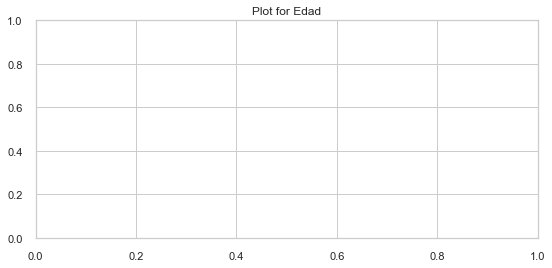

In [990]:
df = pd.get_dummies(df_cliente_concat)
df.head(3)

,ente,monto_aprobado,sld_tot_ven,sld_tot_ndi,periodos_plazo,plazo_meses,num_cuota_ven,acreedores_vigentes,endeudamiento_promedio,saldo_cartera_castigada,mayorplazovencidoactualtotal,mayorvalorvencidoactualtotal,mayorplazovencidohistoricototal,porcentaje_cancelacion_saldo,total_ingresos,total_gastos,total_activos,total_pasivos,cuota_estimada_buro,ca_val_garantia,num_cargas_estudiando,valor_vivienda,sueldo,Ciclo,Edad,antiguedad_lab,antiguedad_reside_mes,des_op_sector_bnf_ACTIVIDADES FINANCIERAS Y SEGUROS,des_op_sector_bnf_ACUICOLA,des_op_sector_bnf_AGRICOLA,des_op_sector_bnf_AGROINDUSTRIAL,des_op_sector_bnf_ARTESANAL,des_op_sector_bnf_COMERCIALES DIRECTOS,des_op_sector_bnf_COMERCIO,des_op_sector_bnf_FORESTAL,des_op_sector_bnf_HABILIDADES ESPECIALES,des_op_sector_bnf_INDUSTRIAL,des_op_sector_bnf_MINERIA,des_op_sector_bnf_PECUARIO,des_op_sector_bnf_PEQUEÑA INDUSTRIA,des_op_sector_bnf_PESQUERO ARTESANAL,des_op_sector_bnf_PISCICULTURA,des_op_sector_bnf_SERVICIOS,des_op_sector_bnf_SOBREGIRO OCASIONAL,des_op_sector_bnf_TURISMO,des_op_sector_bnf_TURISMO ACUATICO,des_forma_pago_ANUAL,des_forma_pago_BIMENSUAL,des_forma_pago_CUATRIMESTRAL,des_forma_pago_DIARIO,des_forma_pago_MENSUAL,des_forma_pago_NUEVE MESES,des_forma_pago_SEMESTRAL,des_forma_pago_TRIMESTRAL,des_forma_pago_VENCIMIENTO,des_estado_operacion_CASTIGADO,des_estado_operacion_NO DEVENGA INTERES,des_estado_operacion_POR VENCER,des_estado_operacion_VENCIDO,des_estado_operacion_VIGENTE,des_zonal_ZONAL CUENCA,des_zonal_ZONAL EL PUYO,des_zonal_ZONAL GUAYAQUIL,des_zonal_ZONAL IBARRA,des_zonal_ZONAL LOJA,des_zonal_ZONAL MACHALA,des_zonal_ZONAL PORTOVIEJO,des_zonal_ZONAL QUITO,des_zonal_ZONAL RIOBAMBA,des_zonal_ZONAL STO. DOMINGO,cliente_nuevo_NO,cliente_nuevo_SI,cliente_bancarizado_NO,cliente_bancarizado_SI,ca_tip_garantia_categ_GARANTIA PERSONAL,ca_tip_garantia_categ_HIPOTECARIA,ca_tip_garantia_categ_OTRAS GARANTIAS ADECUADAS,ca_tip_garantia_categ_PRENDARIA,ca_tip_garantia_categ_TITULOS Y VALORES,bandera_castigado_NO,bandera_castigado_SI,bandera_reestructurado_NO,bandera_reestructurado_SI,bandera_condonado_NO,bandera_condonado_SI,cartera_heredada_NO,cartera_heredada_SI,indicador_vencido_NO,indicador_vencido_SI,analisis_riesgo_NO,analisis_riesgo_SI,des_sexo_FEMENINO,des_sexo_MASCULINO,des_estado_civil_CASADO,des_estado_civil_DIVORCIADO,des_estado_civil_SOLTERO,des_estado_civil_UNION DE HECHO,des_estado_civil_VIUDO,des_nivel_instruccion_FORMACION INTERMEDIA (TECNICA),des_nivel_instruccion_POSTGRADO,des_nivel_instruccion_PRIMARIA,des_nivel_instruccion_SECUNDARIA,des_nivel_instruccion_SIN ESTUDIOS,des_nivel_instruccion_UNIVERSITARIA,es_jefe_hogar_N,es_jefe_hogar_S,des_origen_ingresos_AMA DE CASA,des_origen_ingresos_EMPLEADO PRIVADO,des_origen_ingresos_EMPLEADO PUBLICO,des_origen_ingresos_INDEPENDIENTE,des_origen_ingresos_JUBILADO O PENSIONISTA,des_origen_ingresos_MISION CASA PARA TODOS,des_origen_ingresos_REMESAS DEL EXTERIOR,des_origen_ingresos_RENTISTA,des_sector_SECTOR RURAL,des_sector_SECTOR URBANO,tipo_vivienda_ARRENDADA,tipo_vivienda_PRESTADA,tipo_vivienda_PROPIA HIPOTECADA,tipo_vivienda_PROPIA NO HIPOTECADA,tipo_vivienda_VIVE CON FAMILIARES,des_situacion_laboral_AMA DE CASA,des_situacion_laboral_BONO,des_situacion_laboral_DESEMPLEADO,des_situacion_laboral_EMPLEADO CON SUELDO FIJO,des_situacion_laboral_EMPLEADO CON SUELDO Y COMISIONES,des_situacion_laboral_ESTUDIANTE,des_situacion_laboral_JUBILADO,des_situacion_laboral_NEGOCIO PROPIO,des_situacion_laboral_PROFESIONAL INDEPENDIENTE,bandera_Demanda_Judicial_NO,bandera_Demanda_Judicial_SI,Micro_60_BUENO,Micro_60_MALO
668999,3116727,3000.0,2502.0,0.0,24,24.0,9,0.0,0.0,0.0,NaN,0.0,0.0,0.0,5175.0,4179.0,24100.0,2901.0,415.0,0.0,0.0,20000.0,1800.0,2,21.0,3.0,3.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
155095,1945921,15000.0,1.0,0.0,60,60.0,3,0.0,0.0,0.0,0.0,0.0,4.0,1.

In [1347]:
import statsmodels.api as sm

In [1352]:
#logit_mod = sm.Logit(y_train, df_cliente_concat)
log_reg = sm.Logit(y_train, X_train).fit()

ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [ ]:
print(log_reg.summary())

In [1350]:
logit_res = logit_mod.fit(disp = 0)
print('Parameters:'lpm_res.params[:-1])

NameError: name 'logit_mod' is not defined

In [989]:
params = {'random_state': 0, 'n_jobs': 4, 'n_estimators': 5000, 'max_depth': 8}
# One-hot encode
#df = pd.get_dummies(df_cliente_concat)
# Drop redundant columns (for features with two unique values)
drop = ['Churn_Yes', 'Churn_No', 'gender_Female', 'Partner_No','Dependents_No', 'PhoneService_No', 'PaperlessBilling_No']
x, y = df.drop(drop,axis=1), df['Churn_Yes']
# Fit RandomForest Classifier
clf = RandomForestClassifier(**params)
clf = clf.fit(x, y)
# Plot features importances
imp = pd.Series(data=clf.feature_importances_, index=x.columns).sort_values(ascending=False)
plt.figure(figsize=(10,12))
plt.title("Feature importance")
ax = sns.barplot(y=imp.index, x=imp.values, palette="Blues_d", orient='h')

NameError: name 'drop' is not defined

# ESTADO ACTUAL DE LA ORIGINACION DEL CREDITO <a name="Hipotesis"></a>
<div class ="alert alert-info">
<b> HIPOTESIS </b>

In [280]:
df_cliente_d =  pd.DataFrame()
df_cliente_d['mes']=df_cliente['mes'].values
df_cliente_d['anio']=df_cliente['anio'].values
df_cliente_d['AnioMes']=df_cliente['AnioMes'].values
df_cliente_d['Ciclo']=df_cliente['Ciclo'].values
df_cliente_d['ente']=df_cliente['ente'].values
df_cliente_d['Edad']=df_cliente['Edad'].values
#df_cliente_d['edad_uno']=df_cliente['edad_uno'].values
df_cliente_d['antiguedad_lab']=df_cliente['antiguedad_lab'].values
df_cliente_d['antiguedad_cli']=df_cliente['antiguedad_cli'].values
df_cliente_d['antiguedad_reside']=df_cliente['antiguedad_reside_mes'].values
df_cliente_d['fecha_originacion']=df_cliente['fecha_originacion'].values
#df_cliente_d['tipo_credito']=df_cliente['tipo_credito'].values
#df_cliente_d['fecha_corte']=df_cliente['fecha_corte'].values
#df_cliente_d['fecha_corte.1']=df_cliente['fecha_corte.1'].values
df_cliente_d['des_zonal']=df_cliente['des_zonal'].values
df_cliente_d['fecha_originacion']=df_cliente['fecha_originacion'].values
df_cliente_d['Micro_60']=df_cliente['Micro_60'].values
df_cliente_d['monto_aprobado']=df_cliente['monto_aprobado'].values
df_cliente_d['porcentaje_cancelacion_saldo']=df_cliente['porcentaje_cancelacion_saldo'].values
df_cliente_d['peor_calificacion']=df_cliente['peor_calificacion'].values
df_cliente_d['score_buro']=df_cliente['score_buro'].values
df_cliente_d['calificacion_score']=df_cliente['calificacion_score'].values
df_cliente_d['peor_calificacion']=df_cliente['peor_calificacion'].values
df_cliente_d['BUENO']=df_cliente['BUENO'].values
df_cliente_d['MALO']=df_cliente['MALO'].values
df_cliente_d.head(3)

,mes,anio,AnioMes,Ciclo,ente,Edad,antiguedad_lab,antiguedad_cli,antiguedad_reside,fecha_originacion,des_zonal,Micro_60,monto_aprobado,porcentaje_cancelacion_saldo,peor_calificacion,score_buro,calificacion_score,BUENO,MALO
0,2019-02-15,2019-02-15,2019-02-01,2,3116727,21.0,3.0,3.0,3.0,2019-02-15,ZONAL PORTOVIEJO,MALO,3000.0,0.0,E,NaN,A1,0,1
1,2012-11-27,2012-11-27,2012-11-01,1,1945921,63.0,9.0,9.0,30.0,2012-11-27,ZONAL PORTOVIEJO,MALO,15000.0,1.0,E,663.0,B1,0,1
2,2018-04-03,2018-04-03,2018-04-01,1,2982677,28.0,3.0,3.0,5.0,2018-04-03,ZONAL GUAYAQUIL,MALO,4500.0,1.0,E,NaN,A1,0,1


NameError: name 'df_cliente_d' is not defined

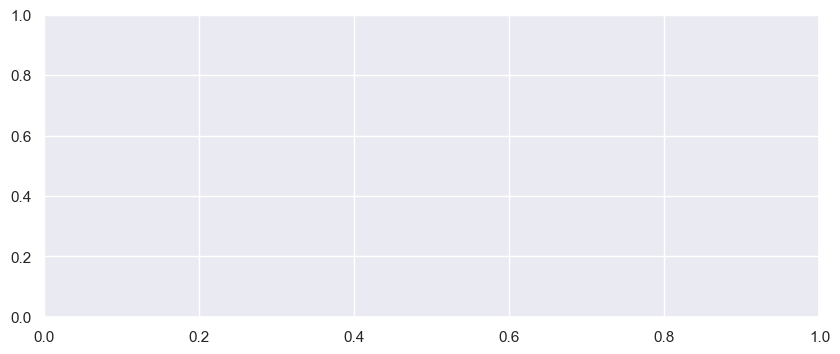

In [124]:
# plot data
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
# use unstack()
df_cliente_d.groupby(['AnioMes', 'Micro_60']).sum()['monto_aprobado'].unstack().plot(ax=ax)
label=('Evolucion Colocacion')
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año', fontsize=18)
ax.set_ylabel('Monto Aprobado', fontsize=14)
ax.set_title('Evolucion Monto Aprobado', fontsize=16)

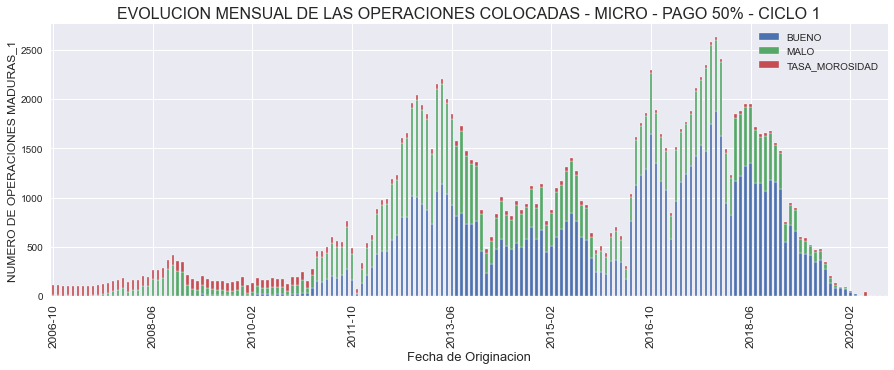

In [269]:
df_cliente_date = df_cartera_madura_1
ax = df_cliente_date.plot.bar(x= 'TOTAL_MES', use_index=False, stacked=True,figsize=(15,5))
#df_cliente_date.plot(y='TASA_MOROSIDAD', color = 'red' , ax=ax,  use_index=False, secondary_y=True, mark_right=True,legend=False)
#ax.right_ax.set_ylabel('TASA DE MOROSIDAD',fontsize=12)

locs, labels = plt.xticks(fontsize=12)
N = 20
plt.xticks(locs[::N], df_cliente_date.index[::N].strftime('%Y-%m'))
fig.autofmt_xdate()


ax.set_ylabel('NUMERO DE OPERACIONES MADURAS_1', fontsize=12)
ax.set_xlabel('Fecha de Originacion', fontsize=13)
ax.set_title('EVOLUCION MENSUAL DE LAS OPERACIONES COLOCADAS - MICRO - PAGO 50% - CICLO 1', fontsize=16) 
ax.legend()
plt.show()

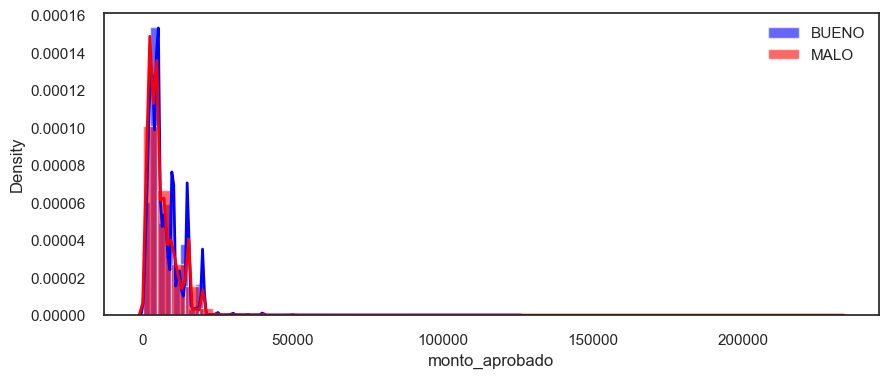

In [362]:
#fig, ax = plt.subplots(figsize=(10,4), dpi=100)
sns.set_style("white")

x1 = df_cliente_d.loc[df_cliente_d.Micro_60=='BUENO', 'monto_aprobado']
x2 = df_cliente_d.loc[df_cliente_d.Micro_60=='MALO', 'monto_aprobado']

# Plot
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

plt.figure(figsize=(10,4), dpi= 100)
sns.distplot(x1, color="blue", label="BUENO", **kwargs)
sns.distplot(x2, color="red", label="MALO", **kwargs)
plt.title('Distribucion del Monto Aprobado')
plt.legend()

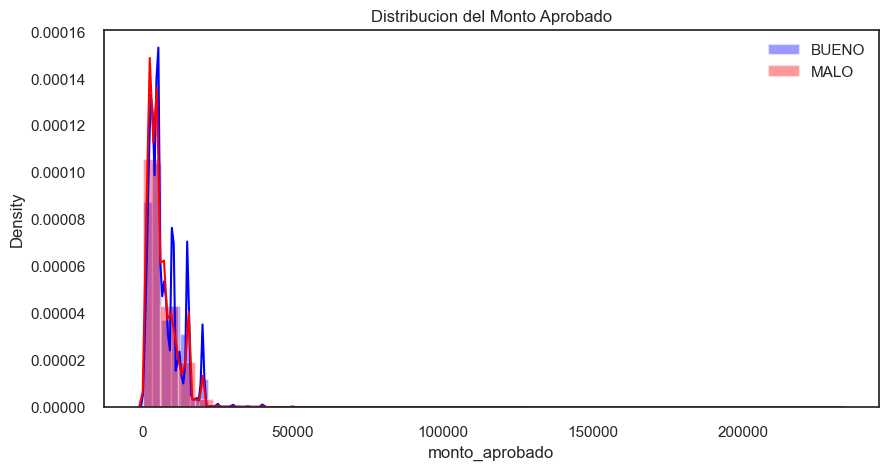

In [378]:
df = df_cliente
plt.subplots(figsize=(10,5), dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','monto_aprobado'], bins=40, color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','monto_aprobado'],  bins=40, color="red", label="MALO")
plt.title('Distribucion del Monto Aprobado')
plt.legend()
#plt.xlim(0,35000)
plt.show()

In [368]:
''''fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)
sns.scatterplot(y = "total_ventas", x = "score_buro", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO'])
plt.title('Score Buro  vs Monto Otorgado')
#plt.legend()
axes.legend(loc=2)
plt.show() '''

'\'fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)\nsns.scatterplot(y = "total_ventas", x = "score_buro", data = df_cliente, hue = "Micro_60", hue_order =[\'BUENO\', \'MALO\'])\nplt.title(\'Score Buro  vs Monto Otorgado\')\n#plt.legend()\naxes.legend(loc=2)\nplt.show() '

Text(0.5, 1.0, 'Evolucion Monto Aprobado por Zonal')

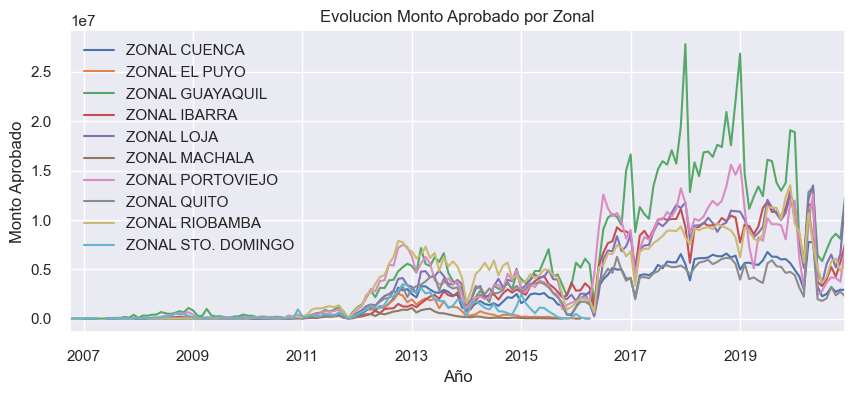

In [308]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
df_cliente.groupby(['AnioMes', 'des_zonal']).sum()['monto_aprobado'].unstack().plot(ax=ax)
label=('Evolucion Colocacion por Zonal')
ax.legend()
ax.set_xlabel('Año', fontsize=12)
ax.set_ylabel('Monto Aprobado', fontsize=12)
ax.set_title('Evolucion Monto Aprobado por Zonal', fontsize=12)

Text(0.5, 1.0, 'Evolucion Colocacion por Zona')

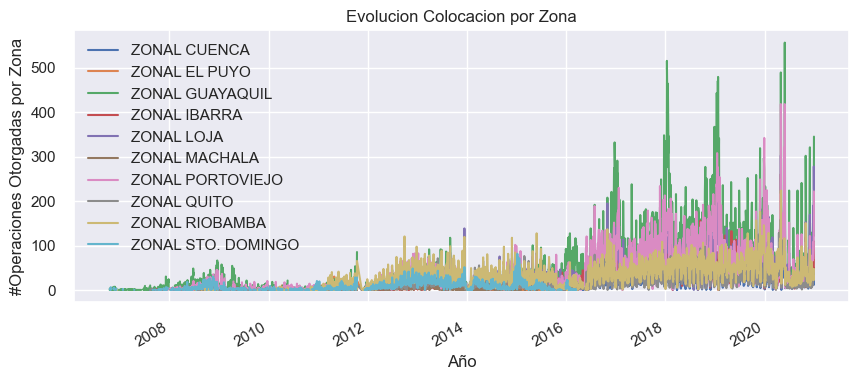

In [309]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
df_cliente.groupby(['fecha_originacion','des_zonal']).count()['monto_aprobado'].unstack().plot(ax=ax)
ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('#Operaciones Otorgadas por Zona')
ax.set_title('Evolucion Colocacion por Zona')

Text(0.5, 1.0, 'Evolucion del Monto Colocado por Calificacion Score')

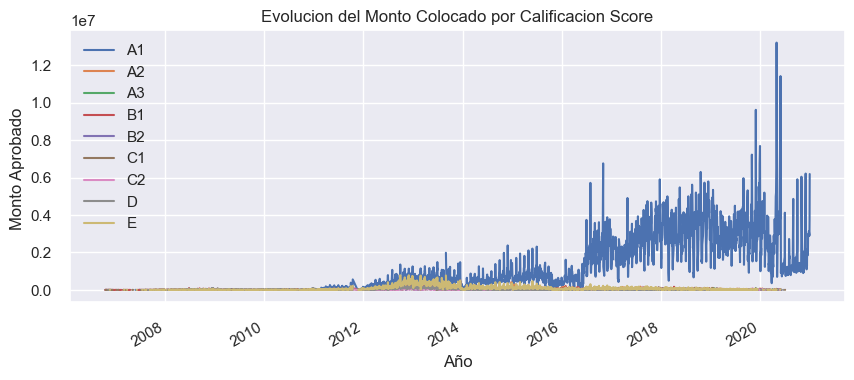

In [310]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
# use unstack()
df_cliente.groupby(['fecha_originacion','calificacion_score']).sum()['monto_aprobado'].unstack().plot(ax=ax)
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('Monto Aprobado ')
ax.set_title('Evolucion del Monto Colocado por Calificacion Score')

Text(0.5, 1.0, 'Evolucion del Numero de Operaciones Colocadas por Calificacion Score')

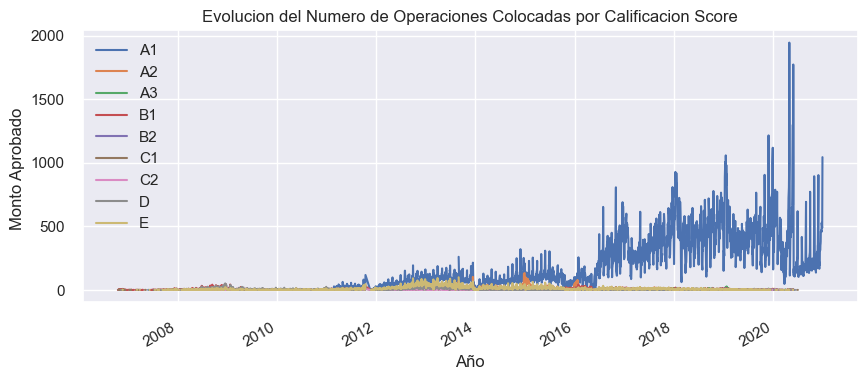

In [307]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
# use unstack()
df_cliente.groupby(['fecha_originacion','calificacion_score']).count()['monto_aprobado'].unstack().plot(ax=ax)
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('Monto Aprobado ')
ax.set_title('Evolucion del Numero de Operaciones Colocadas por Calificacion Score')

Text(0.5, 1.0, 'Evolucion del Numero de Operaciones Colocadas por Peor Calificacion')

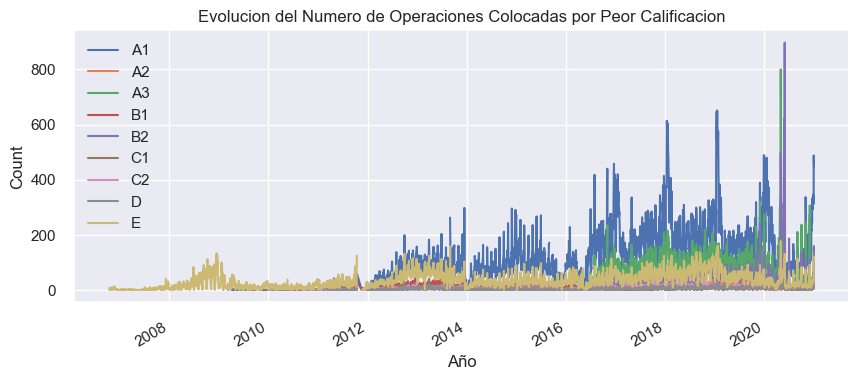

In [311]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
# use unstack()
df_cliente.groupby(['fecha_originacion','peor_calificacion']).count()['monto_aprobado'].unstack().plot(ax=ax)
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('Count')
ax.set_title('Evolucion del Numero de Operaciones Colocadas por Peor Calificacion')

#calificacion_score

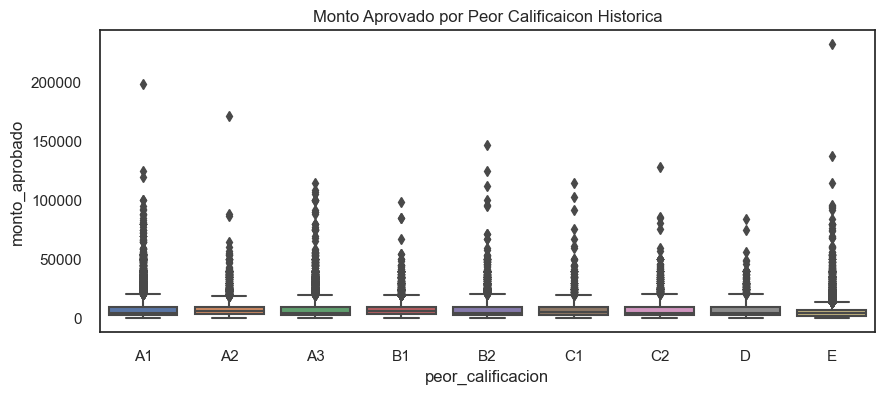

In [387]:
data= df_cliente
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,4), dpi=100)
sns.boxplot(x = "peor_calificacion", y ="monto_aprobado", data = df_cliente, order = ['A1','A2','A3','B1','B2','C1','C2','D','E'])
plt.title('Monto Aprovado por Peor Calificaicon Historica')
plt.legend()
plt.show()

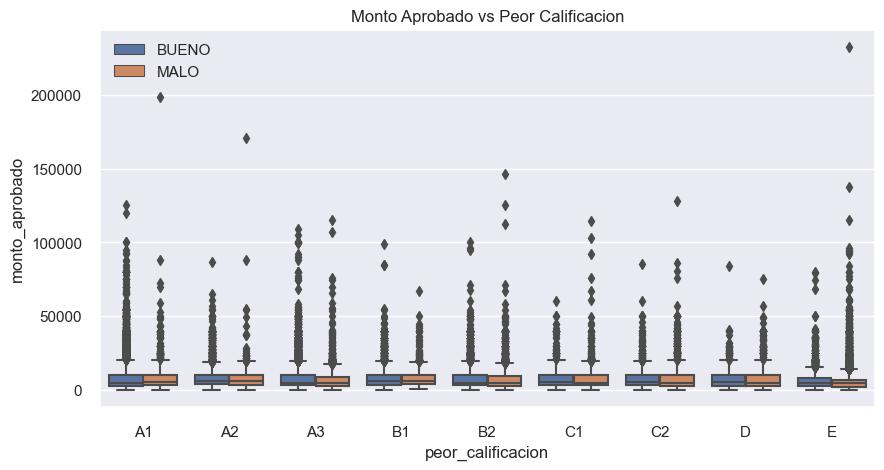

In [351]:
data= df_cliente
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)
sns.boxplot(x = "peor_calificacion", y ="monto_aprobado", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO'],order = ['A1','A2','A3','B1','B2','C1','C2','D','E'])
plt.title('Monto Aprobado vs Peor Calificacion')
plt.legend()
plt.show()  

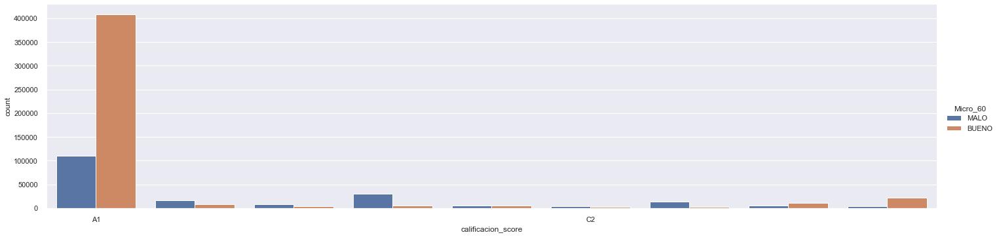

In [321]:
pl = sns.factorplot('calificacion_score',hue = "Micro_60", data = df_cliente, aspect =4, kind = 'count')

pl.set_xticklabels(step=5)

<AxesSubplot:xlabel='score_buro', ylabel='Count'>

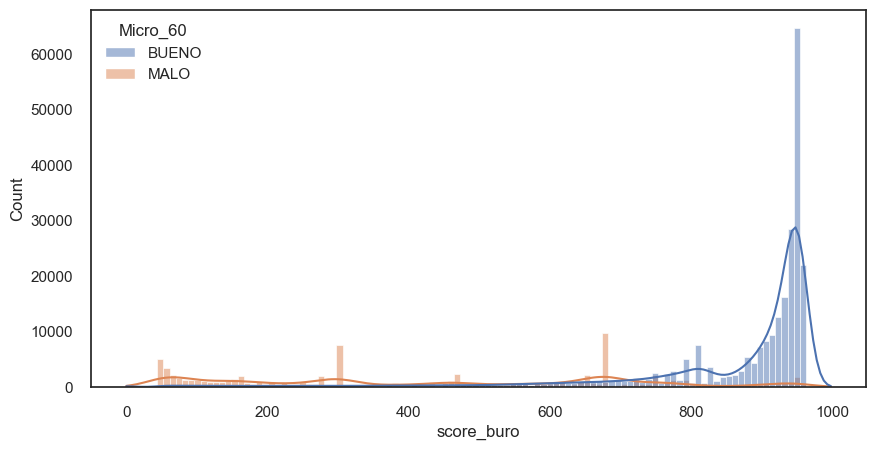

In [395]:
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)
sns.histplot(data=df_cliente,x=df_cliente['score_buro'],hue_order =['BUENO', 'MALO'], kde=True,hue='Micro_60')

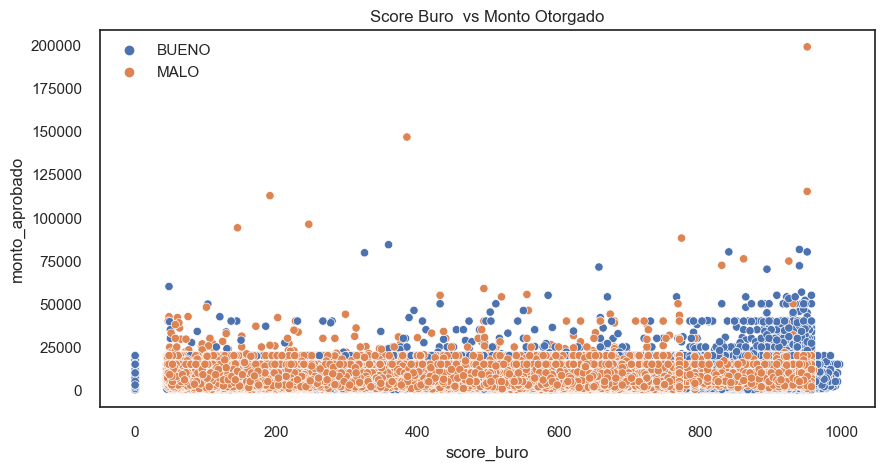

In [398]:
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,5), dpi=100)
sns.scatterplot(y = df_cliente["monto_aprobado"], x = "score_buro", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO'])
plt.title('Score Buro  vs Monto Otorgado')
#plt.legend()
axes.legend(loc=2)
plt.show()  

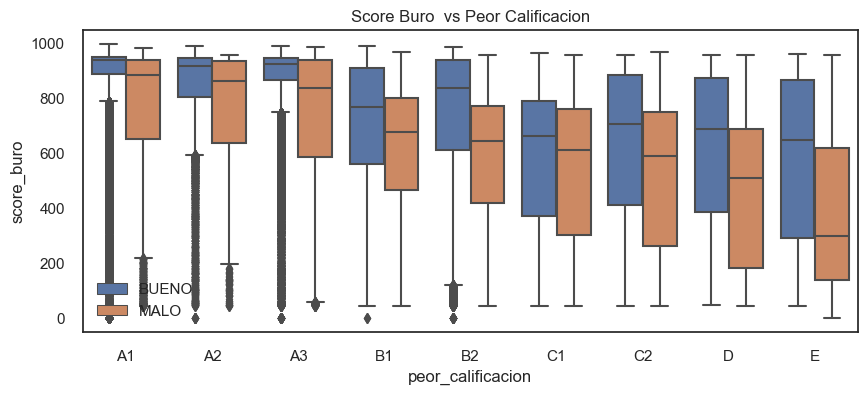

In [369]:
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,4), dpi=100)
sns.boxplot(x = "peor_calificacion", y ="score_buro", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO'], order = ['A1','A2','A3','B1','B2','C1','C2','D','E'])
plt.title('Score Buro  vs Peor Calificacion')
#plt.legend()
axes.legend(loc=3)
plt.show()  

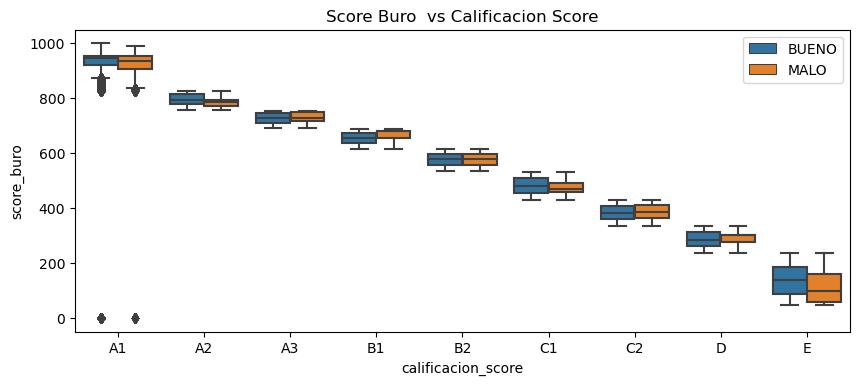

In [39]:
data= df_cliente
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,4), dpi=100)
sns.boxplot(x = "calificacion_score", y ="score_buro", data = df_cliente, hue = "Micro_60", hue_order =['BUENO', 'MALO']  ,order = ['A1','A2','A3','B1','B2','C1','C2','D','E'])
plt.title('Score Buro  vs Calificacion Score')
plt.legend()
plt.show()  

In [103]:
des_peor_calificacion = {"peor_calificacion": {"1": 'A1', "2": 'A2', "3": 'A2', "4": 'B1', "5": 'B2', "6": 'C1', "7": 'C2',
                                               "8": 'D', "9": 'E' }}

Text(0.5, 1.0, 'Monto Aprobado por Peor Calificacion')

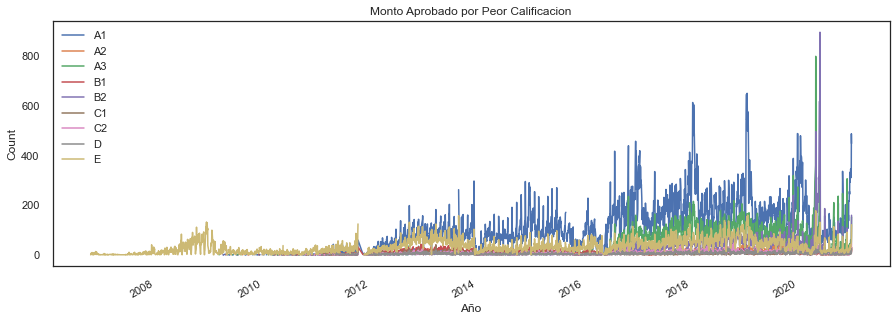

In [383]:
# plot data
fig, ax = plt.subplots(figsize=(15,5))
# use unstack()
df_cliente_d.groupby(['fecha_originacion','peor_calificacion']).count()['monto_aprobado'].unstack().plot(ax=ax)
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('Count')
ax.set_title('Monto Aprobado por Peor Calificacion')

#calificacion_score

Text(0.5, 1.0, 'Evolucion Colocacion')

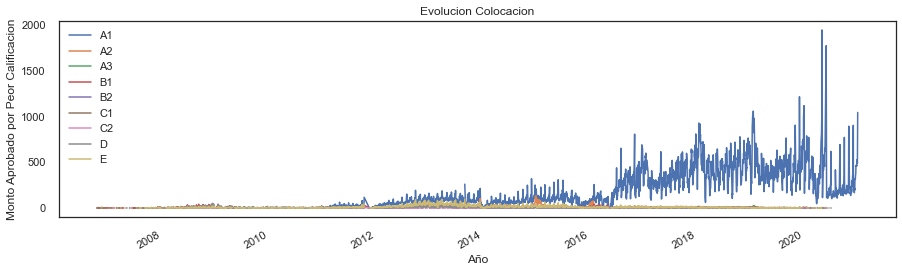

In [382]:
# plot data
fig, ax = plt.subplots(figsize=(15,4))
# use unstack()
df_cliente_d.groupby(['fecha_originacion','calificacion_score']).count()['monto_aprobado'].unstack().plot(ax=ax)
# Set x-ticks to yearly interval and add legend and labels

ax.legend()
ax.set_xlabel('Año')
ax.set_ylabel('Monto Aprobado por Peor Calificacion')
ax.set_title('Evolucion Colocacion')

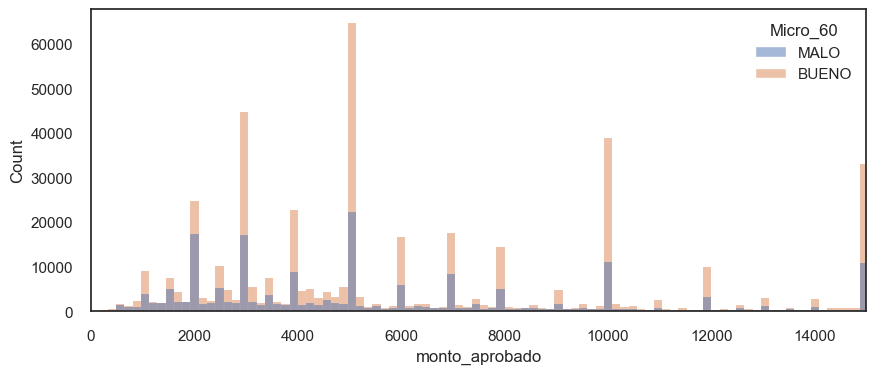

In [374]:
plt.subplots(figsize=(10,4), dpi=100)
sns.histplot(df_cliente_d
            ,x = 'monto_aprobado'
            ,hue = 'Micro_60')
plt.xlim(0,15000)
plt.show()

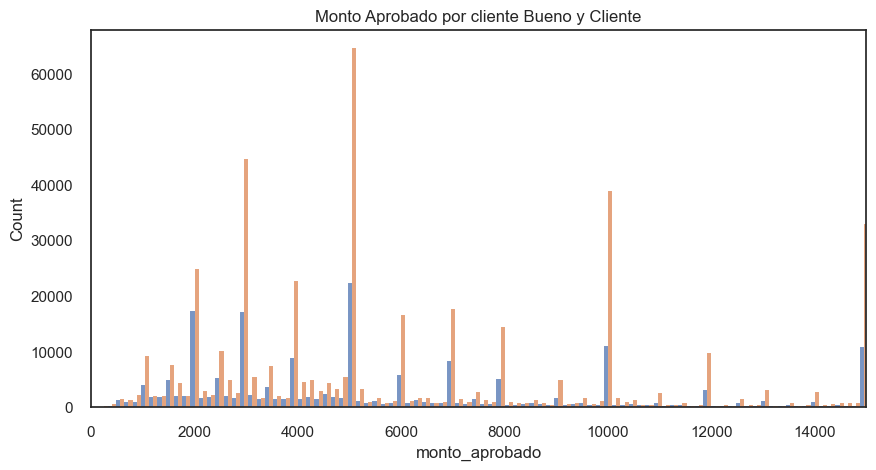

In [375]:
data = df_cliente
fig, histogram = plt.subplots(figsize = (10,5), dpi=100)
histogram = sns.histplot(data ,x = 'monto_aprobado', hue = 'Micro_60', bins='auto',  multiple="dodge")
plt.title('Monto Aprobado por cliente Bueno y Cliente')
plt.legend()
plt.xlim(0,15000)
plt.show()
# multiple="stack"
# multiple="dodge", shrink=.9, , binwidth=5

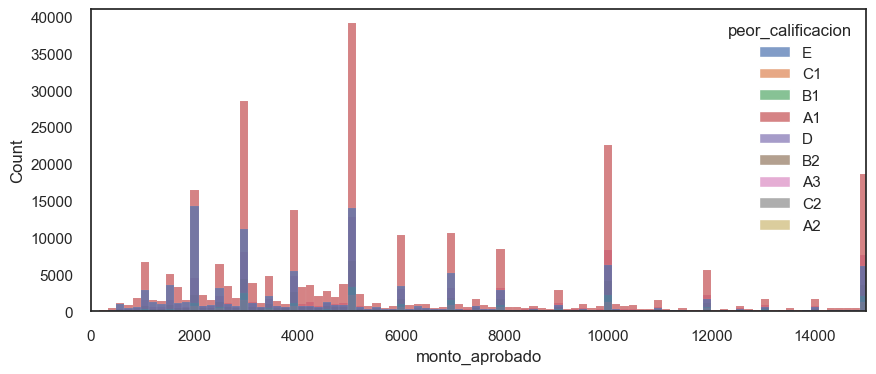

In [377]:
plt.subplots(figsize=(10,4), dpi=100)
sns.histplot(data = df_cliente_d,x = 'monto_aprobado',alpha = .7,hue = 'peor_calificacion', order = ['A1','A2','A3','B1','B2','C1','C2','D','E'])
plt.xlim(0,50000)
plt.show()

In [ ]:
# Muestras de Desarrollo y de Testeo - Criterio de Mora Estable

In [ ]:
df_desarrollo = df_cliente.loc[(df_cliente.Fecha_Oiginacion >= '2016-01-01') & (df_cliente.Fecha_Oiginacion ,='2018-12-01'),:]
df_desarrollo.shape

In [ ]:
df_testeo = df_cliente.loc[(df_cliente.Fecha_Oiginacion >= '2019-01-01') & (df_cliente.Fecha_Oiginacion ,='2019-11-01'),:]
df_testeo.shape

In [ ]:
data= df_cliente
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(15,8))
sns.histplot(data=df_cliente, x="sueldo", bins='auto', hue = "peor_calificacion", palette="vlag")
#axes = set_xlim(left=0, right=30000)
#axes.set_xticks(range(-3,10))
#axes.set_xticklabels(range(len(data)))
#axes.set_xticklabels(axes.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.xlim(0,15000)
plt.show()

KeyError: 'monto_solicitado'

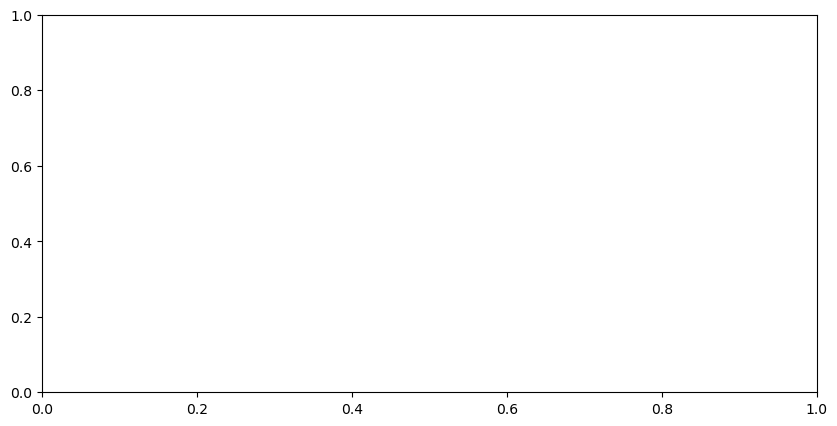

In [44]:
# Solution  monto_solicitado
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5), dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','monto_solicitado'], color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','monto_solicitado'], color="red", label="BUENO")

plt.title('Histograma')
plt.xlim(0,35000)
plt.legend()

In [ ]:
# Solution
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5), dpi=100)
sns.histplot( df.loc[df.Micro_60=='BUENO','porcentaje_cancelacion'], color="dodgerblue", label="BUENO")
sns.histplot( df.loc[df.Micro_60=='MALO','porcentaje_cancelacion'], color="deeppink", label="MALO")

plt.title('% de Cancelacion por Buen y Mal Cliente')
plt.legend()

In [ ]:
# endeudamiento_promedio 
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5),dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','endeudamiento_promedio'], color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','pendeudamiento_promedio'], color="red", label="MALO")

plt.title('Distribucion Endeudamiento Promedio')
plt.legend()

In [ ]:
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5),dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','cuota_estimada_buro'], color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','cuota_estimada_buro '], color="red", label="MALO")

plt.title('Distribucion Cuoto Estimada Buro')
plt.legend()

In [ ]:
# Solution
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5),dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','plazo_meses'], color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','plazo_meses'], color="red", label="MALO")

plt.title('Distribucion Plazo_Meses')
plt.xlim(0,100)
plt.legend()

In [ ]:
# periodos_plazo
# Solution
import seaborn as sns
df = df_cliente

plt.subplots(figsize=(10,5),dpi=100)
sns.distplot( df.loc[df.Micro_60=='BUENO','periodos_plazo'], color="blue", label="BUENO")
sns.distplot( df.loc[df.Micro_60=='MALO','periodos_plazo'], color="red", label="MALO")

plt.title('Distribucion Nuemor de Periodos')
plt.xlim(0,100)
plt.legend()

In [ ]:
import plotly.offline as py
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=True)

In [ ]:
from plotly.offline import init_notebook_mode,iplot
import plotly.graph_objects as go
import cufflinks as cf
init_notebook_mode(connected=True)

In [ ]:
import plotly.express as px
df = df_cliente 
#df = px.data.tips()
fig = px.histogram(df, x="monto_aprobado", color = "peor_calificacion")
fig.show()

In [ ]:
import chart_studio.plotly as py
import plotly.figure_factory as ff
import pandas as pd
import numpy as np  
%matplotlib inline  
from plotly import __version__ 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()


df = df_cliente 

# Add histogram data
x1 = np.log( df.loc[df.Micro_60=='BUENO','monto_aprobado'])
x2 = np.log( df.loc[df.Micro_60=='MALO','monto_aprobado'])

# Group data together
hist_data = [x1, x2]

group_labels = ['BUENO', 'MALO']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Plot!
py.iplot(fig, filename='Distplot prueba')

In [ ]:
import plotly.express as px
  
df = px.data.tips()
  
fig = px.histogram(df, x="monto_aprobado", color = "Micro_60")
fig.show()

In [ ]:
import seaborn as sns
sns.set_style("white")

# Import data
df = df_cliente
x1 = df.loc[df.Micro_60=='BUENO', 'monto_aprobado']
x2 = df.loc[df.Micro_60=='MALO', 'monto_aprobado']

# Plot
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

plt.figure(figsize=(10,7), dpi= 80)
sns.distplot(x1, color="blue", label="BUENO", **kwargs)
sns.distplot(x2, color="red", label="MALO", **kwargs)

#plt.xlim(0,5000)
plt.legend();a

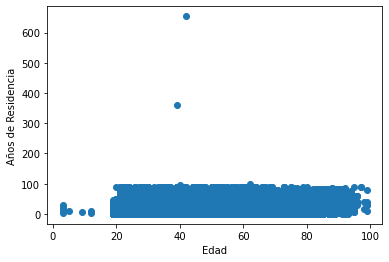

In [93]:
plt.scatter(antiguedad.edad1,antiguedad.antiguedad_reside)
plt.ylabel('Años de Residencia')
plt.xlabel('Edad')
plt.show()

# CREDIT SCORE

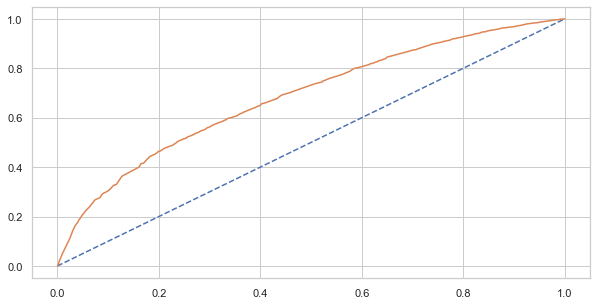

In [1595]:
# roc curve
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from matplotlib import pyplot
# generate 2 class dataset
#X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)
# split into train/test sets
#trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.5, random_state=2)
# fit a model
model = LogisticRegression()
model.fit(X_train, y_train)
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot no skill
pyplot.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
pyplot.plot(fpr, tpr)
# show the plot
pyplot.show()

In [1594]:

# roc auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
# generate 2 class dataset
#X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)
# split into train/test sets
#trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.5, random_state=2)
# fit a model
model = LogisticRegression()
model.fit(X_train, y_train)
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate roc auc
auc = roc_auc_score(y_test, probs)
print(auc)

0.6839393795552674


In [1597]:
X_test.head(3)

,des_estado_civil_CASADO_UNION_UNION,des_estado_civil_SOL_VIU_DIVO,cliente_nuevo_NO,cliente_nuevo_SI,des_sector_SECTOR RURAL,des_sector_SECTOR URBANO,ventas_quintil_<= 6500,ventas_quintil_> 6500,ing_gas_quintil_<= Prom 3757,ing_gas_quintil_> Prom 3757,act_pas_quintil_<= 4.72,act_pas_quintil_> 4.72,endeudprom_B_<= 1264,endeudprom_B_> 1264,periodosplazo_B_12 - 24,periodosplazo_B_24 - 36,periodosplazo_B_6 - 12,periodosplazo_B_<= 5,periodosplazo_B_> 36
13,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0
49,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
63,1,0,0,1,0,1,1,0,1,0,1,0,1,0,0,1,0,0,0
